# Writing a training loop from scratch
https://www.tensorflow.org/guide/keras/writing_a_training_loop_from_scratch

## Import libraries

In [1]:
# Python libraries
import os
import pandas as pd # for data manipulation
import numpy as np # for data manipulation
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


# To enable LaTeX and select a font
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": "Helvetica",
})

# Using ipynb import functions defined in other nb
from ipynb.fs.defs.myfun_load_dataset import *
from ipynb.fs.full.myfun_models import *
from ipynb.fs.full.myfun_nn import *
from ipynb.fs.full.myfun_opt import *
from ipynb.fs.defs.myfun_plot import *

2023-08-28 10:10:34.498073: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Tensorflow/Keras: 2.11.0
sklearn: 1.3.0


## Data Acquisition

In [2]:
# Load the dataset
par_dir = os.path.dirname(os.getcwd()) # parent dir
dir_name = par_dir + "/NN-interaction"
merged_df, dflist = load_dataset(dir_name, 'post')

## Create the model NN

In [3]:
# Create the model
DOE =[[1,2,1]] #Design of experiment
model = create_model(DOE[0])

## Get $v_{0}$ mean over each df looping on dflist

In [4]:
# params
NUM_EPOCHS = 200
LEARNING_RATE_NN = 0.1
LEARNING_RATE_v0 = 0.5
flag_print = True

In df n.1/10 we have 28 scenes
------------------------------------------------------------

Scene n.0/28, time interval:[14.24,14.64]
----------------------------------------------------------------------------------------------------


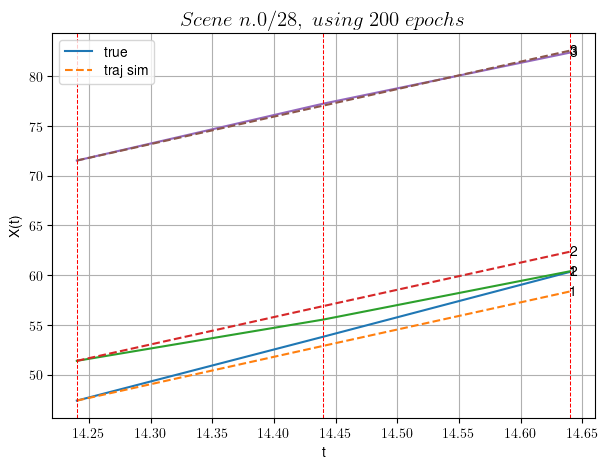

            Loss: 1.1669155248630056
            v0 updated: 27.638873683178705
----------------------------------------------------------------------------------------------------

Scene n.1/28, time interval:[23.64,24.64]
----------------------------------------------------------------------------------------------------


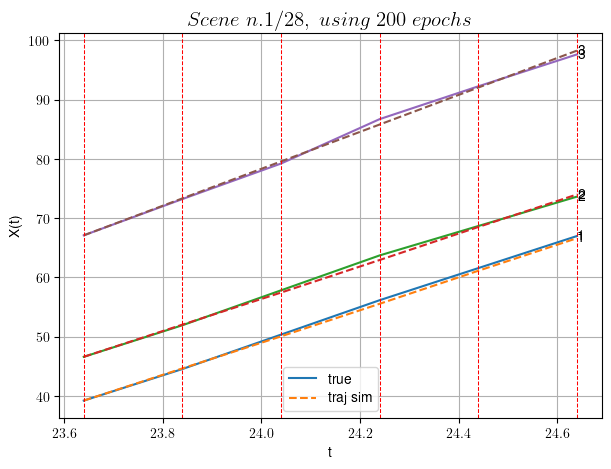

            Loss: 0.17461963417344883
            v0 updated: 31.183120056293088
----------------------------------------------------------------------------------------------------

Scene n.2/28, time interval:[72.44,73.44]
----------------------------------------------------------------------------------------------------


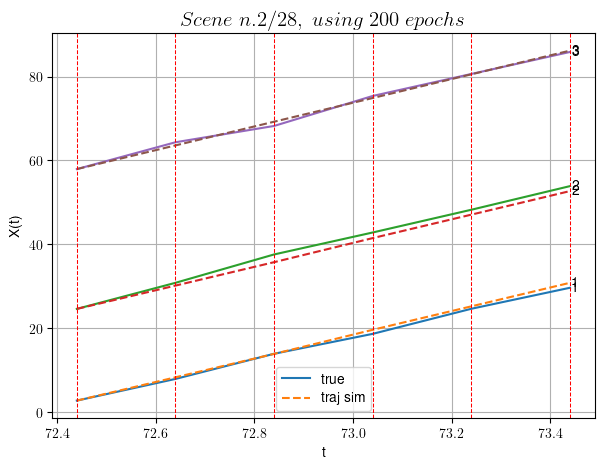

            Loss: 0.7298870677744008
            v0 updated: 28.25284108639968
----------------------------------------------------------------------------------------------------

Scene n.3/28, time interval:[84.24,84.84]
----------------------------------------------------------------------------------------------------


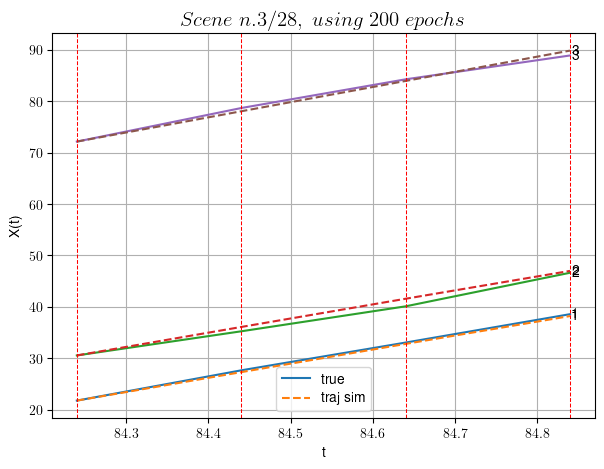

            Loss: 0.3949290128852662
            v0 updated: 29.49492078688976
----------------------------------------------------------------------------------------------------

Scene n.4/28, time interval:[131.64,132.04]
----------------------------------------------------------------------------------------------------


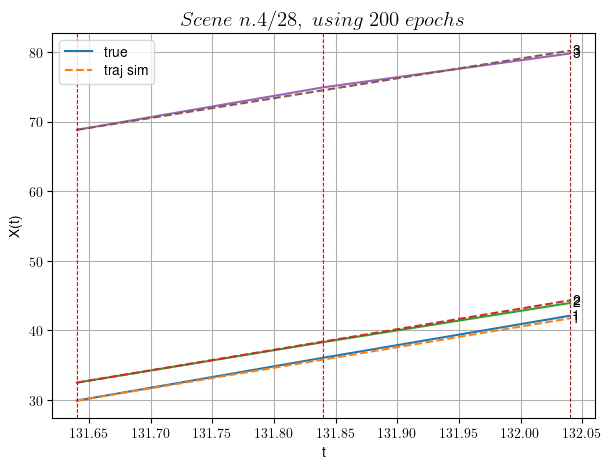

            Loss: 0.07871141595235909
            v0 updated: 28.44460242678685
----------------------------------------------------------------------------------------------------

Scene n.5/28, time interval:[148.04,148.44]
----------------------------------------------------------------------------------------------------


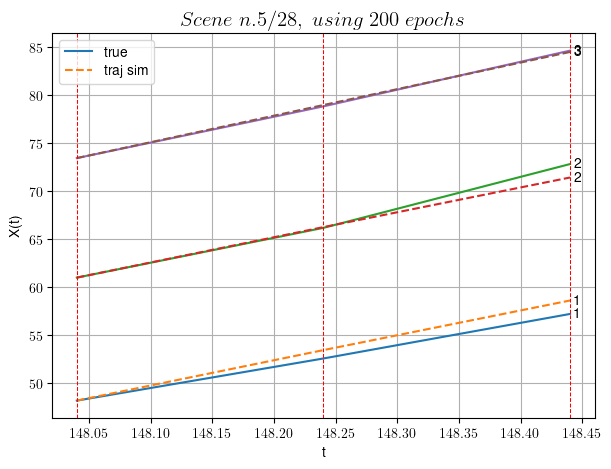

            Loss: 0.5249261951740155
            v0 updated: 27.624268173797052
----------------------------------------------------------------------------------------------------

Scene n.6/28, time interval:[161.64,162.04]
----------------------------------------------------------------------------------------------------


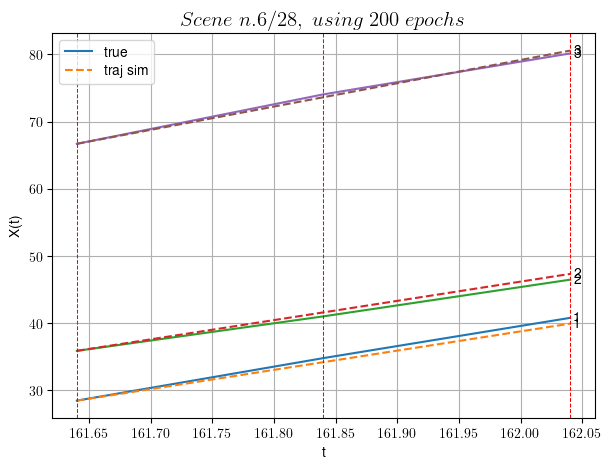

            Loss: 0.2837752361202915
            v0 updated: 34.70664156222626
----------------------------------------------------------------------------------------------------

Scene n.7/28, time interval:[164.04,164.64]
----------------------------------------------------------------------------------------------------


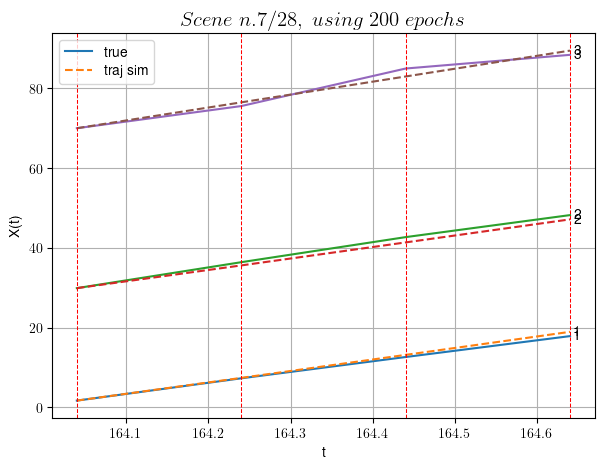

            Loss: 0.9151555496824949
            v0 updated: 32.430179643519104
----------------------------------------------------------------------------------------------------

Scene n.8/28, time interval:[215.64,216.04]
----------------------------------------------------------------------------------------------------


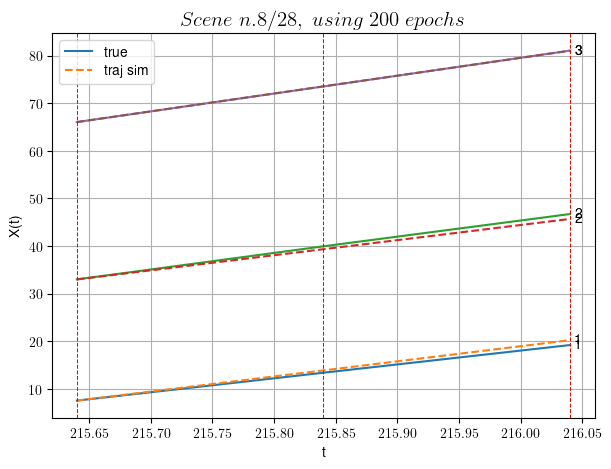

            Loss: 0.302065580810477
            v0 updated: 37.47556118388204
----------------------------------------------------------------------------------------------------

Scene n.9/28, time interval:[216.64,217.04]
----------------------------------------------------------------------------------------------------


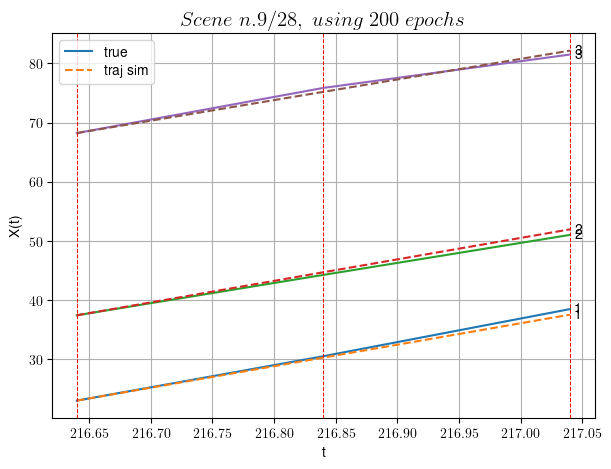

            Loss: 0.3231894646886742
            v0 updated: 34.84649774220546
----------------------------------------------------------------------------------------------------

Scene n.10/28, time interval:[240.64,241.04]
----------------------------------------------------------------------------------------------------


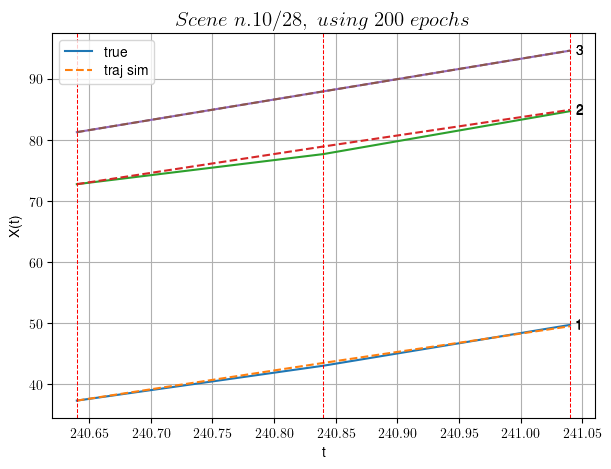

            Loss: 0.20491069866610293
            v0 updated: 33.34109723927839
----------------------------------------------------------------------------------------------------

Scene n.11/28, time interval:[253.64,254.04]
----------------------------------------------------------------------------------------------------


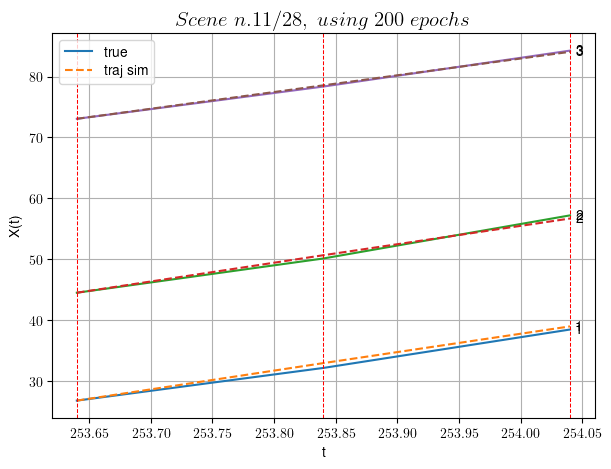

            Loss: 0.16907673672324064
            v0 updated: 27.47765219817996
----------------------------------------------------------------------------------------------------

Scene n.12/28, time interval:[262.64,263.64]
----------------------------------------------------------------------------------------------------


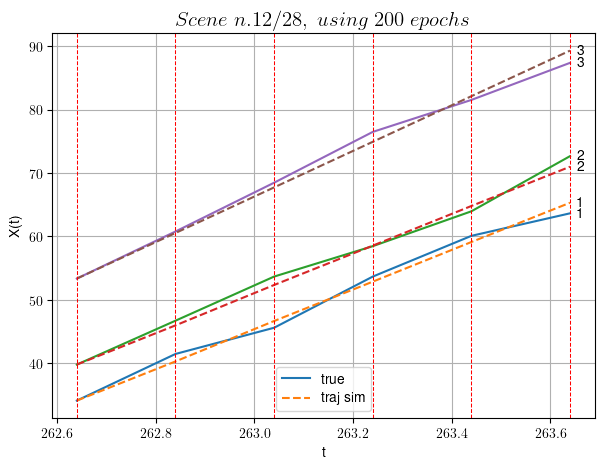

            Loss: 1.0973169648481684
            v0 updated: 35.92458500353821
----------------------------------------------------------------------------------------------------

Scene n.13/28, time interval:[314.84,315.64]
----------------------------------------------------------------------------------------------------


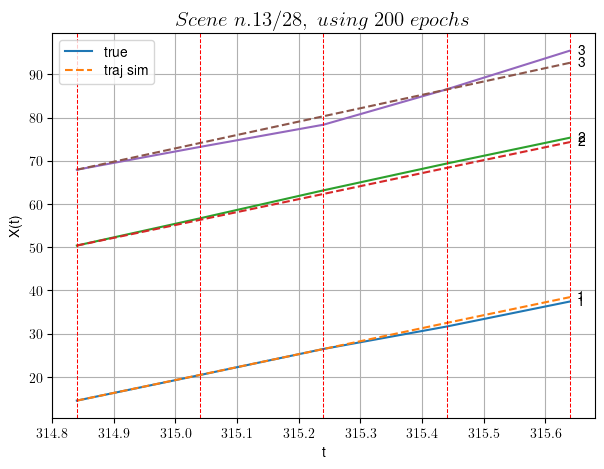

            Loss: 1.144361511143767
            v0 updated: 30.925230826449667
----------------------------------------------------------------------------------------------------

Scene n.14/28, time interval:[325.24,326.44]
----------------------------------------------------------------------------------------------------


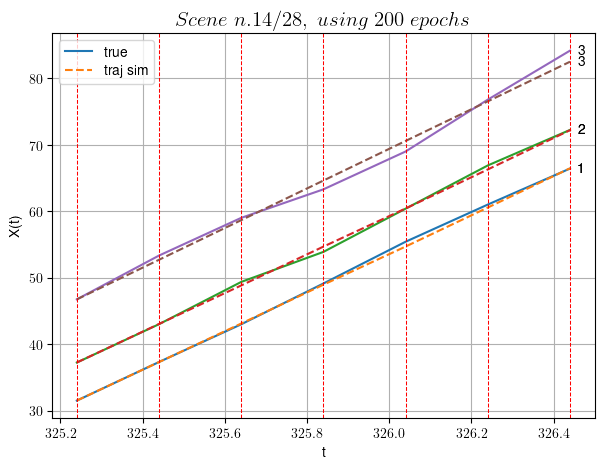

            Loss: 0.46231104335713535
            v0 updated: 29.804248983551886
----------------------------------------------------------------------------------------------------

Scene n.15/28, time interval:[354.04,354.64]
----------------------------------------------------------------------------------------------------


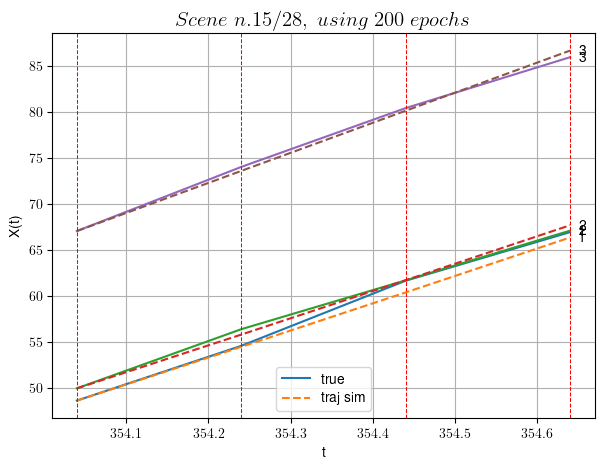

            Loss: 0.2872762542467948
            v0 updated: 32.690564649735926
----------------------------------------------------------------------------------------------------

Scene n.16/28, time interval:[363.44,364.04]
----------------------------------------------------------------------------------------------------


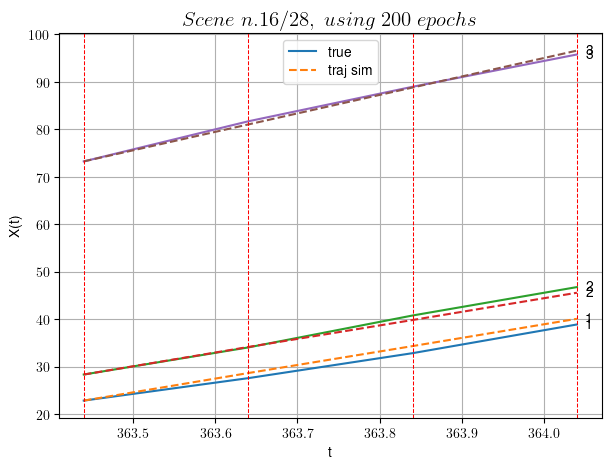

            Loss: 0.6882973244249807
            v0 updated: 38.91369632733983
----------------------------------------------------------------------------------------------------

Scene n.17/28, time interval:[386.64,387.44]
----------------------------------------------------------------------------------------------------


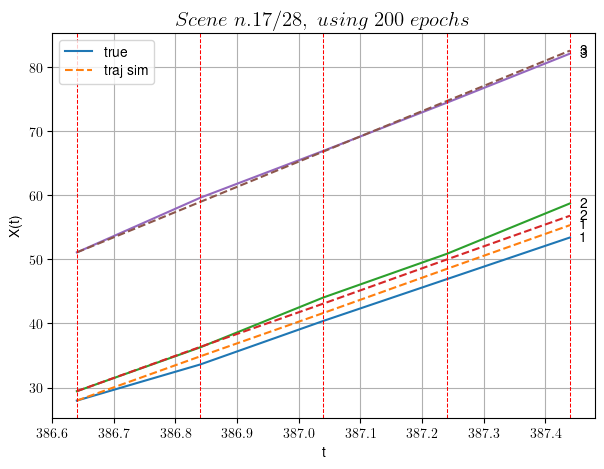

            Loss: 1.0328694510985723
            v0 updated: 39.33583802523491
----------------------------------------------------------------------------------------------------

Scene n.18/28, time interval:[431.84,432.24]
----------------------------------------------------------------------------------------------------


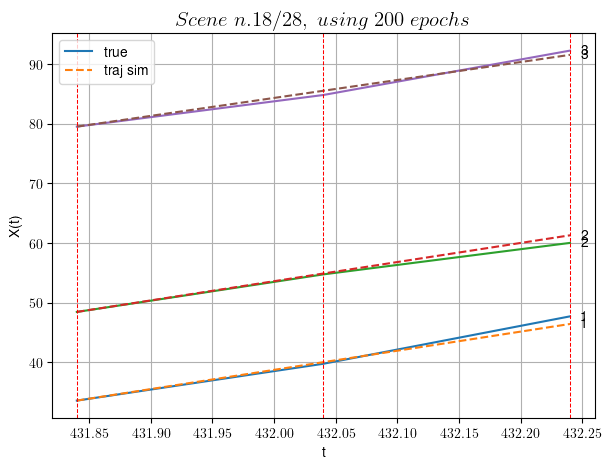

            Loss: 0.48418411872152783
            v0 updated: 30.08406922558775
----------------------------------------------------------------------------------------------------

Scene n.19/28, time interval:[446.24,446.84]
----------------------------------------------------------------------------------------------------


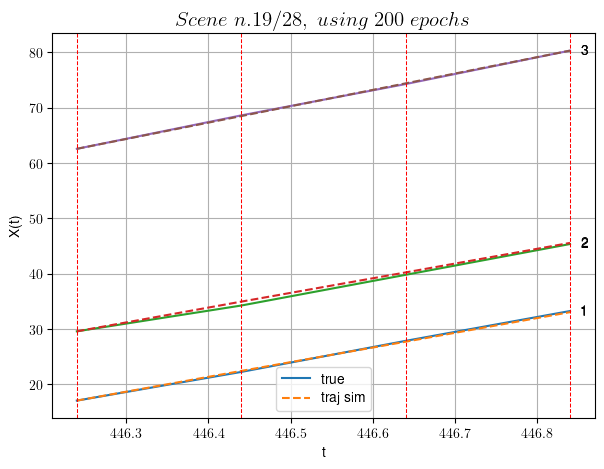

            Loss: 0.07127288365760241
            v0 updated: 29.554918451780917
----------------------------------------------------------------------------------------------------

Scene n.20/28, time interval:[447.44,448.04]
----------------------------------------------------------------------------------------------------


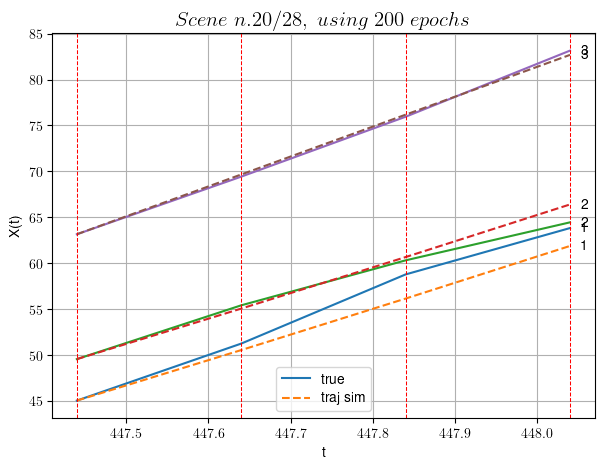

            Loss: 1.299719510871809
            v0 updated: 32.5820218344366
----------------------------------------------------------------------------------------------------

Scene n.21/28, time interval:[495.84,496.24]
----------------------------------------------------------------------------------------------------


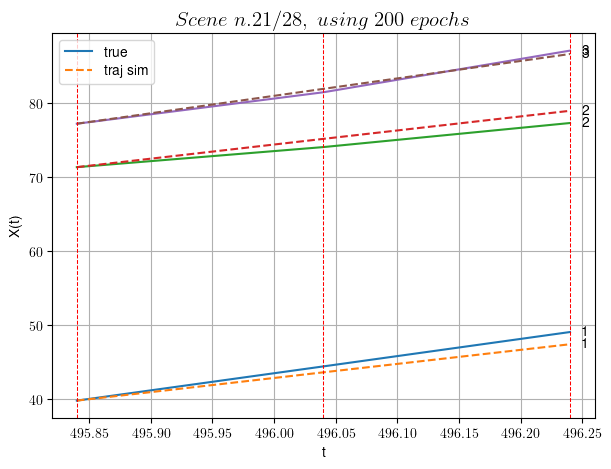

            Loss: 0.8615967009990994
            v0 updated: 23.570161299904782
----------------------------------------------------------------------------------------------------

Scene n.22/28, time interval:[496.84,497.64]
----------------------------------------------------------------------------------------------------


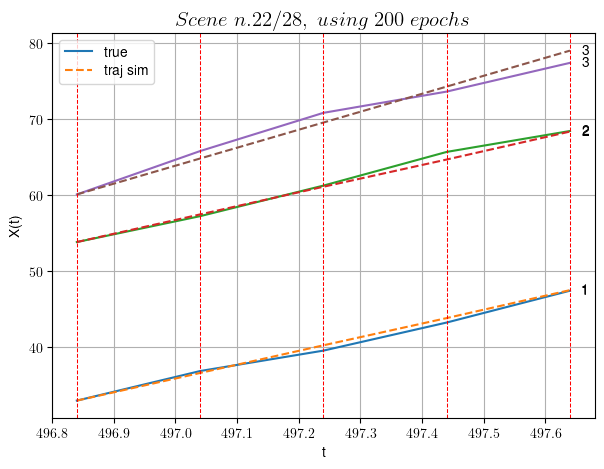

            Loss: 0.5072481926100189
            v0 updated: 23.67797143206563
----------------------------------------------------------------------------------------------------

Scene n.23/28, time interval:[499.04,499.44]
----------------------------------------------------------------------------------------------------


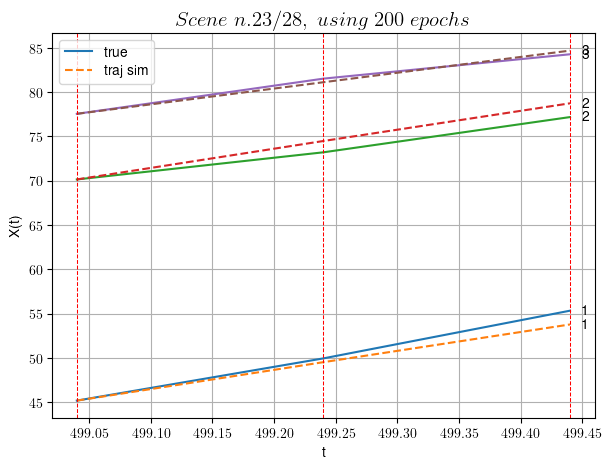

            Loss: 0.7756527367514844
            v0 updated: 17.845523963555102
----------------------------------------------------------------------------------------------------

Scene n.24/28, time interval:[500.64,501.04]
----------------------------------------------------------------------------------------------------


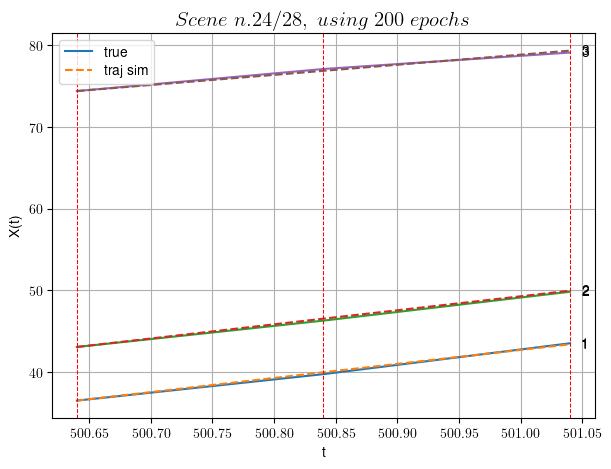

            Loss: 0.028112743979043106
            v0 updated: 12.38073766898182
----------------------------------------------------------------------------------------------------

Scene n.25/28, time interval:[502.24,503.04]
----------------------------------------------------------------------------------------------------


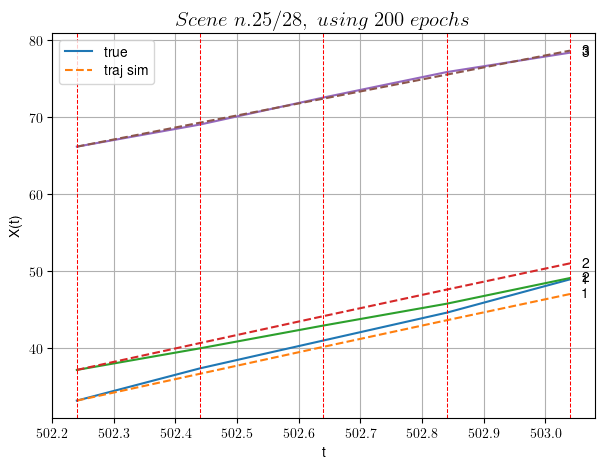

            Loss: 1.000827657226351
            v0 updated: 15.596848958505237
----------------------------------------------------------------------------------------------------

Scene n.26/28, time interval:[534.84,535.24]
----------------------------------------------------------------------------------------------------


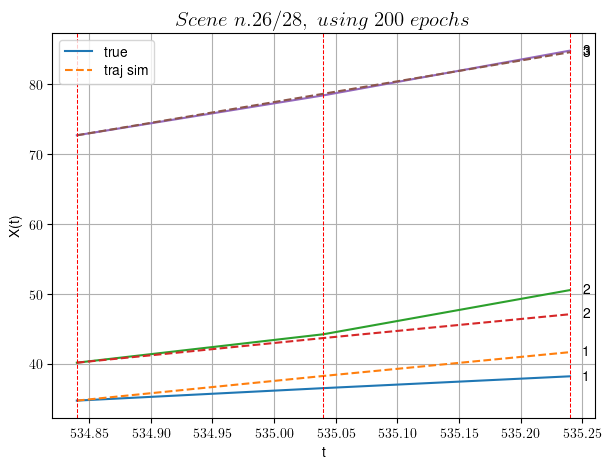

            Loss: 3.0435613296624466
            v0 updated: 29.753753037486266
----------------------------------------------------------------------------------------------------

Scene n.27/28, time interval:[573.84,574.44]
----------------------------------------------------------------------------------------------------


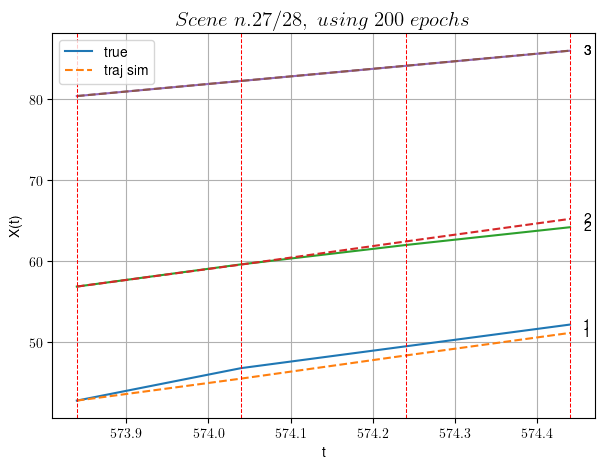

            Loss: 0.43925300230819975
            v0 updated: 9.361406021746825
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 28.932693265541623
Time taken: 154.04s
In df n.2/10 we have 18 scenes
------------------------------------------------------------

Scene n.0/18, time interval:[86.16,86.96]
----------------------------------------------------------------------------------------------------


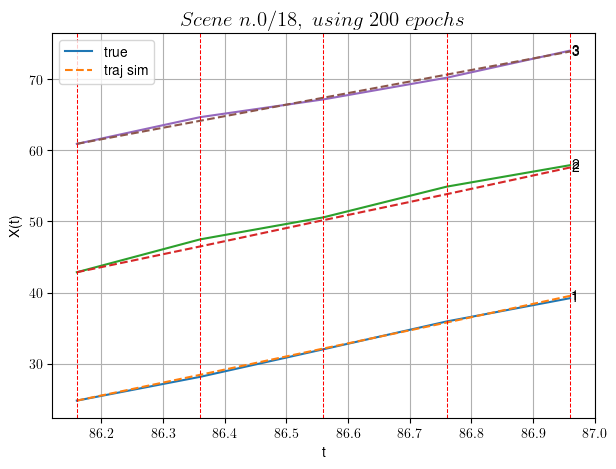

            Loss: 0.20828001171308383
            v0 updated: 16.25044385096199
----------------------------------------------------------------------------------------------------

Scene n.1/18, time interval:[109.36,110.16]
----------------------------------------------------------------------------------------------------


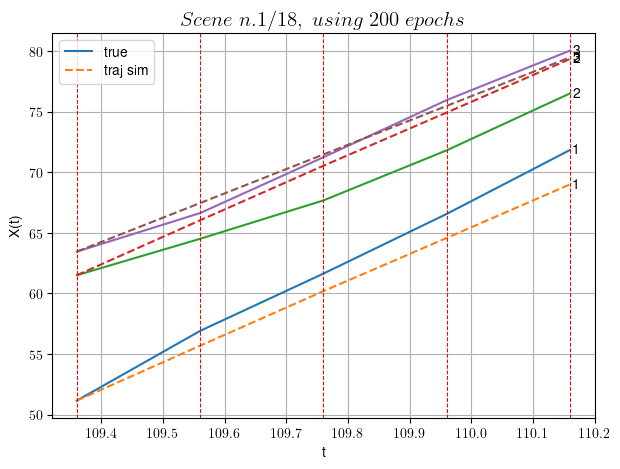

            Loss: 3.0105596170105646
            v0 updated: 20.044801660133817
----------------------------------------------------------------------------------------------------

Scene n.2/18, time interval:[170.36,171.16]
----------------------------------------------------------------------------------------------------


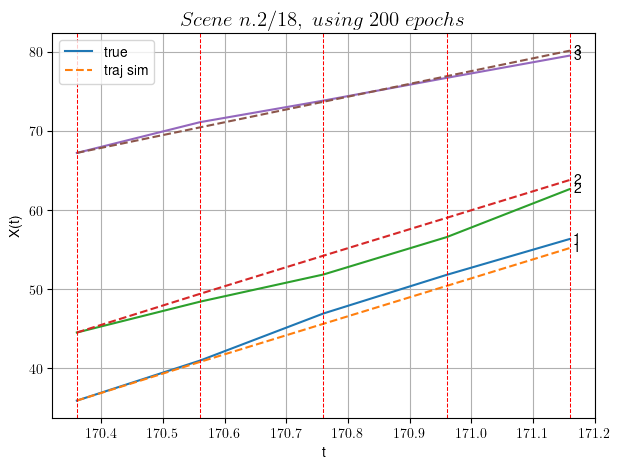

            Loss: 1.3181672877937032
            v0 updated: 16.166815108702973
----------------------------------------------------------------------------------------------------

Scene n.3/18, time interval:[179.36,180.16]
----------------------------------------------------------------------------------------------------


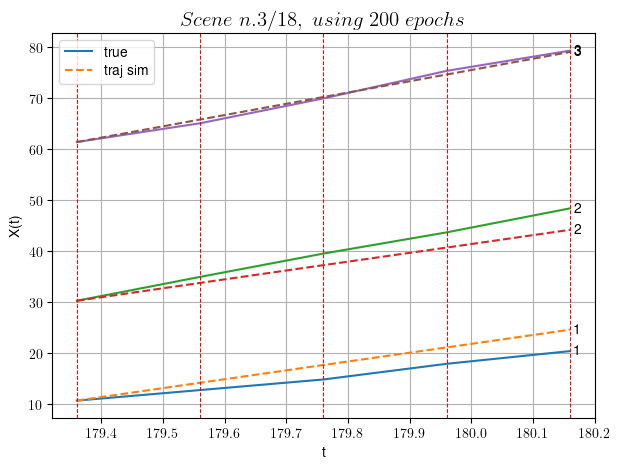

            Loss: 4.83559825068946
            v0 updated: 22.09069359979243
----------------------------------------------------------------------------------------------------

Scene n.4/18, time interval:[199.76,200.16]
----------------------------------------------------------------------------------------------------


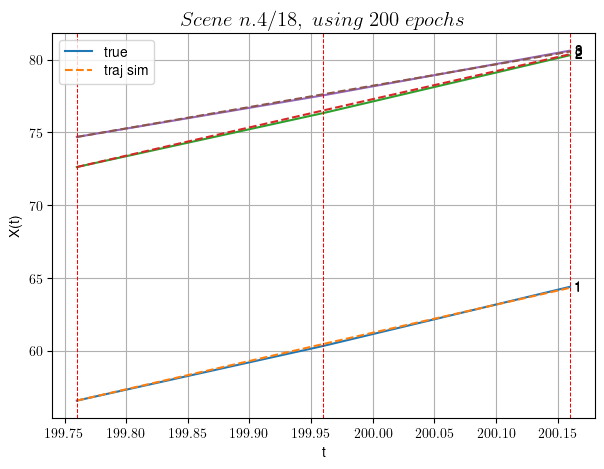

            Loss: 0.007640975306292695
            v0 updated: 14.66852263472198
----------------------------------------------------------------------------------------------------

Scene n.5/18, time interval:[212.56,213.36]
----------------------------------------------------------------------------------------------------


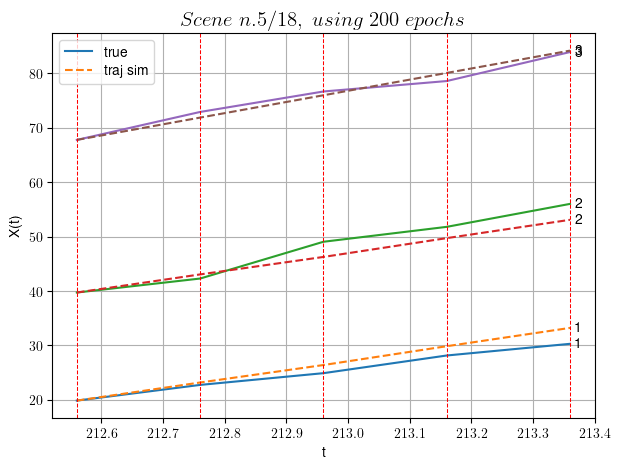

            Loss: 2.5984316938181666
            v0 updated: 20.517558612694323
----------------------------------------------------------------------------------------------------

Scene n.6/18, time interval:[318.16,318.76]
----------------------------------------------------------------------------------------------------


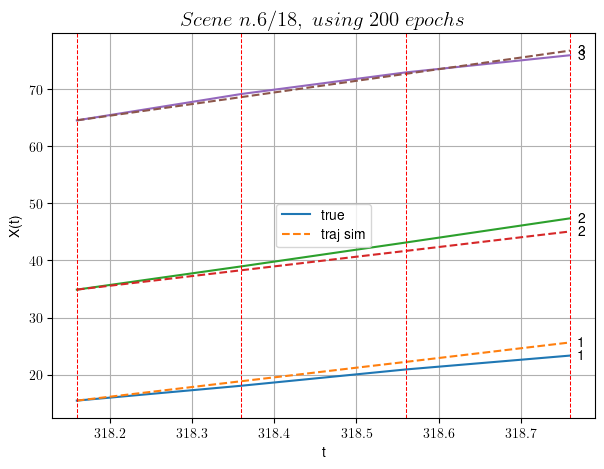

            Loss: 1.3841498736367717
            v0 updated: 20.365787750550588
----------------------------------------------------------------------------------------------------

Scene n.7/18, time interval:[430.16,430.96]
----------------------------------------------------------------------------------------------------


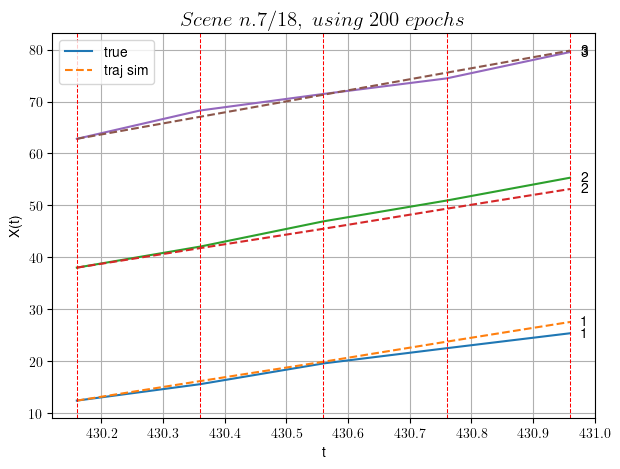

            Loss: 1.2595752219635155
            v0 updated: 21.24652473815916
----------------------------------------------------------------------------------------------------

Scene n.8/18, time interval:[435.96,436.36]
----------------------------------------------------------------------------------------------------


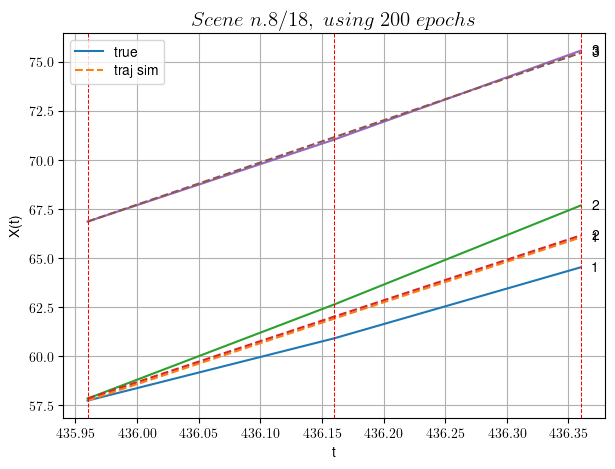

            Loss: 0.6713980914453427
            v0 updated: 21.46809393659045
----------------------------------------------------------------------------------------------------

Scene n.9/18, time interval:[442.76,443.76]
----------------------------------------------------------------------------------------------------


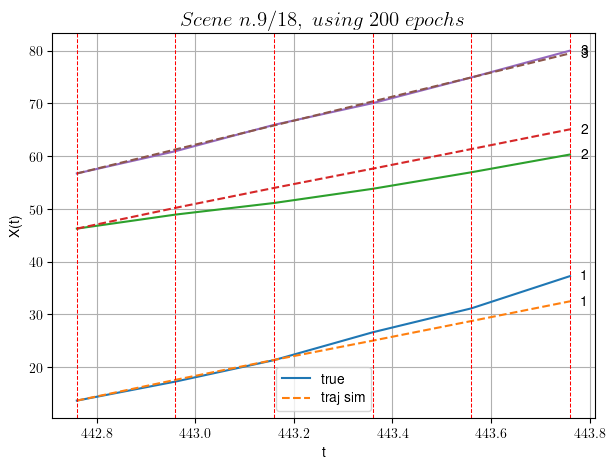

            Loss: 5.474290616104508
            v0 updated: 22.78382896397465
----------------------------------------------------------------------------------------------------

Scene n.10/18, time interval:[487.56,487.96]
----------------------------------------------------------------------------------------------------


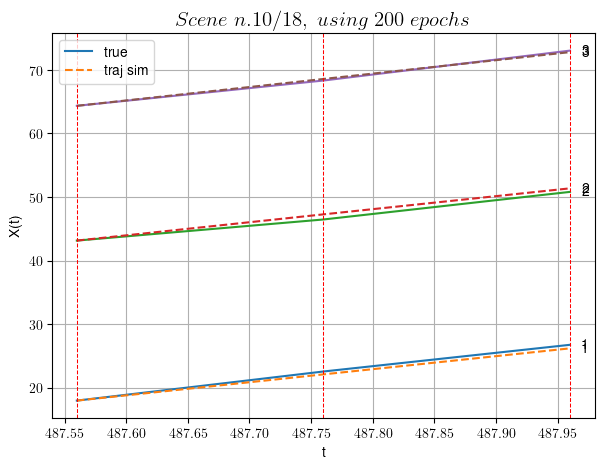

            Loss: 0.177005984282255
            v0 updated: 21.121659499827274
----------------------------------------------------------------------------------------------------

Scene n.11/18, time interval:[531.76,532.76]
----------------------------------------------------------------------------------------------------


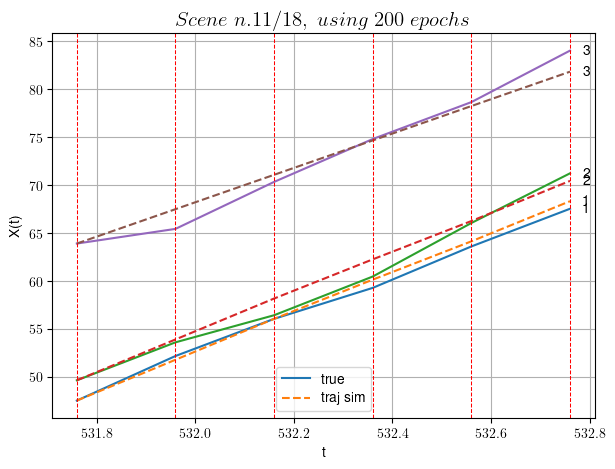

            Loss: 1.0324429113631268
            v0 updated: 17.925004407992073
----------------------------------------------------------------------------------------------------

Scene n.12/18, time interval:[538.36,539.16]
----------------------------------------------------------------------------------------------------


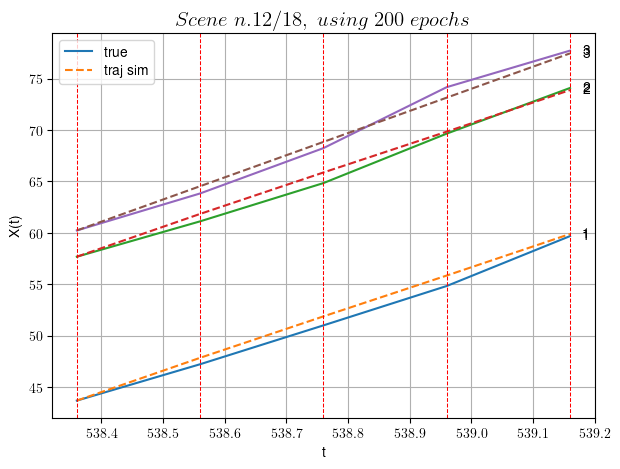

            Loss: 0.39122765425387085
            v0 updated: 21.528181738872128
----------------------------------------------------------------------------------------------------

Scene n.13/18, time interval:[541.16,542.36]
----------------------------------------------------------------------------------------------------


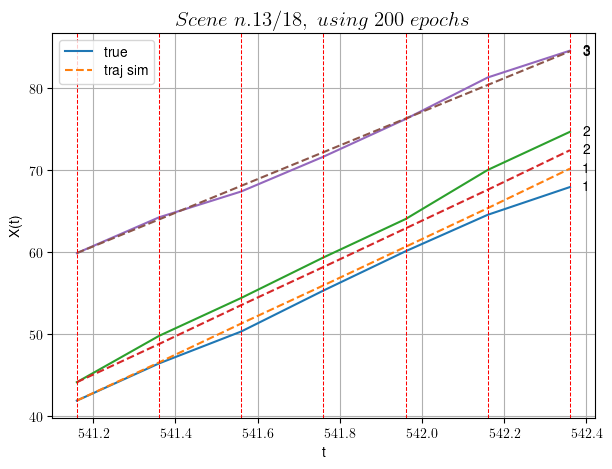

            Loss: 1.1571416020930503
            v0 updated: 20.50043309196578
----------------------------------------------------------------------------------------------------

Scene n.14/18, time interval:[549.76,550.16]
----------------------------------------------------------------------------------------------------


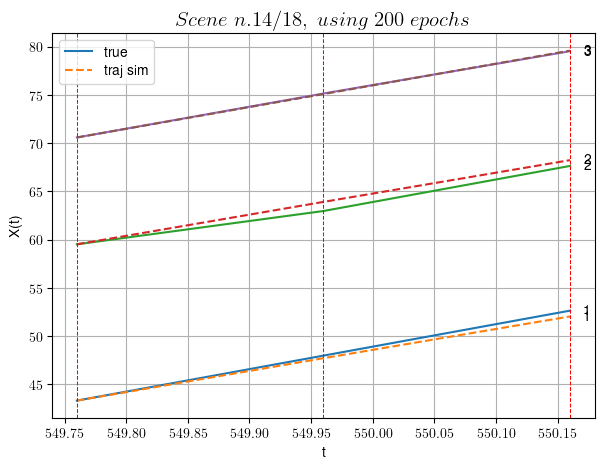

            Loss: 0.1875802248880658
            v0 updated: 22.503959325258233
----------------------------------------------------------------------------------------------------

Scene n.15/18, time interval:[566.76,567.16]
----------------------------------------------------------------------------------------------------


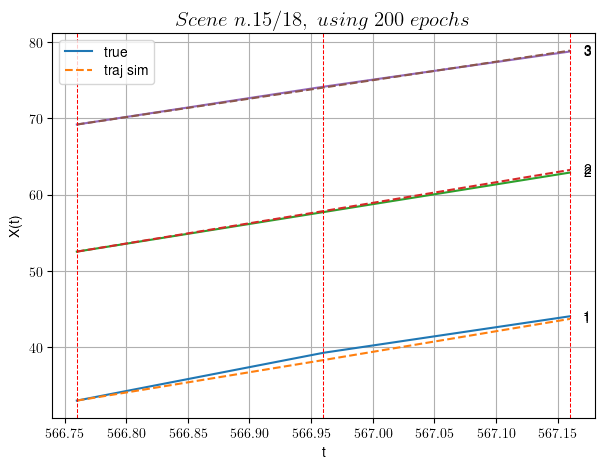

            Loss: 0.13229562802013756
            v0 updated: 24.228864140655777
----------------------------------------------------------------------------------------------------

Scene n.16/18, time interval:[87.56,88.16]
----------------------------------------------------------------------------------------------------


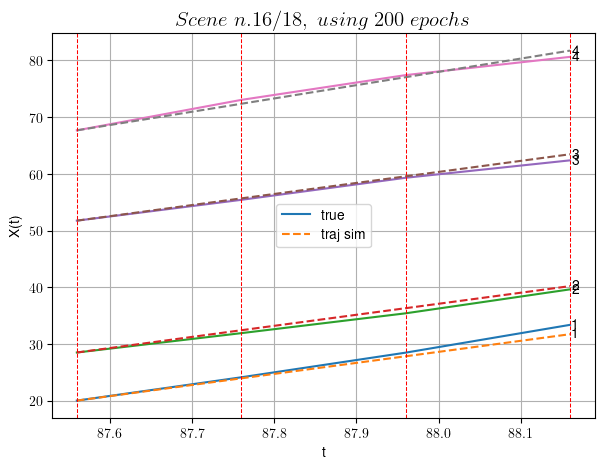

            Loss: 0.4802973314578022
            v0 updated: 23.439775970163954
----------------------------------------------------------------------------------------------------

Scene n.17/18, time interval:[305.96,306.36]
----------------------------------------------------------------------------------------------------


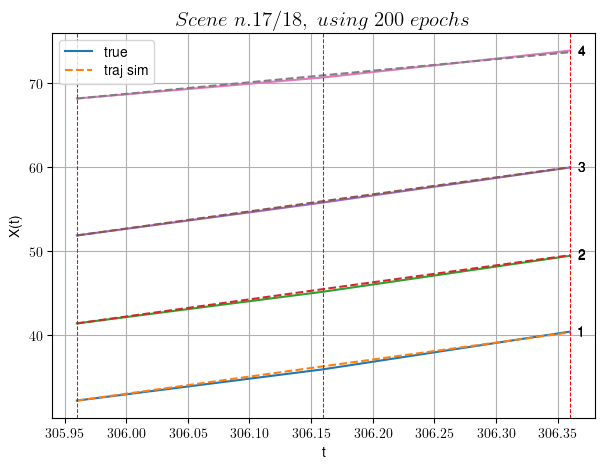

            Loss: 0.0298213442435897
            v0 updated: 13.781892213856752
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 21.567993269996194
Time taken: 150.86s
In df n.3/10 we have 55 scenes
------------------------------------------------------------

Scene n.0/55, time interval:[16.16,16.76]
----------------------------------------------------------------------------------------------------


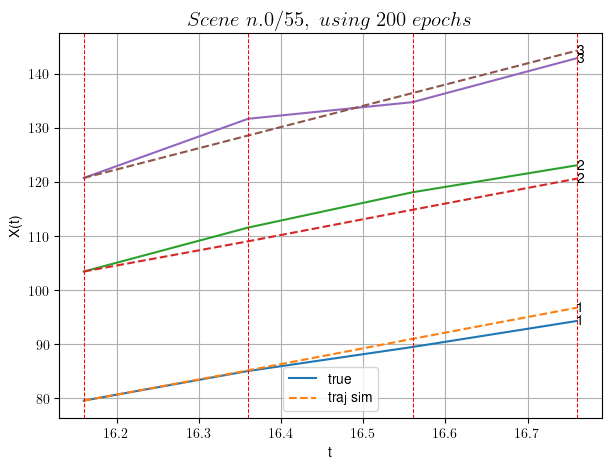

            Loss: 3.7991360945348824
            v0 updated: 39.21715010860685
----------------------------------------------------------------------------------------------------

Scene n.1/55, time interval:[17.56,17.96]
----------------------------------------------------------------------------------------------------


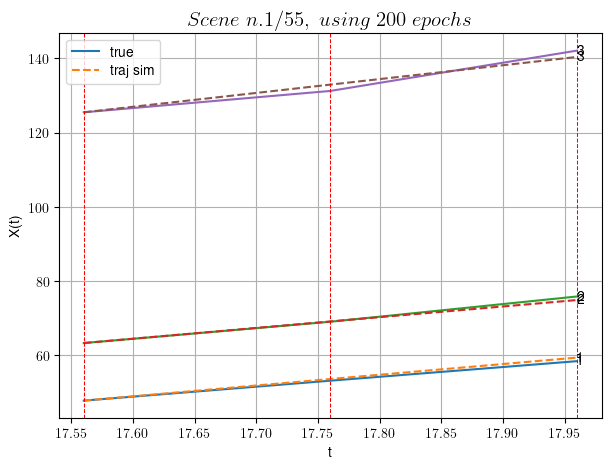

            Loss: 0.8741189295498938
            v0 updated: 37.33354775754679
----------------------------------------------------------------------------------------------------

Scene n.2/55, time interval:[23.96,24.76]
----------------------------------------------------------------------------------------------------


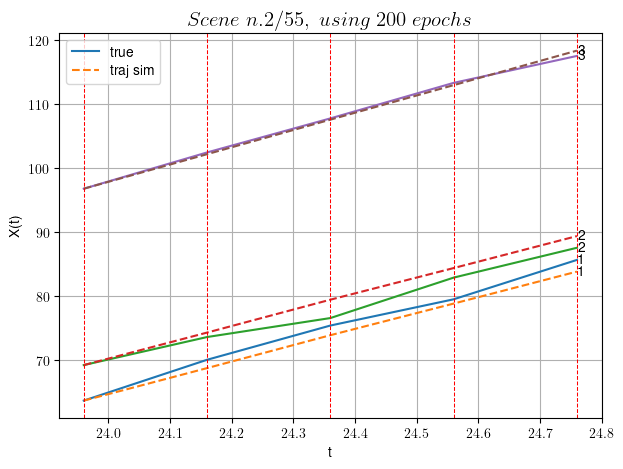

            Loss: 1.5372380915338943
            v0 updated: 27.019940095947995
----------------------------------------------------------------------------------------------------

Scene n.3/55, time interval:[42.96,43.76]
----------------------------------------------------------------------------------------------------


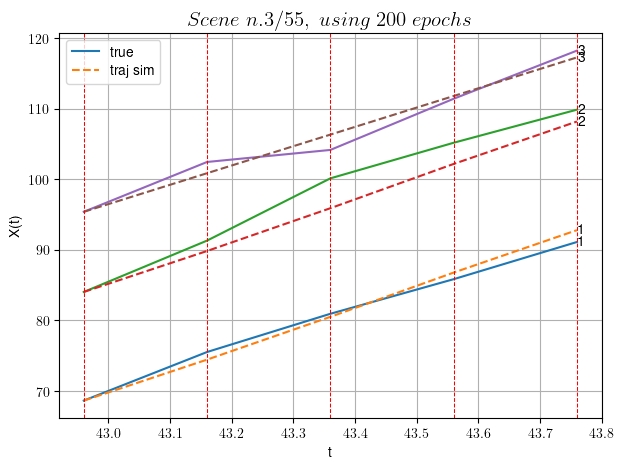

            Loss: 3.020812925927542
            v0 updated: 27.353582436749843
----------------------------------------------------------------------------------------------------

Scene n.4/55, time interval:[61.76,62.16]
----------------------------------------------------------------------------------------------------


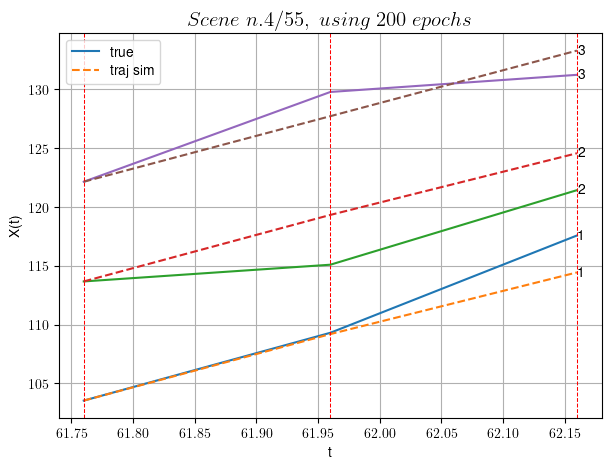

            Loss: 5.1091522333777695
            v0 updated: 27.832473006374567
----------------------------------------------------------------------------------------------------

Scene n.5/55, time interval:[63.76,64.16]
----------------------------------------------------------------------------------------------------


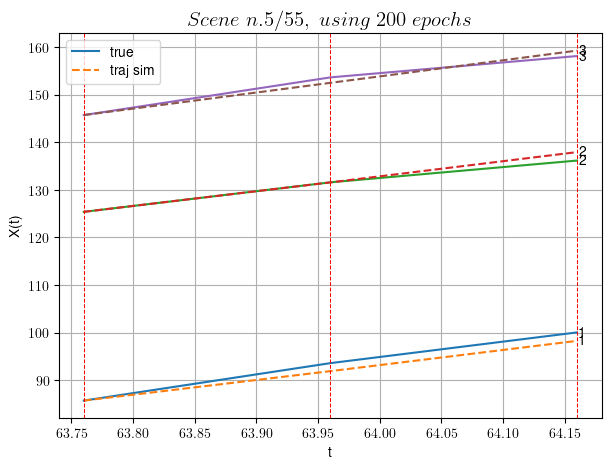

            Loss: 1.3038301450132919
            v0 updated: 33.83566643209178
----------------------------------------------------------------------------------------------------

Scene n.6/55, time interval:[67.16,67.76]
----------------------------------------------------------------------------------------------------


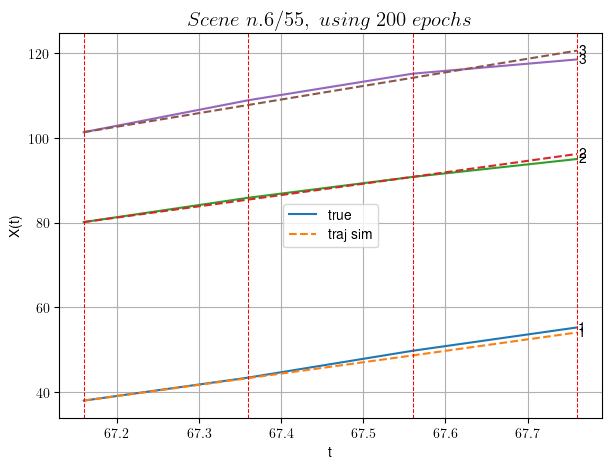

            Loss: 0.9009057483640293
            v0 updated: 32.13697253892425
----------------------------------------------------------------------------------------------------

Scene n.7/55, time interval:[72.76,74.16]
----------------------------------------------------------------------------------------------------


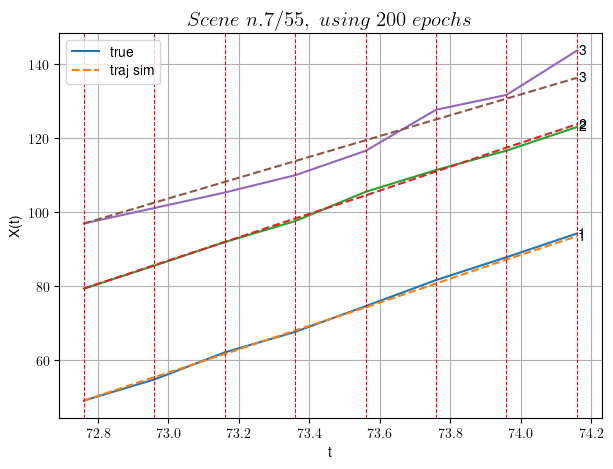

            Loss: 4.192558058096769
            v0 updated: 28.12330316633905
----------------------------------------------------------------------------------------------------

Scene n.8/55, time interval:[82.16,82.76]
----------------------------------------------------------------------------------------------------


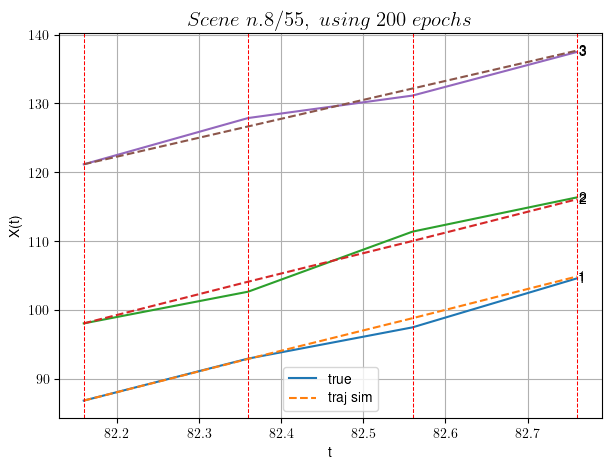

            Loss: 0.7045020146873151
            v0 updated: 27.552927285636404
----------------------------------------------------------------------------------------------------

Scene n.9/55, time interval:[86.16,86.76]
----------------------------------------------------------------------------------------------------


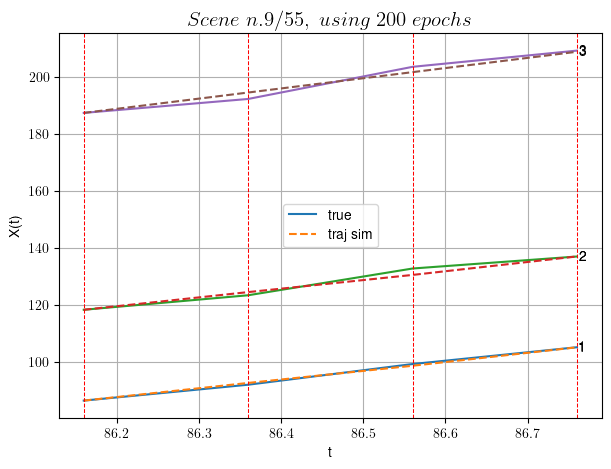

            Loss: 1.3144505416562786
            v0 updated: 35.758406855917755
----------------------------------------------------------------------------------------------------

Scene n.10/55, time interval:[130.96,131.96]
----------------------------------------------------------------------------------------------------


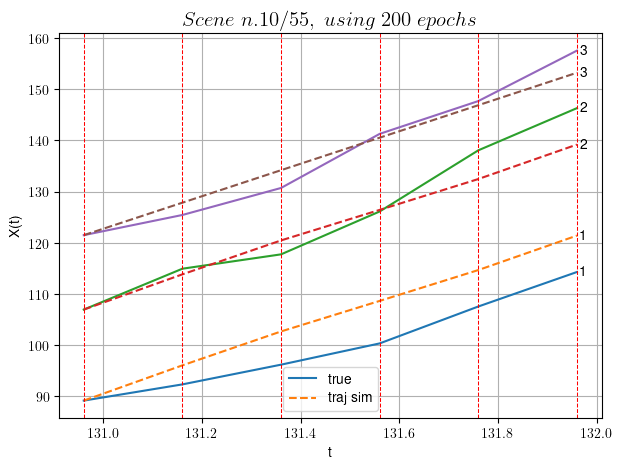

            Loss: 19.730305379289813
            v0 updated: 31.750413794800306
----------------------------------------------------------------------------------------------------

Scene n.11/55, time interval:[139.16,141.56]
----------------------------------------------------------------------------------------------------


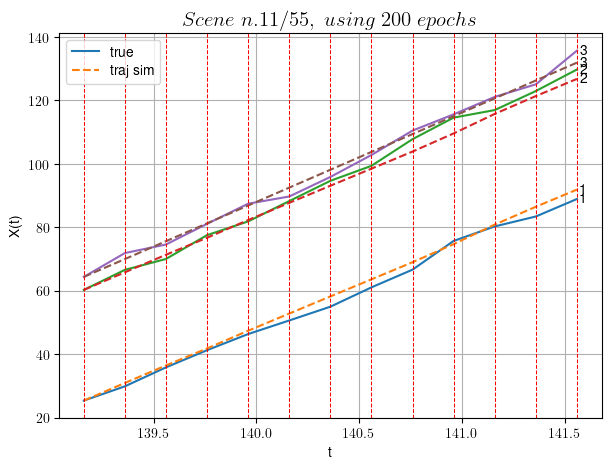

            Loss: 3.7352272501796833
            v0 updated: 28.146667787591962
----------------------------------------------------------------------------------------------------

Scene n.12/55, time interval:[143.76,144.36]
----------------------------------------------------------------------------------------------------


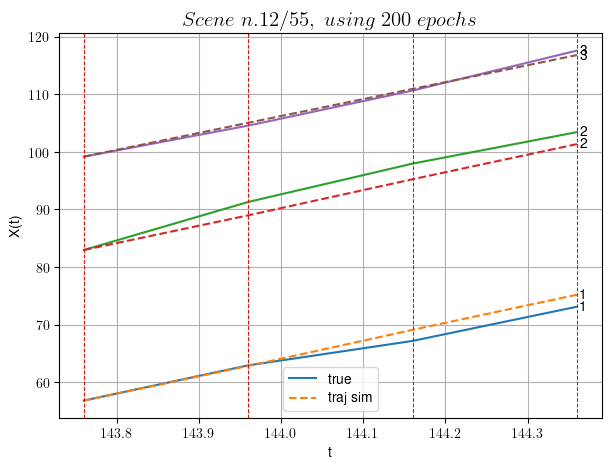

            Loss: 2.174639747026396
            v0 updated: 29.41538708161572
----------------------------------------------------------------------------------------------------

Scene n.13/55, time interval:[149.36,149.96]
----------------------------------------------------------------------------------------------------


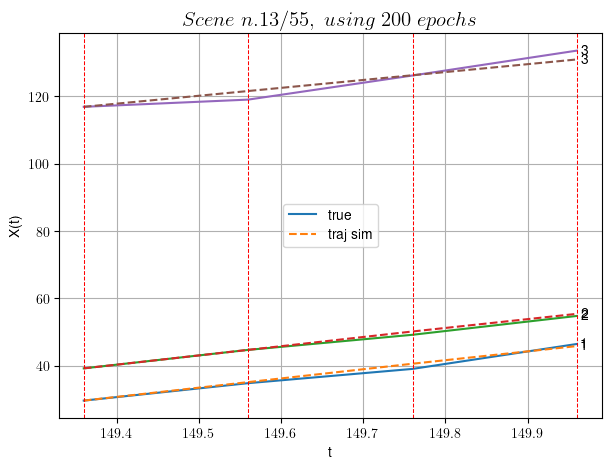

            Loss: 1.4649157223513163
            v0 updated: 23.450754392043912
----------------------------------------------------------------------------------------------------

Scene n.14/55, time interval:[156.16,156.76]
----------------------------------------------------------------------------------------------------


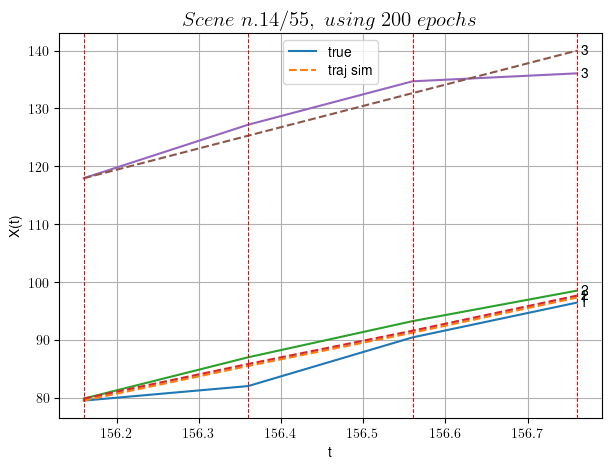

            Loss: 3.4597553972800372
            v0 updated: 36.77217279713218
----------------------------------------------------------------------------------------------------

Scene n.15/55, time interval:[207.96,208.76]
----------------------------------------------------------------------------------------------------


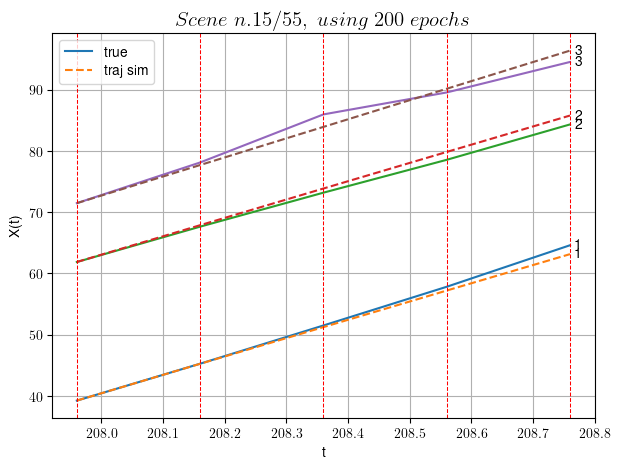

            Loss: 0.9968770072551134
            v0 updated: 31.123674479426654
----------------------------------------------------------------------------------------------------

Scene n.16/55, time interval:[218.16,219.16]
----------------------------------------------------------------------------------------------------


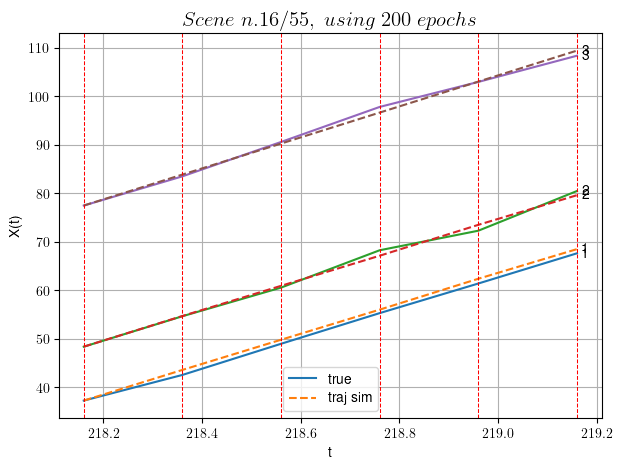

            Loss: 0.5731601246156511
            v0 updated: 31.94478783305763
----------------------------------------------------------------------------------------------------

Scene n.17/55, time interval:[222.96,223.76]
----------------------------------------------------------------------------------------------------


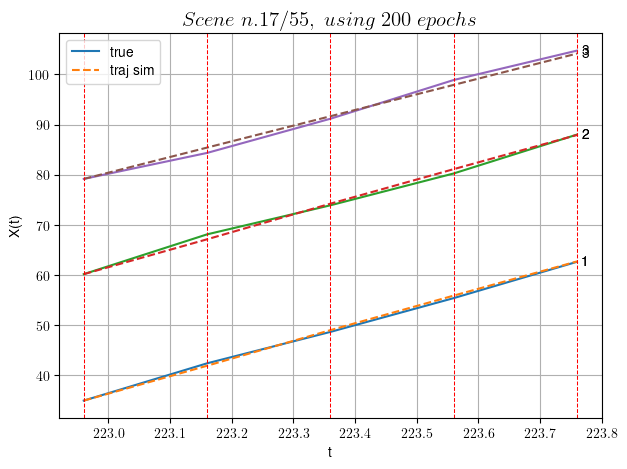

            Loss: 0.34102353018517834
            v0 updated: 31.27834550412877
----------------------------------------------------------------------------------------------------

Scene n.18/55, time interval:[247.36,248.56]
----------------------------------------------------------------------------------------------------


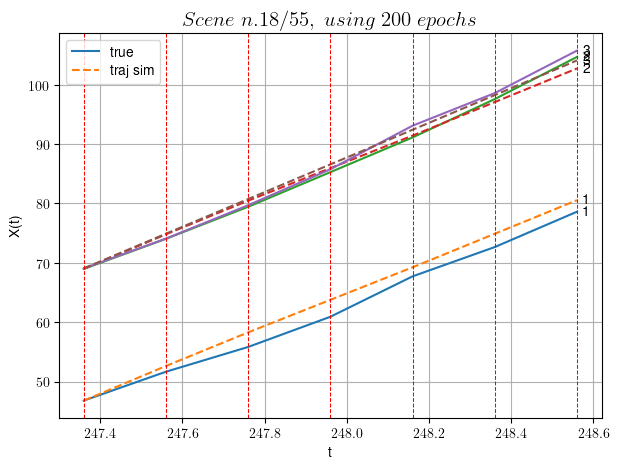

            Loss: 1.8195011474515903
            v0 updated: 29.200424002931012
----------------------------------------------------------------------------------------------------

Scene n.19/55, time interval:[269.56,270.96]
----------------------------------------------------------------------------------------------------


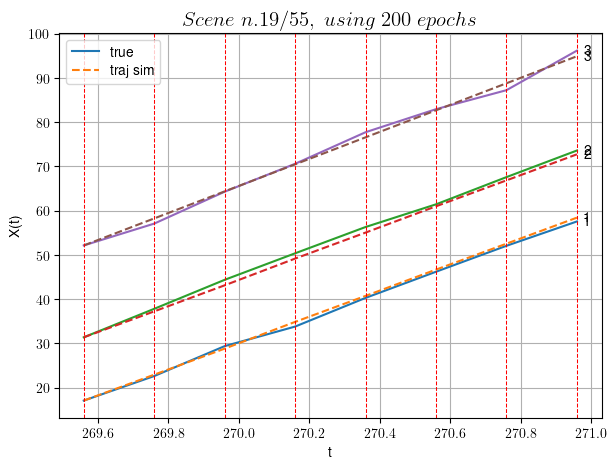

            Loss: 0.6733795875888634
            v0 updated: 30.538583647650018
----------------------------------------------------------------------------------------------------

Scene n.20/55, time interval:[316.16,316.56]
----------------------------------------------------------------------------------------------------


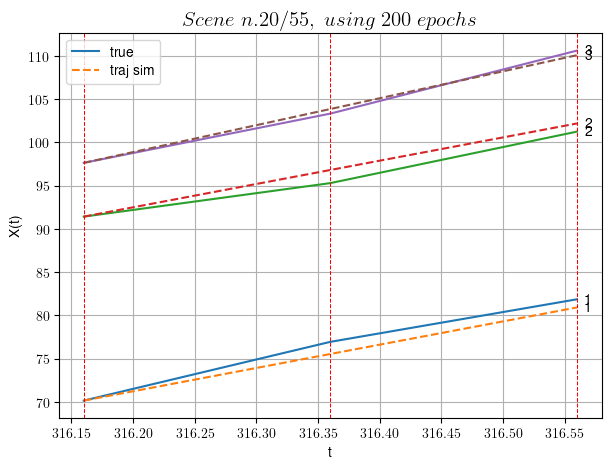

            Loss: 0.7338952924830976
            v0 updated: 31.118501827373837
----------------------------------------------------------------------------------------------------

Scene n.21/55, time interval:[317.76,318.56]
----------------------------------------------------------------------------------------------------


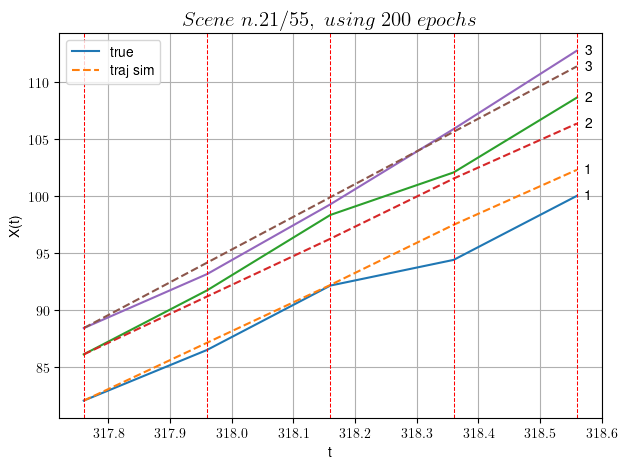

            Loss: 1.9089886827106757
            v0 updated: 28.731001411505467
----------------------------------------------------------------------------------------------------

Scene n.22/55, time interval:[325.76,326.96]
----------------------------------------------------------------------------------------------------


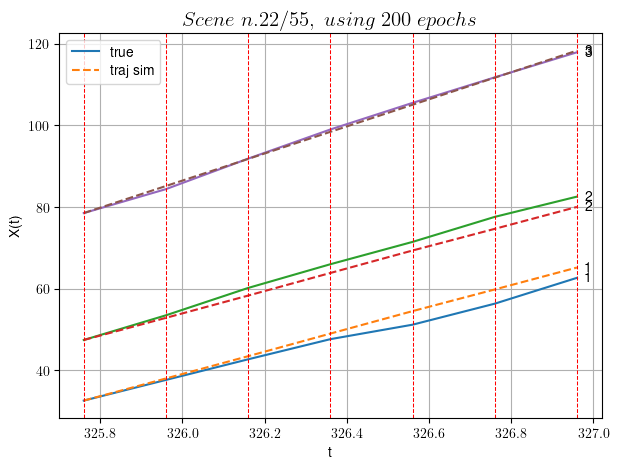

            Loss: 2.9129313295933734
            v0 updated: 33.13210942893414
----------------------------------------------------------------------------------------------------

Scene n.23/55, time interval:[335.76,336.16]
----------------------------------------------------------------------------------------------------


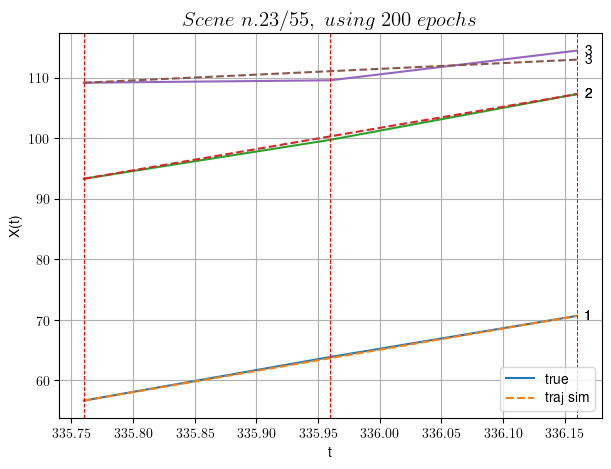

            Loss: 0.5398193119908694
            v0 updated: 9.51819454011644
----------------------------------------------------------------------------------------------------

Scene n.24/55, time interval:[371.16,371.76]
----------------------------------------------------------------------------------------------------


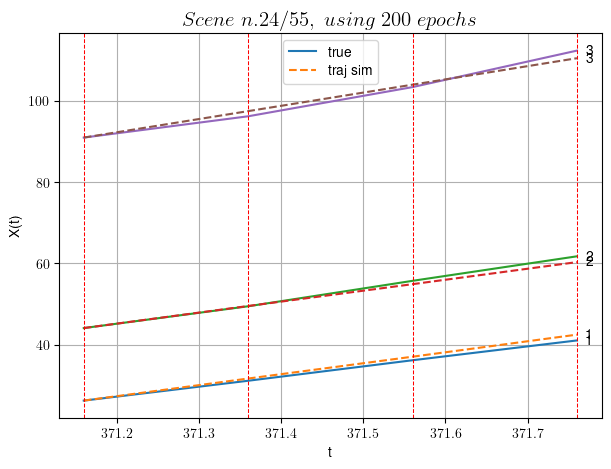

            Loss: 0.93868427497265
            v0 updated: 32.53671918608213
----------------------------------------------------------------------------------------------------

Scene n.25/55, time interval:[387.36,388.16]
----------------------------------------------------------------------------------------------------


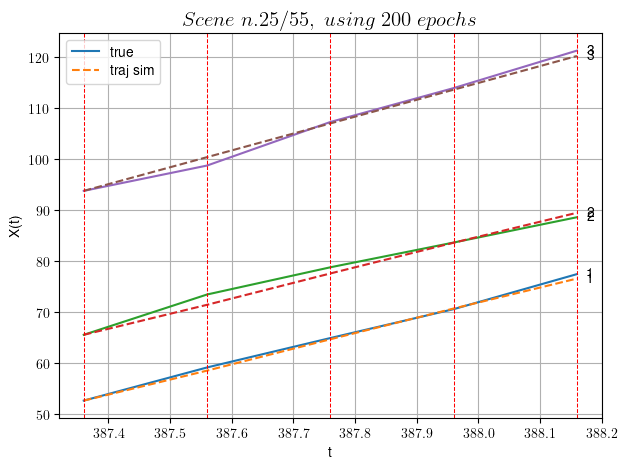

            Loss: 0.7667661385413199
            v0 updated: 33.02856902380123
----------------------------------------------------------------------------------------------------

Scene n.26/55, time interval:[390.36,390.76]
----------------------------------------------------------------------------------------------------


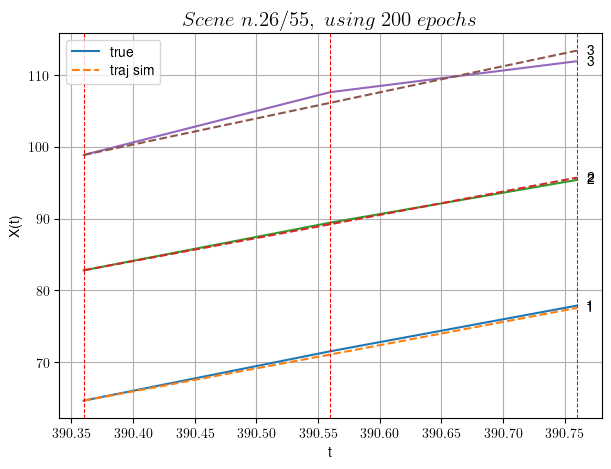

            Loss: 0.5367480781255706
            v0 updated: 36.3472833737466
----------------------------------------------------------------------------------------------------

Scene n.27/55, time interval:[427.96,428.76]
----------------------------------------------------------------------------------------------------


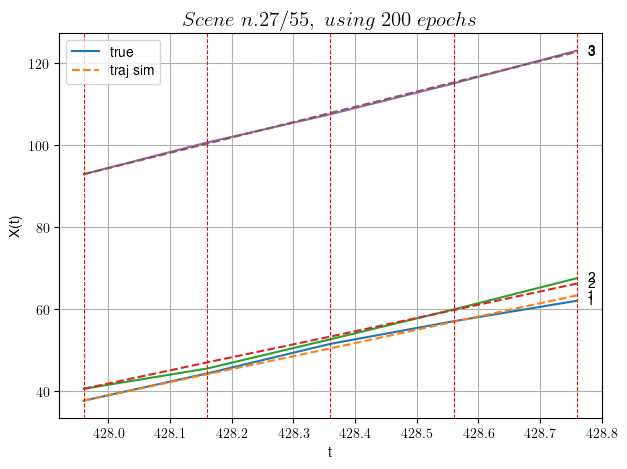

            Loss: 0.5171211457263327
            v0 updated: 37.34178593555988
----------------------------------------------------------------------------------------------------

Scene n.28/55, time interval:[439.36,439.96]
----------------------------------------------------------------------------------------------------


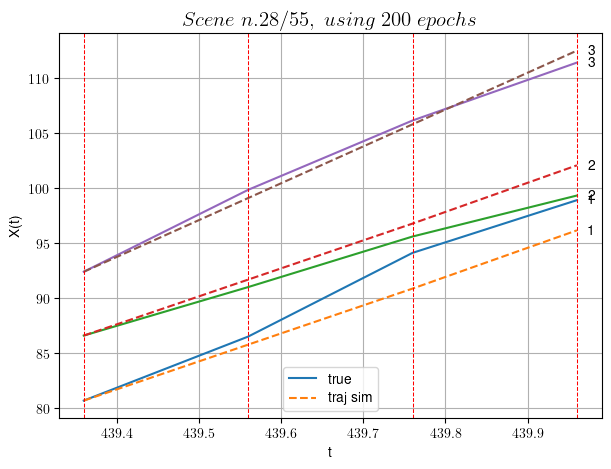

            Loss: 2.492687316067164
            v0 updated: 33.53249558198438
----------------------------------------------------------------------------------------------------

Scene n.29/55, time interval:[448.36,448.76]
----------------------------------------------------------------------------------------------------


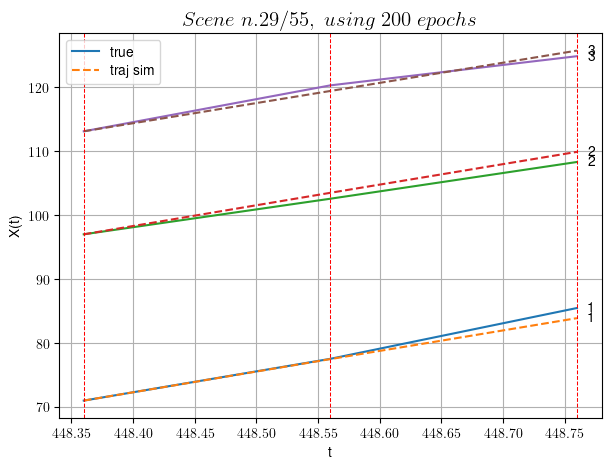

            Loss: 0.8245165678146941
            v0 updated: 31.583307782368443
----------------------------------------------------------------------------------------------------

Scene n.30/55, time interval:[465.16,466.56]
----------------------------------------------------------------------------------------------------


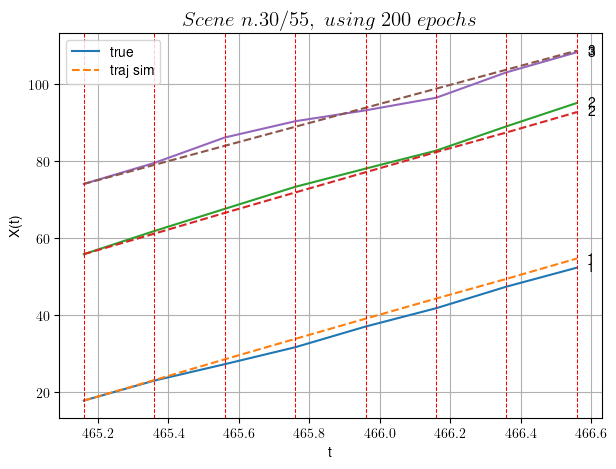

            Loss: 2.213056104503791
            v0 updated: 24.727874292569464
----------------------------------------------------------------------------------------------------

Scene n.31/55, time interval:[467.16,468.36]
----------------------------------------------------------------------------------------------------


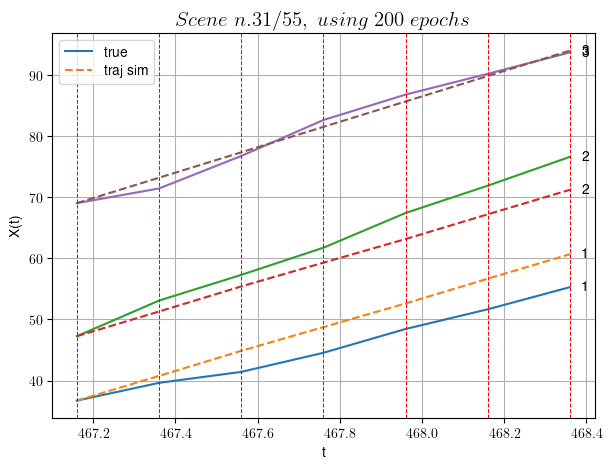

            Loss: 9.069239792360658
            v0 updated: 20.786390638769962
----------------------------------------------------------------------------------------------------

Scene n.32/55, time interval:[480.76,481.36]
----------------------------------------------------------------------------------------------------


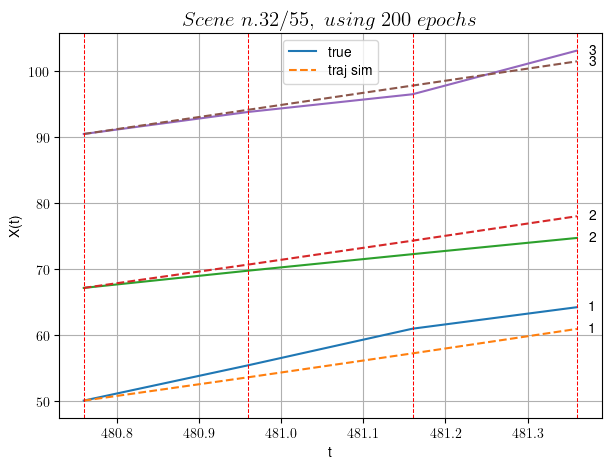

            Loss: 4.030519898725794
            v0 updated: 18.31768317689234
----------------------------------------------------------------------------------------------------

Scene n.33/55, time interval:[487.16,487.56]
----------------------------------------------------------------------------------------------------


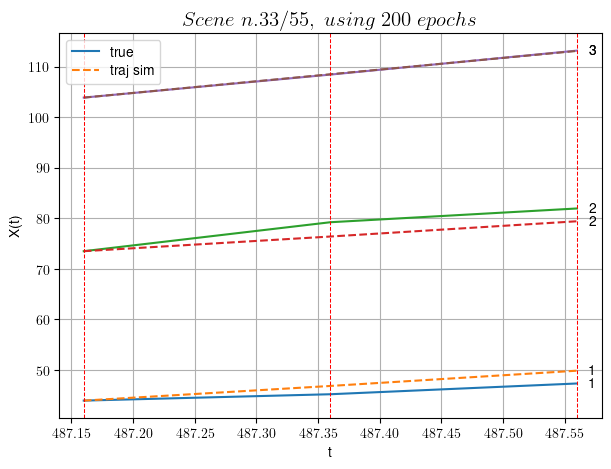

            Loss: 2.6083881345139517
            v0 updated: 23.079438842785727
----------------------------------------------------------------------------------------------------

Scene n.34/55, time interval:[498.56,498.96]
----------------------------------------------------------------------------------------------------


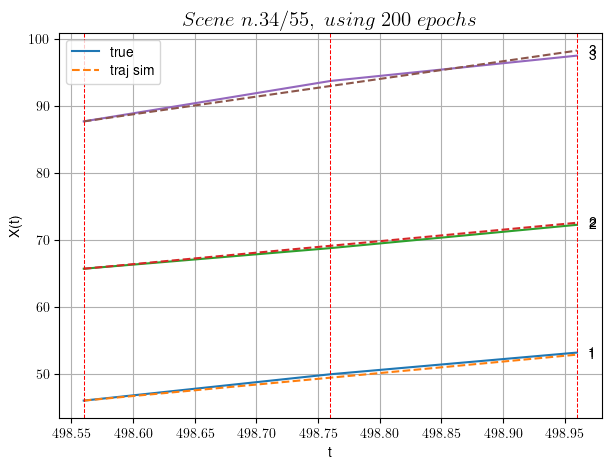

            Loss: 0.18831510634036222
            v0 updated: 26.40821113207029
----------------------------------------------------------------------------------------------------

Scene n.35/55, time interval:[517.96,518.36]
----------------------------------------------------------------------------------------------------


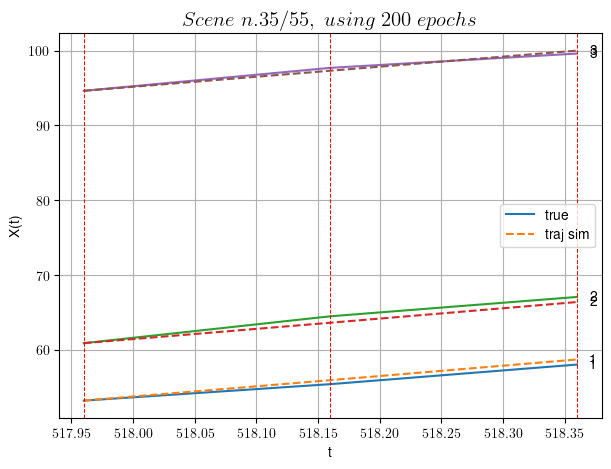

            Loss: 0.2510300759056301
            v0 updated: 13.453926468383587
----------------------------------------------------------------------------------------------------

Scene n.36/55, time interval:[527.36,528.16]
----------------------------------------------------------------------------------------------------


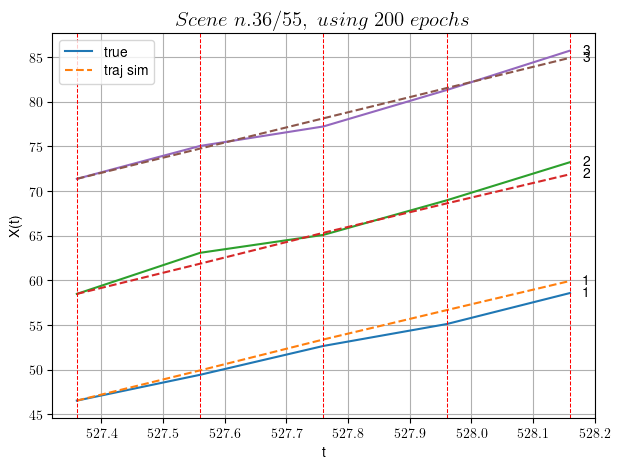

            Loss: 0.6743855766574655
            v0 updated: 16.935267042056086
----------------------------------------------------------------------------------------------------

Scene n.37/55, time interval:[530.36,530.96]
----------------------------------------------------------------------------------------------------


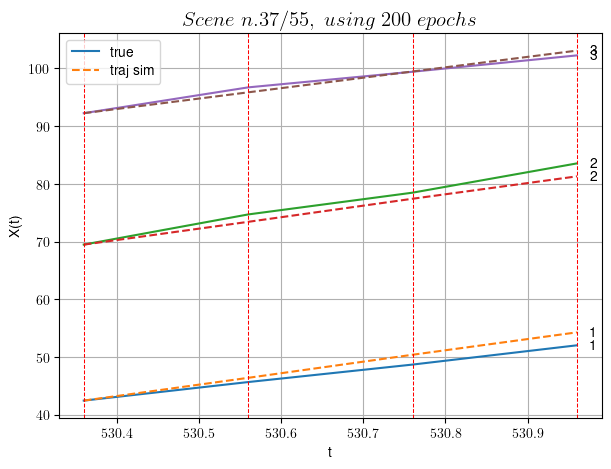

            Loss: 1.4736346805062757
            v0 updated: 18.067971080825455
----------------------------------------------------------------------------------------------------

Scene n.38/55, time interval:[576.56,577.76]
----------------------------------------------------------------------------------------------------


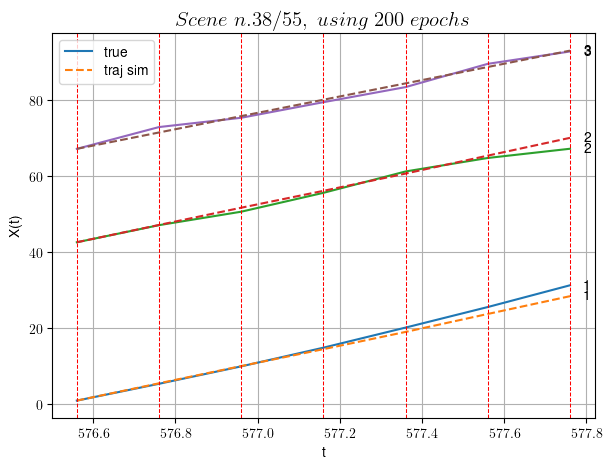

            Loss: 1.31705743883455
            v0 updated: 21.52600293608991
----------------------------------------------------------------------------------------------------

Scene n.39/55, time interval:[579.56,580.56]
----------------------------------------------------------------------------------------------------


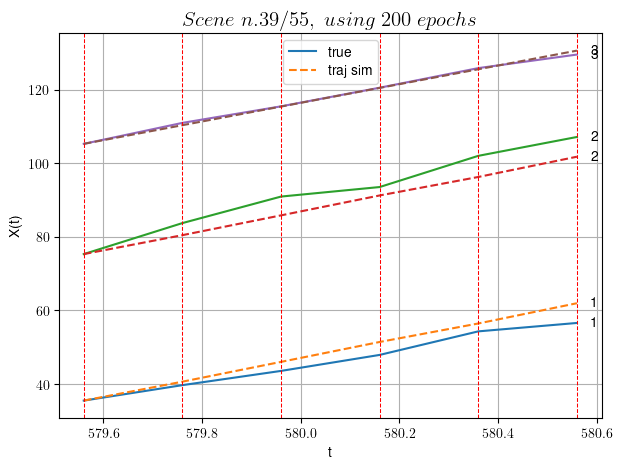

            Loss: 8.804431783625555
            v0 updated: 25.36350099714996
----------------------------------------------------------------------------------------------------

Scene n.40/55, time interval:[592.16,592.96]
----------------------------------------------------------------------------------------------------


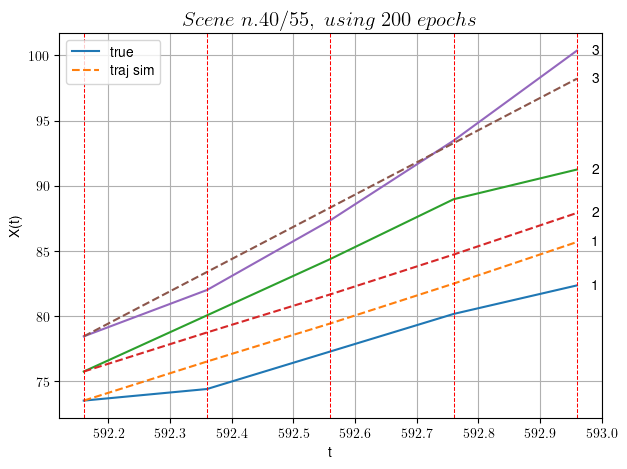

            Loss: 4.7550046660533445
            v0 updated: 24.715789260210165
----------------------------------------------------------------------------------------------------

Scene n.41/55, time interval:[21.56,21.96]
----------------------------------------------------------------------------------------------------


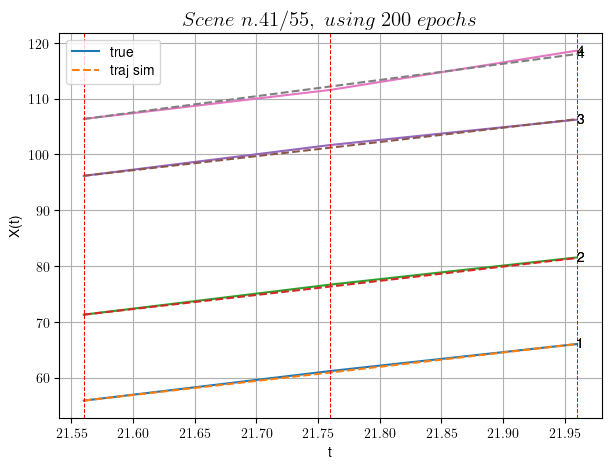

            Loss: 0.09877804499328294
            v0 updated: 29.08930460717769
----------------------------------------------------------------------------------------------------

Scene n.42/55, time interval:[31.36,31.96]
----------------------------------------------------------------------------------------------------


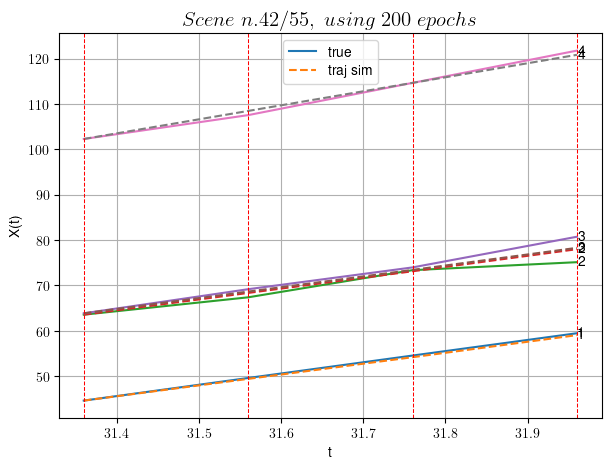

            Loss: 1.1128169255490785
            v0 updated: 30.911522722567675
----------------------------------------------------------------------------------------------------

Scene n.43/55, time interval:[33.76,34.36]
----------------------------------------------------------------------------------------------------


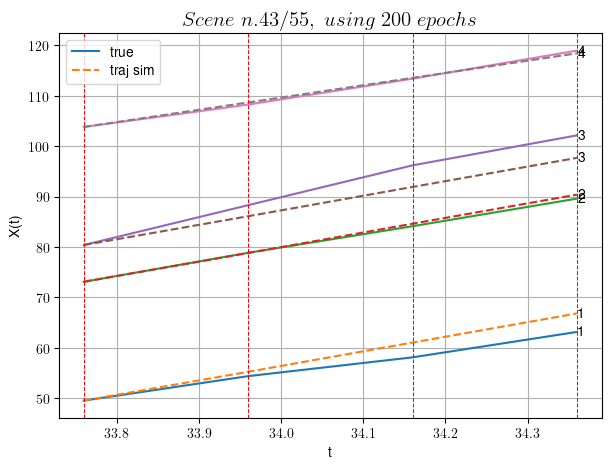

            Loss: 4.203071994227673
            v0 updated: 24.350672666072207
----------------------------------------------------------------------------------------------------

Scene n.44/55, time interval:[34.96,35.36]
----------------------------------------------------------------------------------------------------


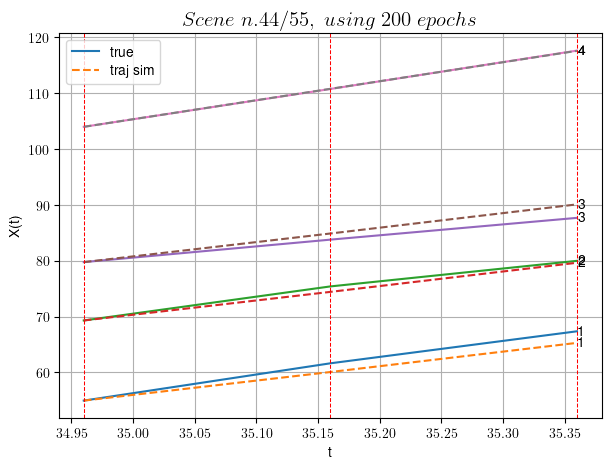

            Loss: 1.2378703185576205
            v0 updated: 34.01960344941417
----------------------------------------------------------------------------------------------------

Scene n.45/55, time interval:[83.36,84.56]
----------------------------------------------------------------------------------------------------


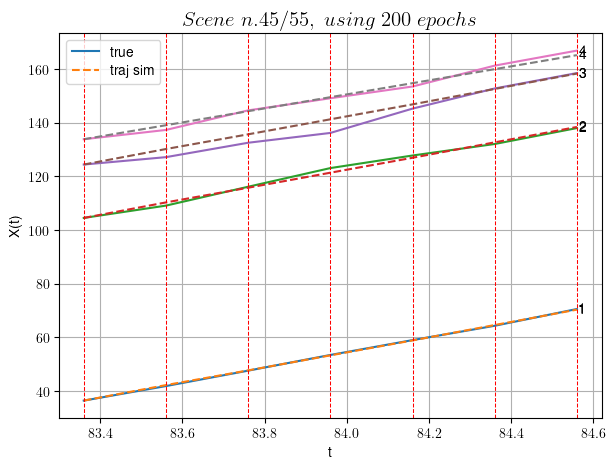

            Loss: 2.249874666033817
            v0 updated: 26.131707170269824
----------------------------------------------------------------------------------------------------

Scene n.46/55, time interval:[94.36,94.96]
----------------------------------------------------------------------------------------------------


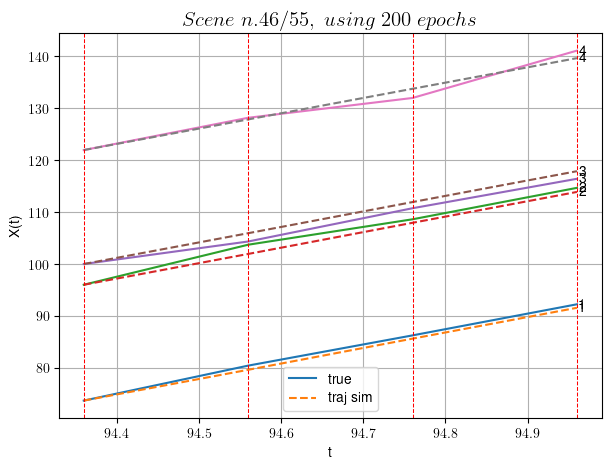

            Loss: 1.0726312609968136
            v0 updated: 29.52907574185669
----------------------------------------------------------------------------------------------------

Scene n.47/55, time interval:[142.16,142.76]
----------------------------------------------------------------------------------------------------


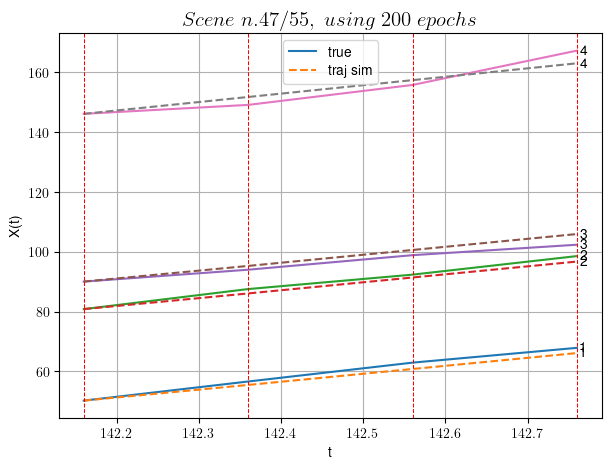

            Loss: 3.753000128471376
            v0 updated: 28.13281408756362
----------------------------------------------------------------------------------------------------

Scene n.48/55, time interval:[170.36,170.76]
----------------------------------------------------------------------------------------------------


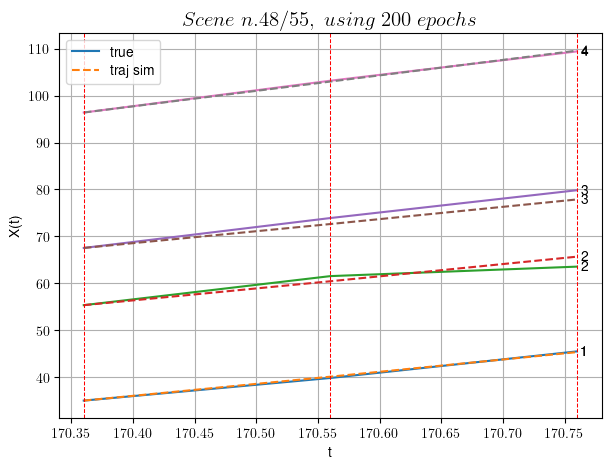

            Loss: 0.946580330466954
            v0 updated: 32.978076203930534
----------------------------------------------------------------------------------------------------

Scene n.49/55, time interval:[248.16,248.56]
----------------------------------------------------------------------------------------------------


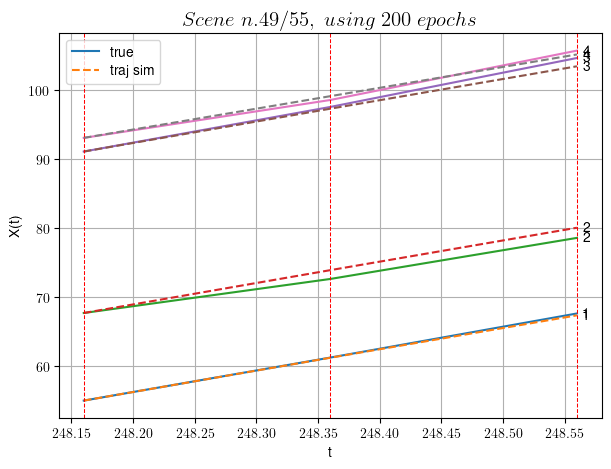

            Loss: 0.5004548396221593
            v0 updated: 30.24743653164149
----------------------------------------------------------------------------------------------------

Scene n.50/55, time interval:[320.56,321.16]
----------------------------------------------------------------------------------------------------


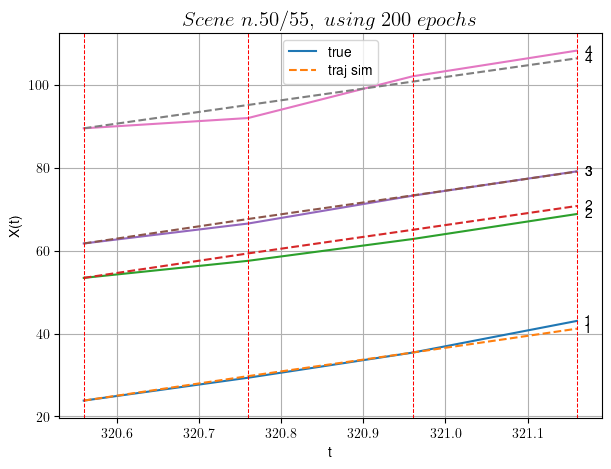

            Loss: 1.9843200432195982
            v0 updated: 28.141662429457412
----------------------------------------------------------------------------------------------------

Scene n.51/55, time interval:[333.96,334.56]
----------------------------------------------------------------------------------------------------


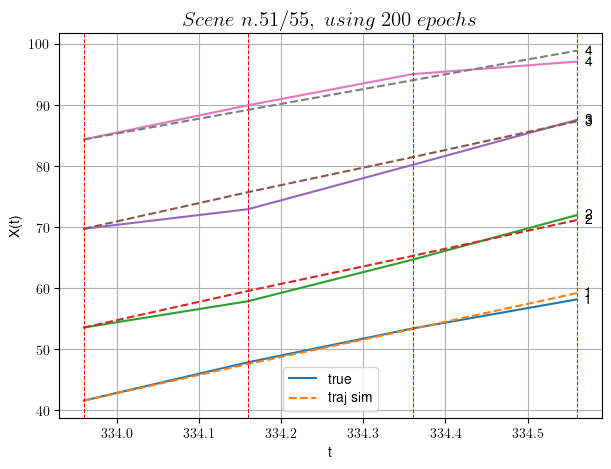

            Loss: 1.2044664304797075
            v0 updated: 24.25439744624117
----------------------------------------------------------------------------------------------------

Scene n.52/55, time interval:[393.36,393.76]
----------------------------------------------------------------------------------------------------


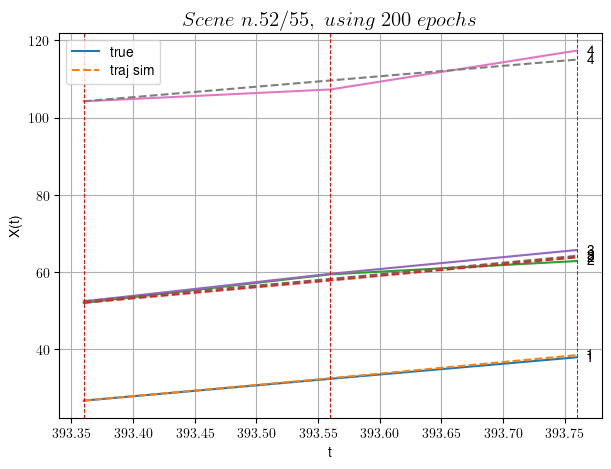

            Loss: 1.5557800250308826
            v0 updated: 27.024739809167087
----------------------------------------------------------------------------------------------------

Scene n.53/55, time interval:[521.76,522.76]
----------------------------------------------------------------------------------------------------


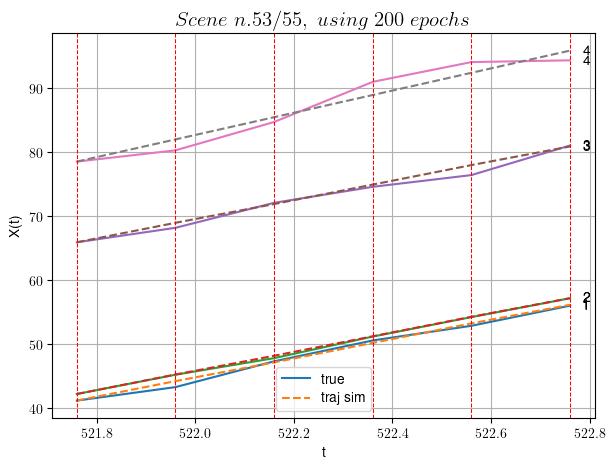

            Loss: 0.7236773981377906
            v0 updated: 17.326362767839466
----------------------------------------------------------------------------------------------------

Scene n.54/55, time interval:[95.36,95.76]
----------------------------------------------------------------------------------------------------


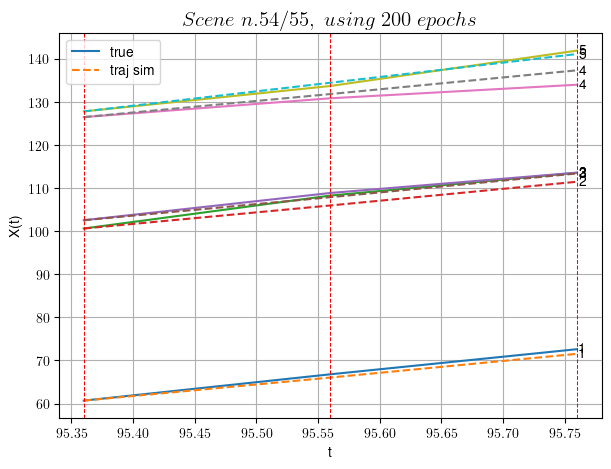

            Loss: 1.7090973752768135
            v0 updated: 33.29374725104849
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 28.55352763606256
Time taken: 537.47s
In df n.4/10 we have 30 scenes
------------------------------------------------------------

Scene n.0/30, time interval:[7.04,7.44]
----------------------------------------------------------------------------------------------------


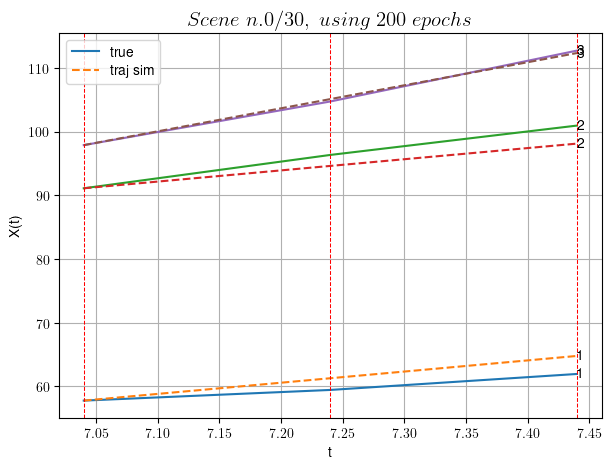

            Loss: 2.51731066638844
            v0 updated: 36.147472929252125
----------------------------------------------------------------------------------------------------

Scene n.1/30, time interval:[19.84,20.24]
----------------------------------------------------------------------------------------------------


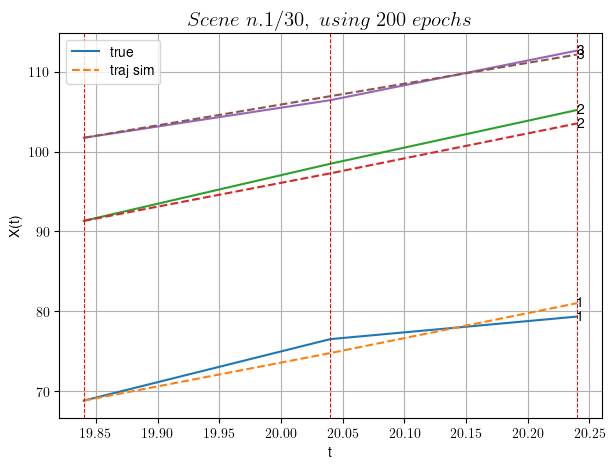

            Loss: 1.1812223205455992
            v0 updated: 26.06329397762493
----------------------------------------------------------------------------------------------------

Scene n.2/30, time interval:[23.64,24.64]
----------------------------------------------------------------------------------------------------


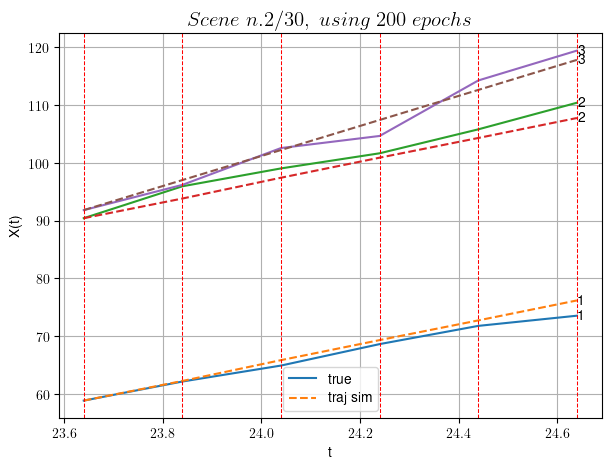

            Loss: 2.2089208809596097
            v0 updated: 25.97899552903699
----------------------------------------------------------------------------------------------------

Scene n.3/30, time interval:[80.24,81.44]
----------------------------------------------------------------------------------------------------


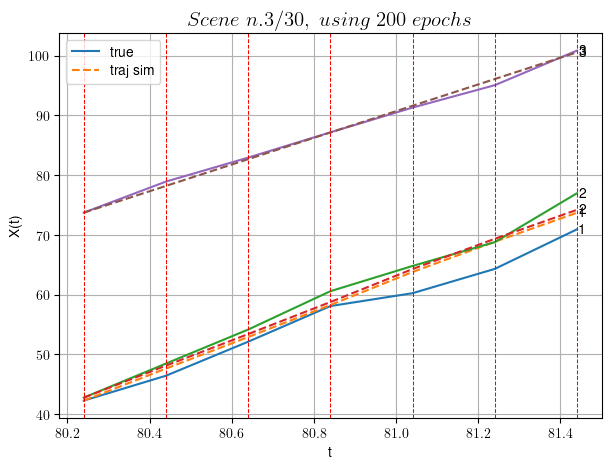

            Loss: 2.7241433448540024
            v0 updated: 22.37615455931493
----------------------------------------------------------------------------------------------------

Scene n.4/30, time interval:[89.04,89.84]
----------------------------------------------------------------------------------------------------


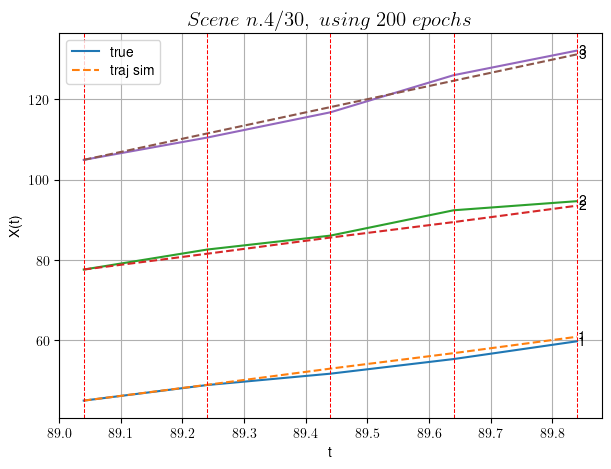

            Loss: 1.4451992409952048
            v0 updated: 32.77238417172515
----------------------------------------------------------------------------------------------------

Scene n.5/30, time interval:[96.44,97.64]
----------------------------------------------------------------------------------------------------


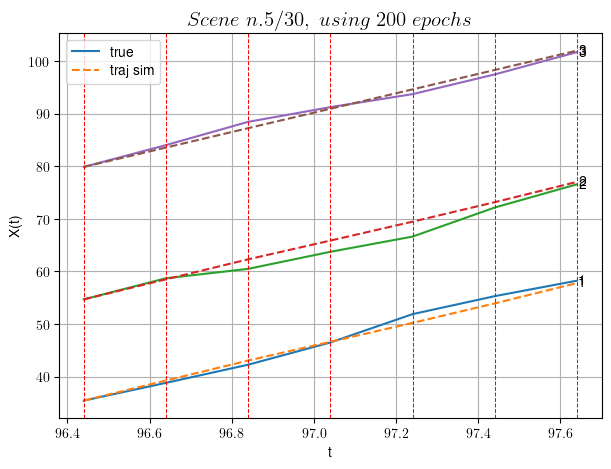

            Loss: 1.2476979579362057
            v0 updated: 18.41401615430983
----------------------------------------------------------------------------------------------------

Scene n.6/30, time interval:[182.24,183.64]
----------------------------------------------------------------------------------------------------


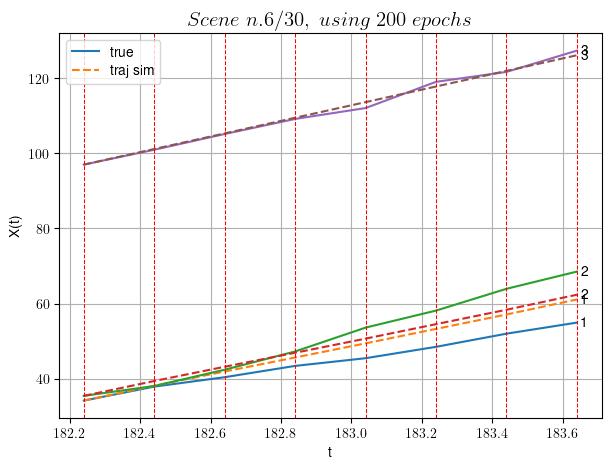

            Loss: 8.686834293644607
            v0 updated: 20.78333071696649
----------------------------------------------------------------------------------------------------

Scene n.7/30, time interval:[193.04,193.44]
----------------------------------------------------------------------------------------------------


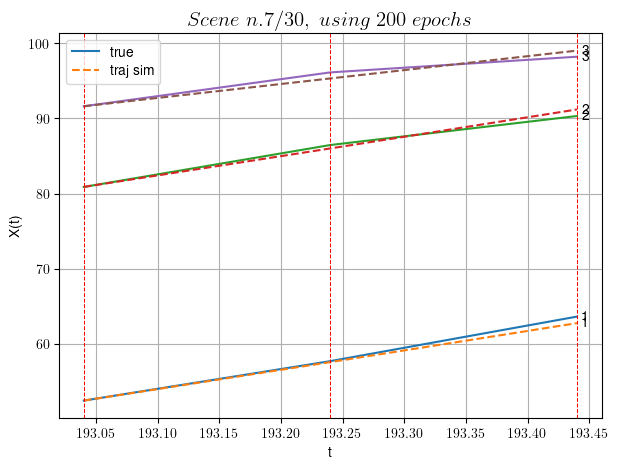

            Loss: 0.3385878927494493
            v0 updated: 18.519148732885238
----------------------------------------------------------------------------------------------------

Scene n.8/30, time interval:[196.84,197.24]
----------------------------------------------------------------------------------------------------


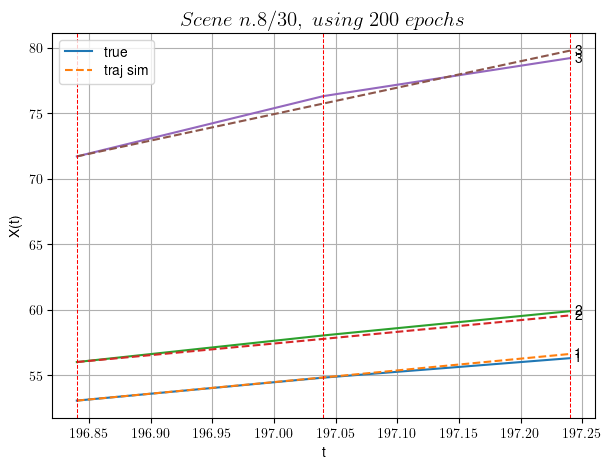

            Loss: 0.10307610701439758
            v0 updated: 20.19954608763423
----------------------------------------------------------------------------------------------------

Scene n.9/30, time interval:[222.84,223.44]
----------------------------------------------------------------------------------------------------


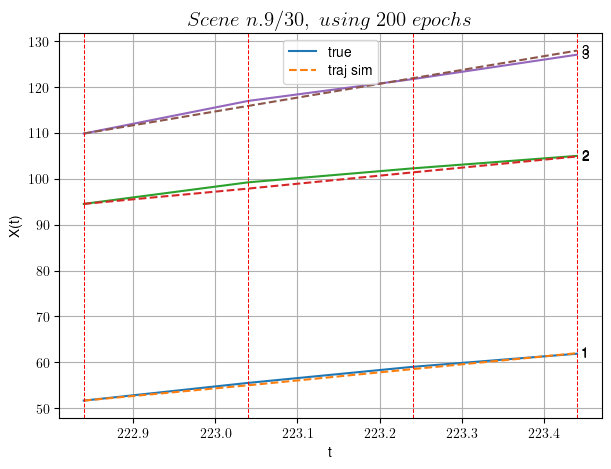

            Loss: 0.4323442679177338
            v0 updated: 30.107810155620577
----------------------------------------------------------------------------------------------------

Scene n.10/30, time interval:[224.84,227.24]
----------------------------------------------------------------------------------------------------


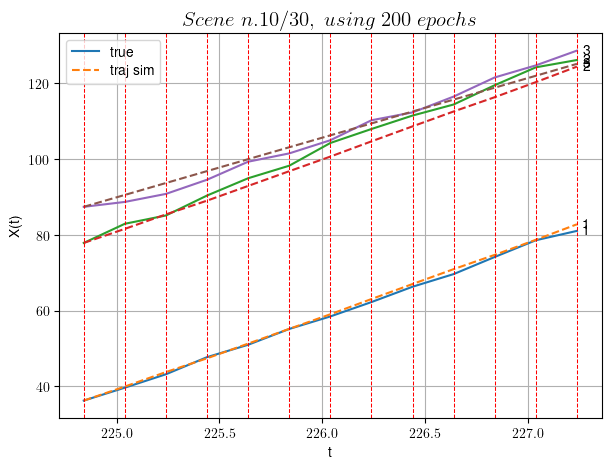

            Loss: 3.347386653960799
            v0 updated: 15.729363702731368
----------------------------------------------------------------------------------------------------

Scene n.11/30, time interval:[230.84,232.24]
----------------------------------------------------------------------------------------------------


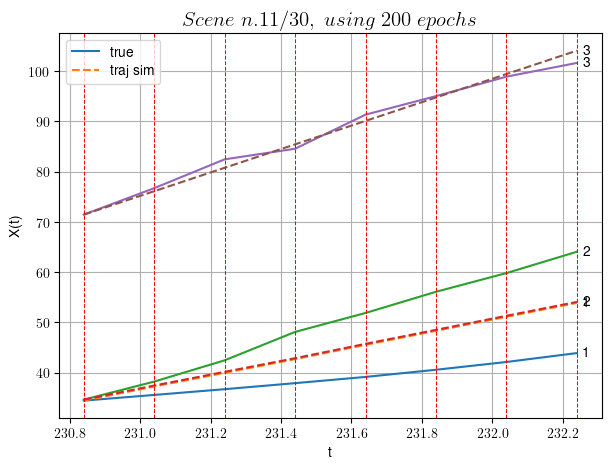

            Loss: 26.298319432761442
            v0 updated: 23.330054741611075
----------------------------------------------------------------------------------------------------

Scene n.12/30, time interval:[233.84,235.24]
----------------------------------------------------------------------------------------------------


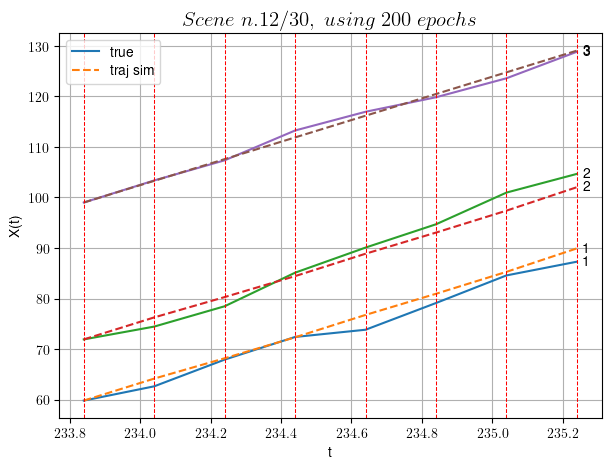

            Loss: 2.381703925285695
            v0 updated: 21.472180424121877
----------------------------------------------------------------------------------------------------

Scene n.13/30, time interval:[302.44,302.84]
----------------------------------------------------------------------------------------------------


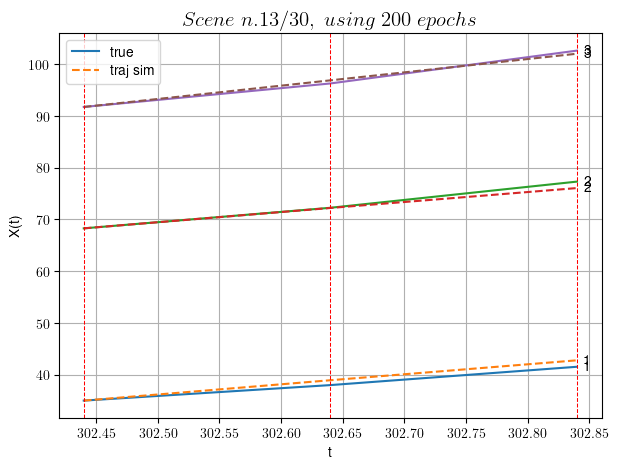

            Loss: 0.5251942368077404
            v0 updated: 25.749210786691933
----------------------------------------------------------------------------------------------------

Scene n.14/30, time interval:[364.64,365.44]
----------------------------------------------------------------------------------------------------


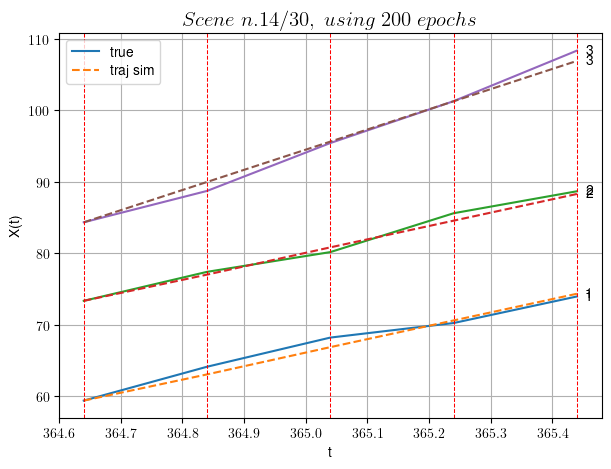

            Loss: 0.5800360383648852
            v0 updated: 28.20769503184908
----------------------------------------------------------------------------------------------------

Scene n.15/30, time interval:[422.64,423.64]
----------------------------------------------------------------------------------------------------


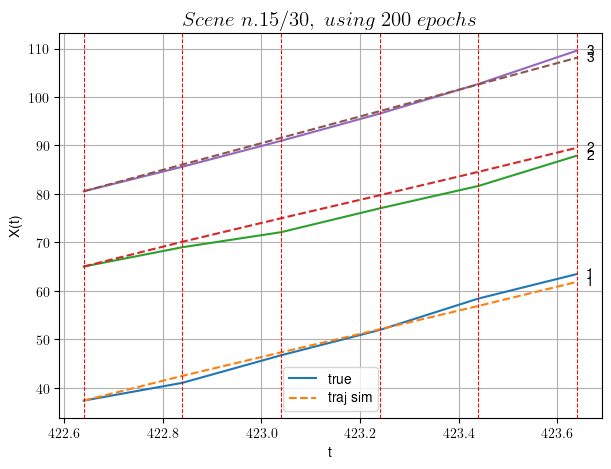

            Loss: 2.1312441956594683
            v0 updated: 27.54778513206394
----------------------------------------------------------------------------------------------------

Scene n.16/30, time interval:[440.44,440.84]
----------------------------------------------------------------------------------------------------


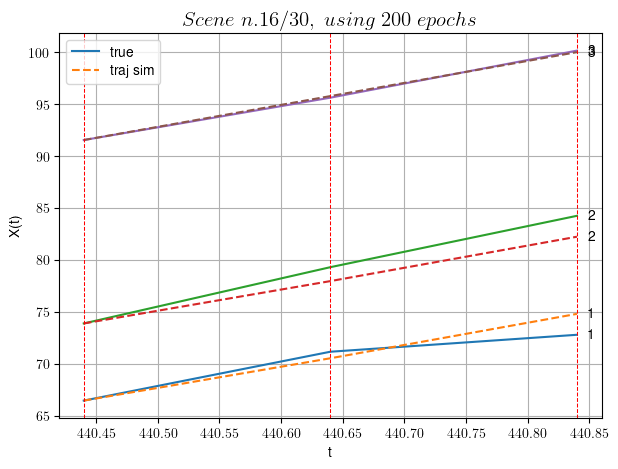

            Loss: 1.146009294757162
            v0 updated: 21.13673717572745
----------------------------------------------------------------------------------------------------

Scene n.17/30, time interval:[459.64,460.64]
----------------------------------------------------------------------------------------------------


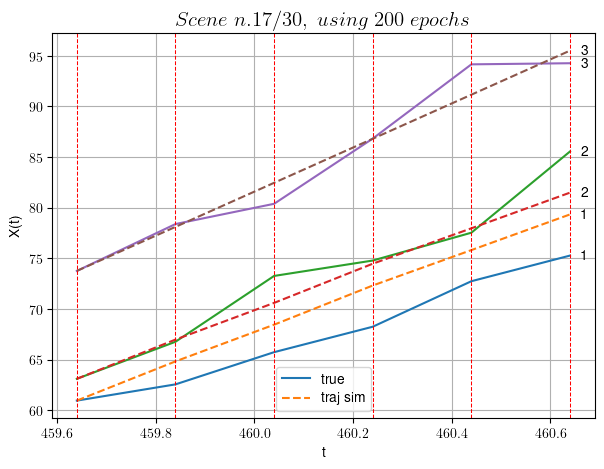

            Loss: 5.216621353856582
            v0 updated: 21.758536788642303
----------------------------------------------------------------------------------------------------

Scene n.18/30, time interval:[493.84,495.84]
----------------------------------------------------------------------------------------------------


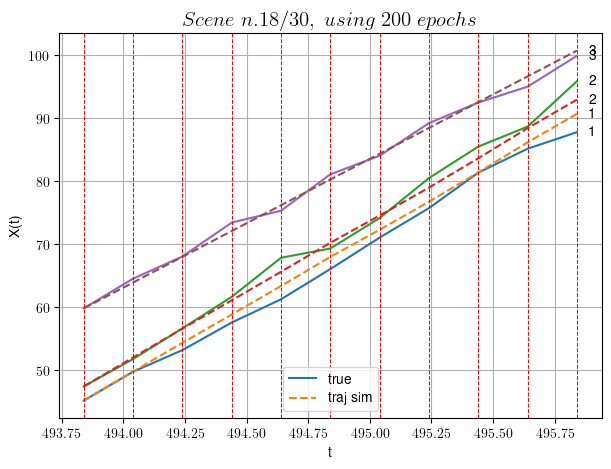

            Loss: 1.5616017930101886
            v0 updated: 20.44744200453107
----------------------------------------------------------------------------------------------------

Scene n.19/30, time interval:[520.04,521.64]
----------------------------------------------------------------------------------------------------


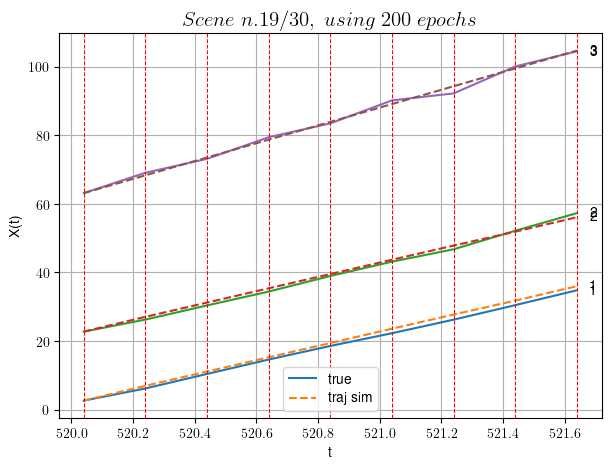

            Loss: 0.819243485095873
            v0 updated: 25.967240218471442
----------------------------------------------------------------------------------------------------

Scene n.20/30, time interval:[550.44,551.24]
----------------------------------------------------------------------------------------------------


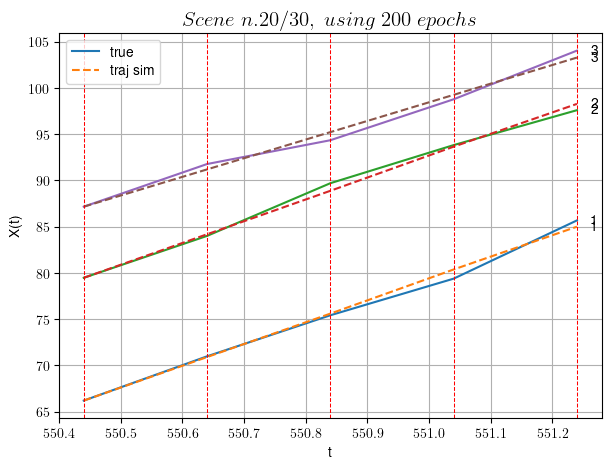

            Loss: 0.3059578033379852
            v0 updated: 20.15921482706291
----------------------------------------------------------------------------------------------------

Scene n.21/30, time interval:[554.64,555.04]
----------------------------------------------------------------------------------------------------


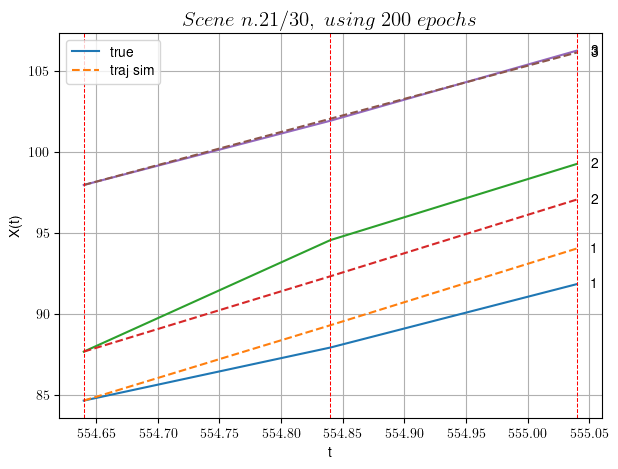

            Loss: 1.8427679422850811
            v0 updated: 20.45122402685835
----------------------------------------------------------------------------------------------------

Scene n.22/30, time interval:[556.24,556.64]
----------------------------------------------------------------------------------------------------


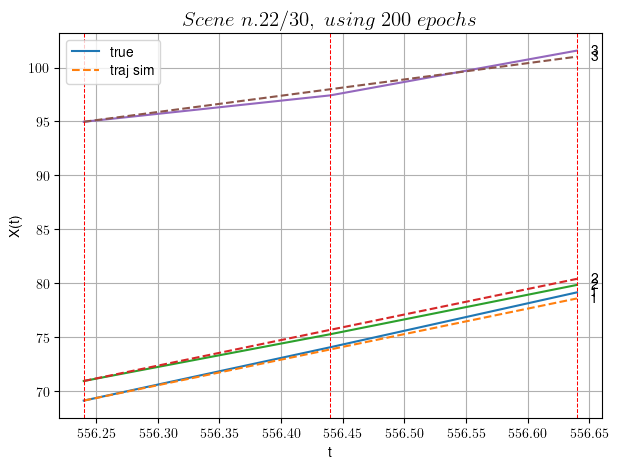

            Loss: 0.16466453193991418
            v0 updated: 15.10246810565707
----------------------------------------------------------------------------------------------------

Scene n.23/30, time interval:[575.04,575.84]
----------------------------------------------------------------------------------------------------


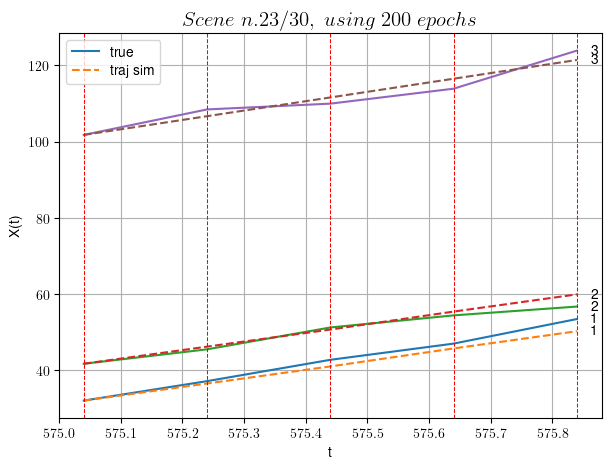

            Loss: 3.053602406779133
            v0 updated: 24.55161048759143
----------------------------------------------------------------------------------------------------

Scene n.24/30, time interval:[313.84,314.44]
----------------------------------------------------------------------------------------------------


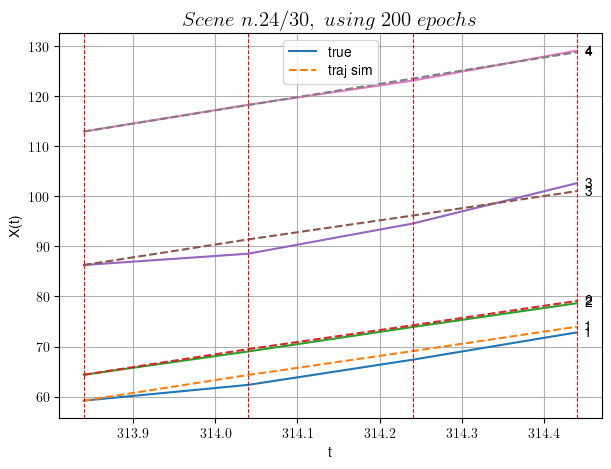

            Loss: 1.3878732062538388
            v0 updated: 26.437615898639695
----------------------------------------------------------------------------------------------------

Scene n.25/30, time interval:[460.84,461.24]
----------------------------------------------------------------------------------------------------


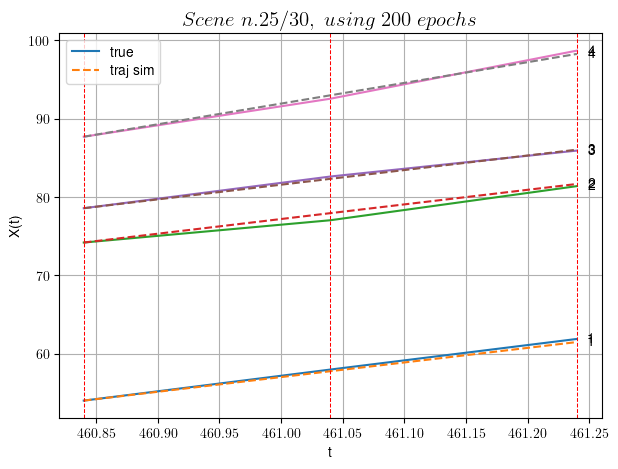

            Loss: 0.13042152016940237
            v0 updated: 26.426470006325165
----------------------------------------------------------------------------------------------------

Scene n.26/30, time interval:[462.64,463.04]
----------------------------------------------------------------------------------------------------


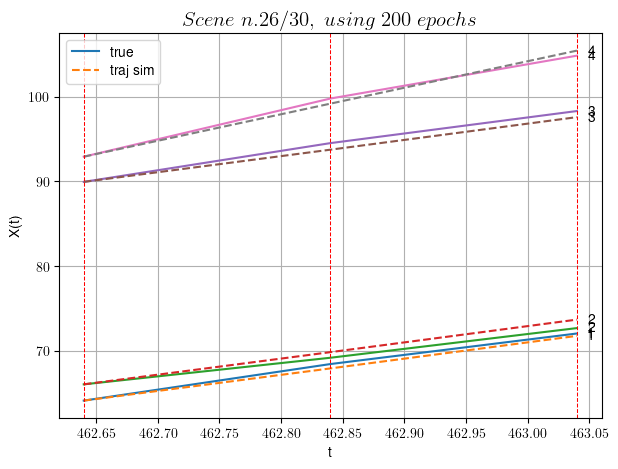

            Loss: 0.3027132240814371
            v0 updated: 31.34411385355845
----------------------------------------------------------------------------------------------------

Scene n.27/30, time interval:[495.24,495.84]
----------------------------------------------------------------------------------------------------


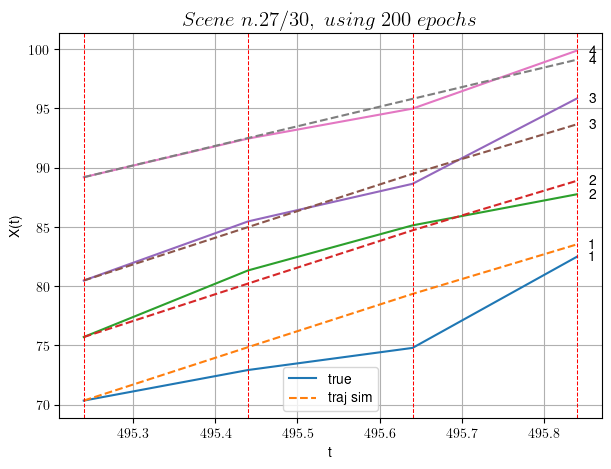

            Loss: 2.200974446666891
            v0 updated: 16.521371437174743
----------------------------------------------------------------------------------------------------

Scene n.28/30, time interval:[541.84,542.84]
----------------------------------------------------------------------------------------------------


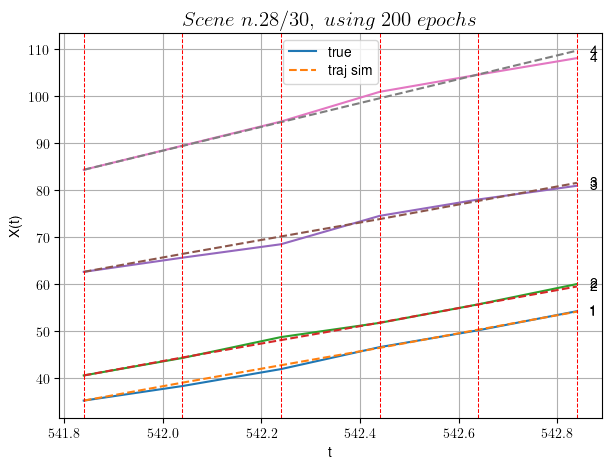

            Loss: 0.44570741071986864
            v0 updated: 25.34048009127371
----------------------------------------------------------------------------------------------------

Scene n.29/30, time interval:[559.04,559.44]
----------------------------------------------------------------------------------------------------


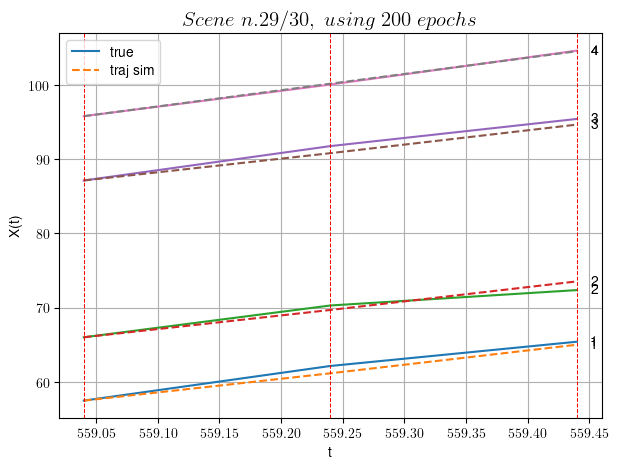

            Loss: 0.36481085034621313
            v0 updated: 21.871231487187927
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 24.67864805402919
Time taken: 321.62s
In df n.5/10 we have 14 scenes
------------------------------------------------------------

Scene n.0/14, time interval:[23.72,24.52]
----------------------------------------------------------------------------------------------------


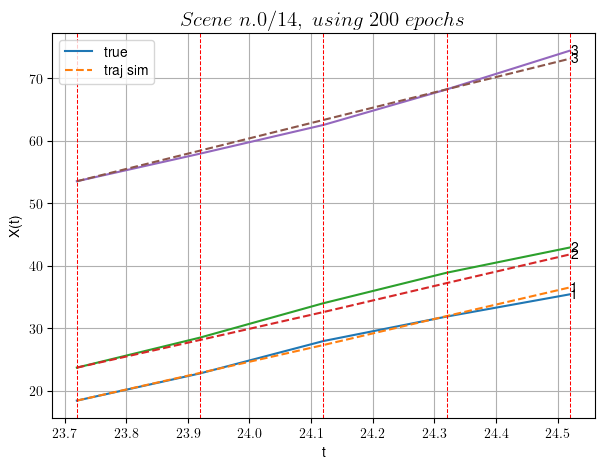

            Loss: 0.6879698711538809
            v0 updated: 24.540804592766374
----------------------------------------------------------------------------------------------------

Scene n.1/14, time interval:[28.12,28.72]
----------------------------------------------------------------------------------------------------


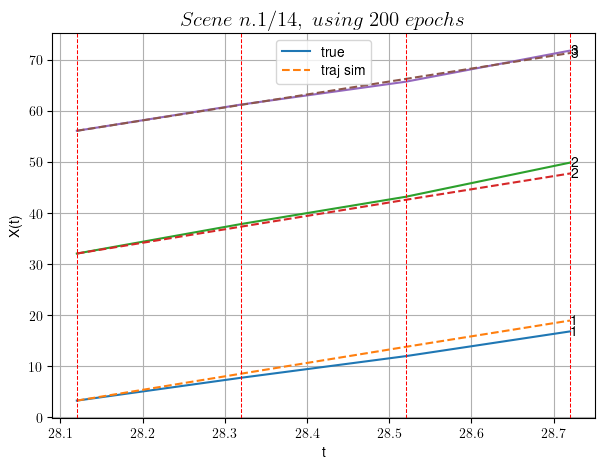

            Loss: 1.180089782740242
            v0 updated: 25.38445729058461
----------------------------------------------------------------------------------------------------

Scene n.2/14, time interval:[146.52,147.12]
----------------------------------------------------------------------------------------------------


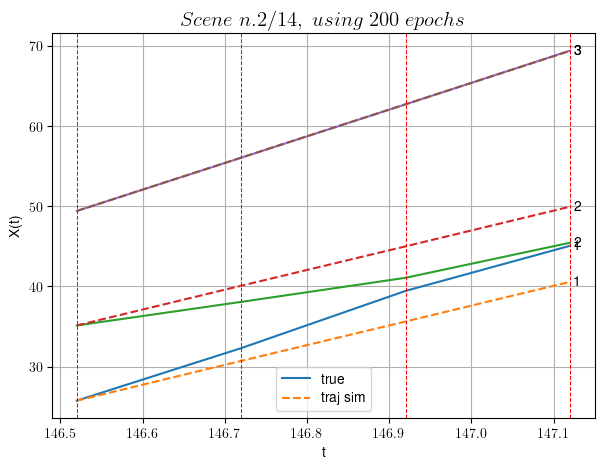

            Loss: 6.399567259373039
            v0 updated: 33.24361982546581
----------------------------------------------------------------------------------------------------

Scene n.3/14, time interval:[151.12,151.52]
----------------------------------------------------------------------------------------------------


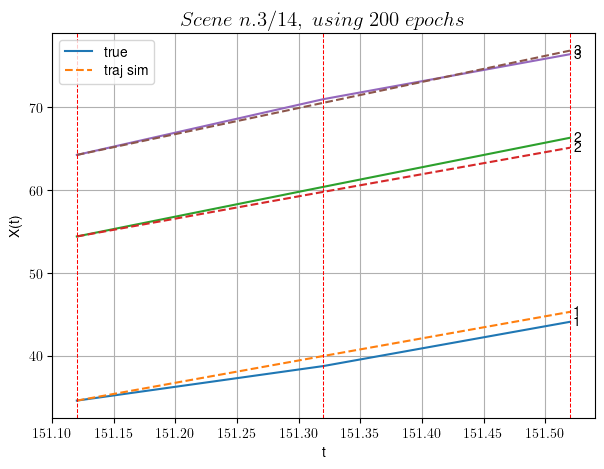

            Loss: 0.5682709199537672
            v0 updated: 31.514473997442256
----------------------------------------------------------------------------------------------------

Scene n.4/14, time interval:[177.32,178.52]
----------------------------------------------------------------------------------------------------


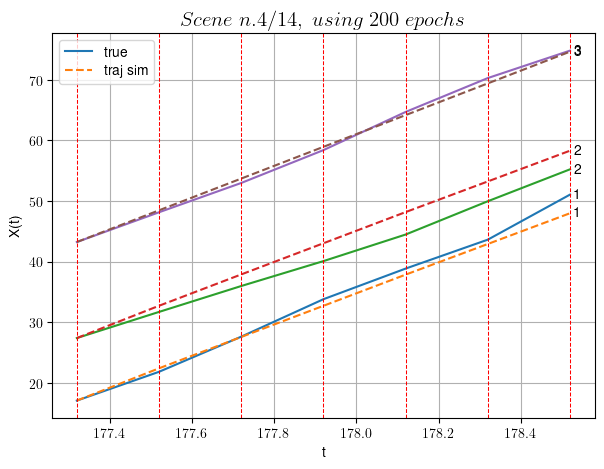

            Loss: 2.9389605605339555
            v0 updated: 26.18457238016555
----------------------------------------------------------------------------------------------------

Scene n.5/14, time interval:[266.92,267.32]
----------------------------------------------------------------------------------------------------


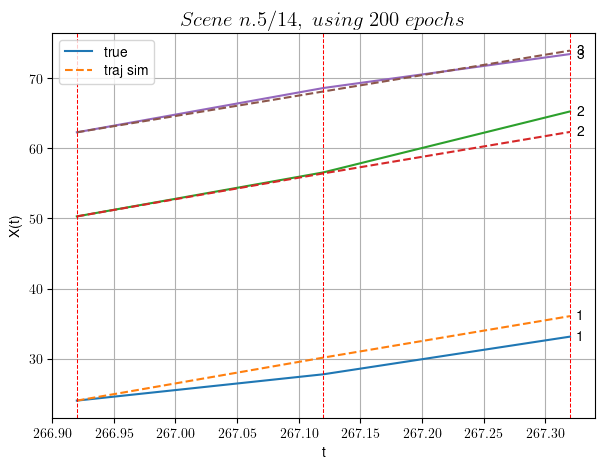

            Loss: 2.577861980685881
            v0 updated: 29.08670553770542
----------------------------------------------------------------------------------------------------

Scene n.6/14, time interval:[316.92,317.32]
----------------------------------------------------------------------------------------------------


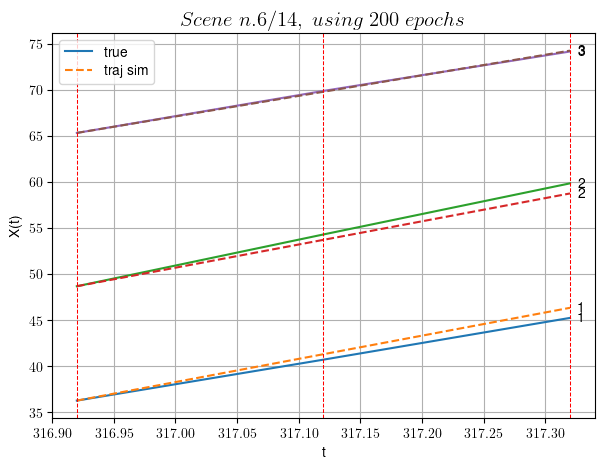

            Loss: 0.34613677476566224
            v0 updated: 22.350454396791342
----------------------------------------------------------------------------------------------------

Scene n.7/14, time interval:[319.52,319.92]
----------------------------------------------------------------------------------------------------


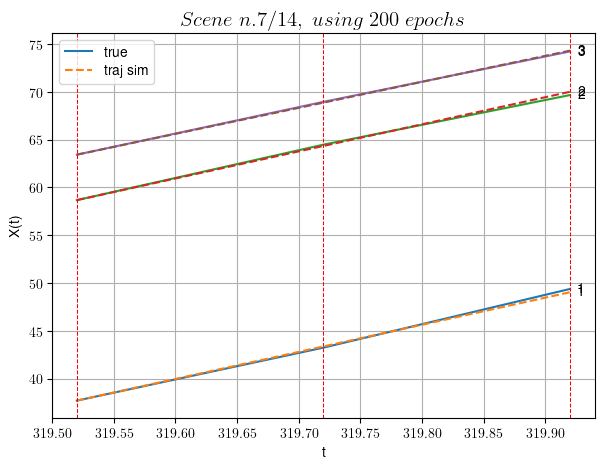

            Loss: 0.03174788545450367
            v0 updated: 27.22550971636396
----------------------------------------------------------------------------------------------------

Scene n.8/14, time interval:[330.12,330.52]
----------------------------------------------------------------------------------------------------


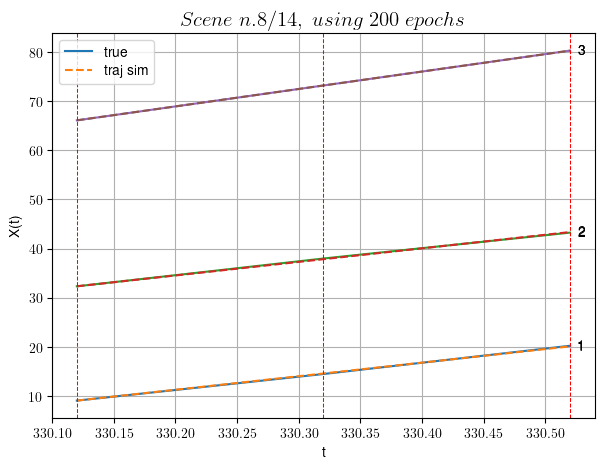

            Loss: 0.006576960175479862
            v0 updated: 35.47266760034579
----------------------------------------------------------------------------------------------------

Scene n.9/14, time interval:[338.52,339.52]
----------------------------------------------------------------------------------------------------


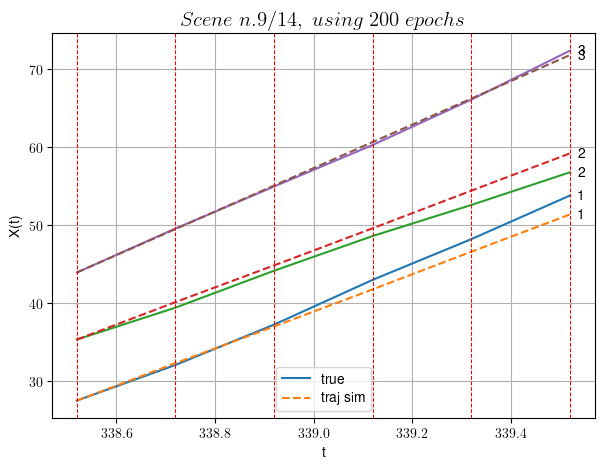

            Loss: 1.206951571967755
            v0 updated: 27.856284841251647
----------------------------------------------------------------------------------------------------

Scene n.10/14, time interval:[435.72,436.72]
----------------------------------------------------------------------------------------------------


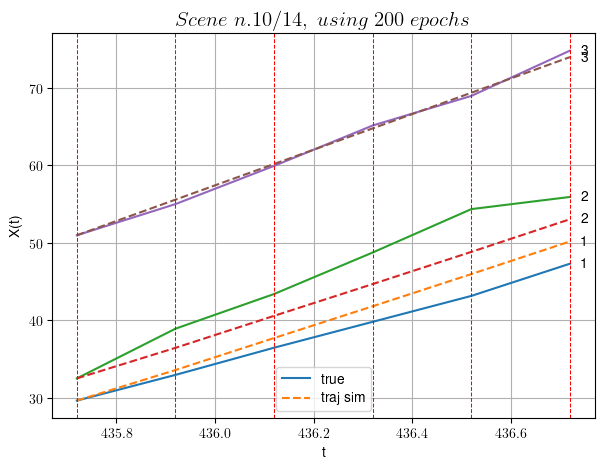

            Loss: 5.169256646940307
            v0 updated: 23.00995307931417
----------------------------------------------------------------------------------------------------

Scene n.11/14, time interval:[565.12,565.52]
----------------------------------------------------------------------------------------------------


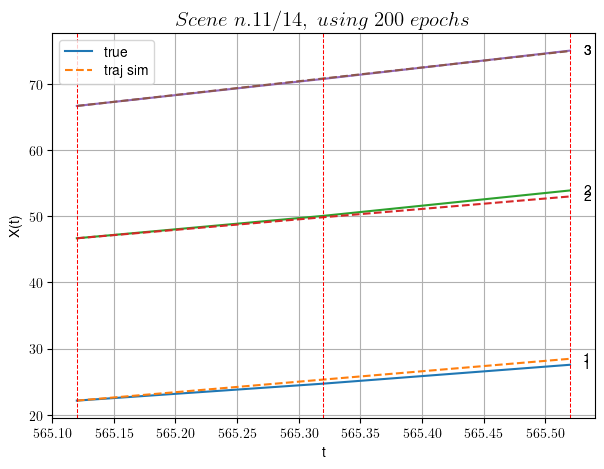

            Loss: 0.23052335029690155
            v0 updated: 20.76046991302415
----------------------------------------------------------------------------------------------------

Scene n.12/14, time interval:[578.92,579.52]
----------------------------------------------------------------------------------------------------


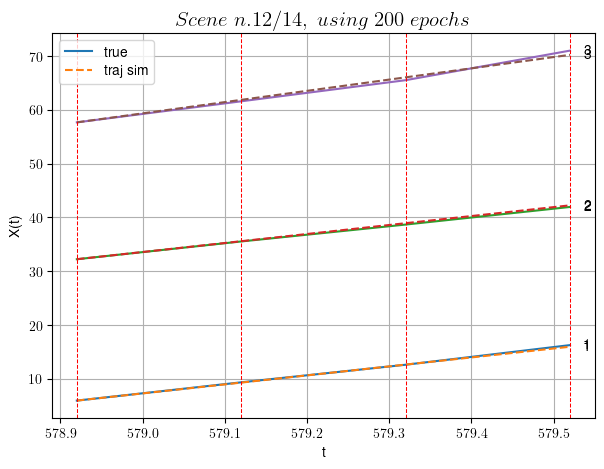

            Loss: 0.10131812526362068
            v0 updated: 20.92658502941081
----------------------------------------------------------------------------------------------------

Scene n.13/14, time interval:[178.12,178.52]
----------------------------------------------------------------------------------------------------


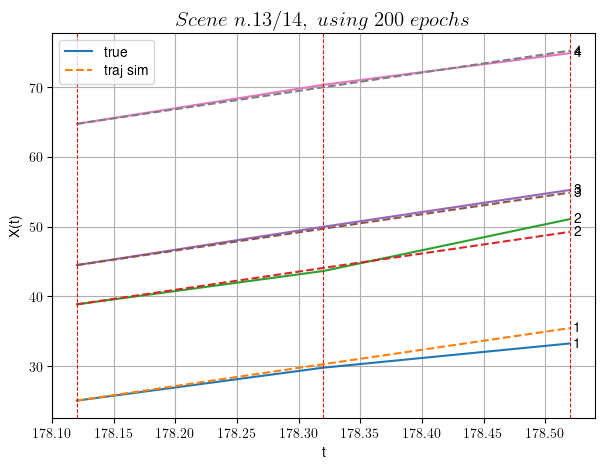

            Loss: 0.75631511870789
            v0 updated: 26.21582356930081
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 27.19929737761663
Time taken: 119.05s
In df n.6/10 we have 3 scenes
------------------------------------------------------------

Scene n.0/3, time interval:[552.20,552.80]
----------------------------------------------------------------------------------------------------


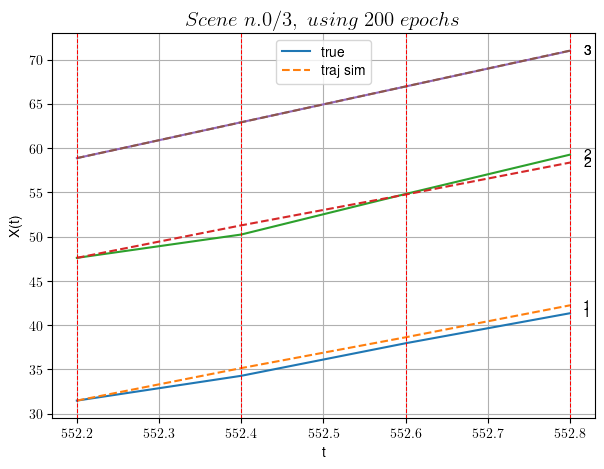

            Loss: 0.32439807488629924
            v0 updated: 20.243929110422304
----------------------------------------------------------------------------------------------------

Scene n.1/3, time interval:[553.00,553.40]
----------------------------------------------------------------------------------------------------


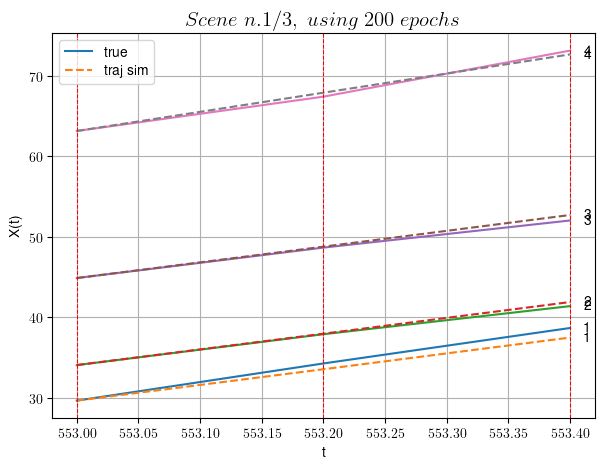

            Loss: 0.2608910317315331
            v0 updated: 23.787330449337816
----------------------------------------------------------------------------------------------------

Scene n.2/3, time interval:[554.00,554.40]
----------------------------------------------------------------------------------------------------


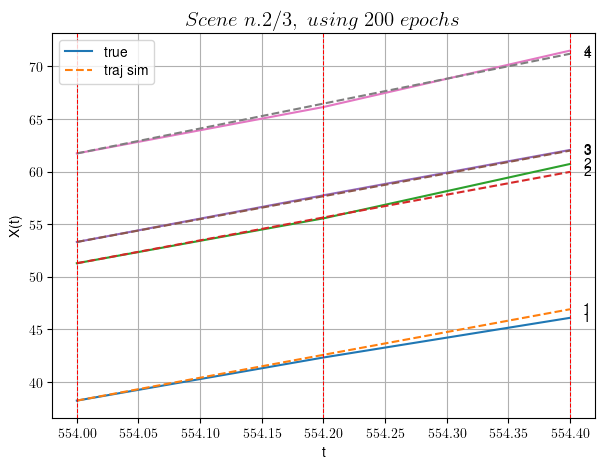

            Loss: 0.12597022693572885
            v0 updated: 23.686195485918425
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 23.859329124959213
Time taken: 24.35s
In df n.7/10 we have 8 scenes
------------------------------------------------------------

Scene n.0/8, time interval:[38.56,38.96]
----------------------------------------------------------------------------------------------------


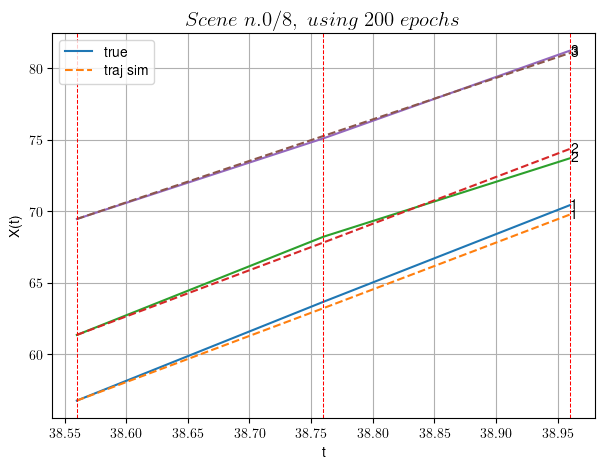

            Loss: 0.14196907898337394
            v0 updated: 28.991119571901432
----------------------------------------------------------------------------------------------------

Scene n.1/8, time interval:[39.76,40.36]
----------------------------------------------------------------------------------------------------


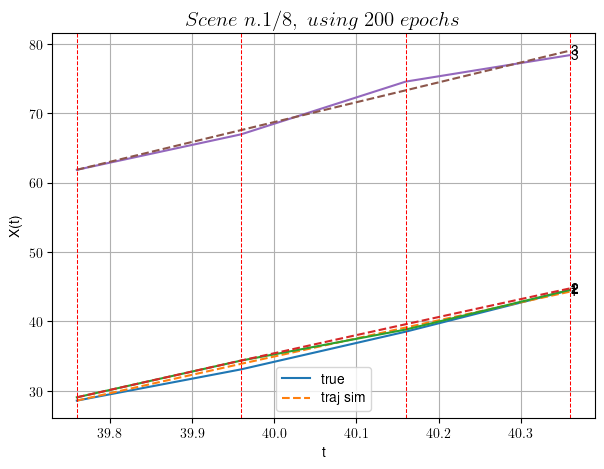

            Loss: 0.3382774836947055
            v0 updated: 28.631257271127794
----------------------------------------------------------------------------------------------------

Scene n.2/8, time interval:[45.96,46.36]
----------------------------------------------------------------------------------------------------


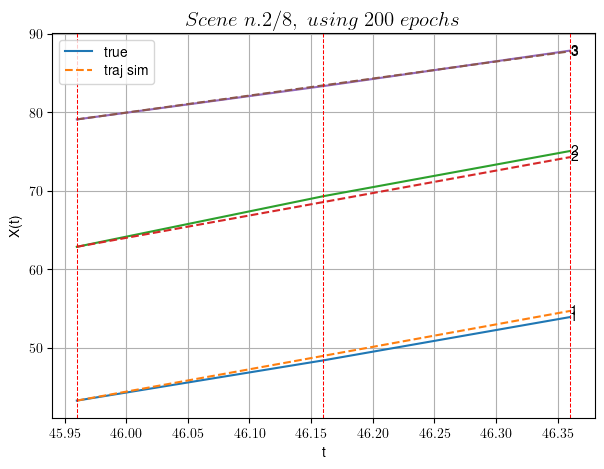

            Loss: 0.2360679258220193
            v0 updated: 21.688502462638503
----------------------------------------------------------------------------------------------------

Scene n.3/8, time interval:[162.76,163.16]
----------------------------------------------------------------------------------------------------


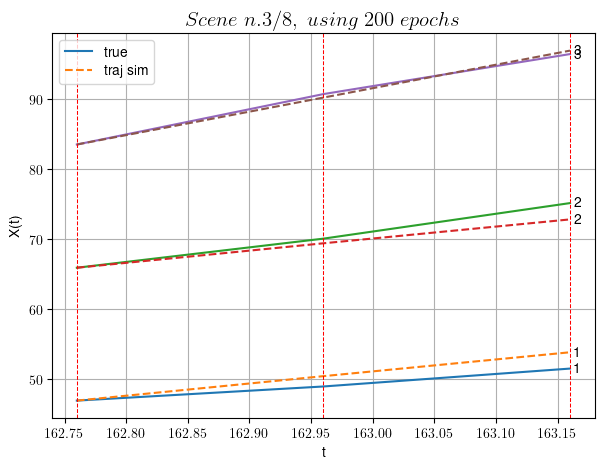

            Loss: 1.5490462092889077
            v0 updated: 33.51069558869736
----------------------------------------------------------------------------------------------------

Scene n.4/8, time interval:[165.76,166.36]
----------------------------------------------------------------------------------------------------


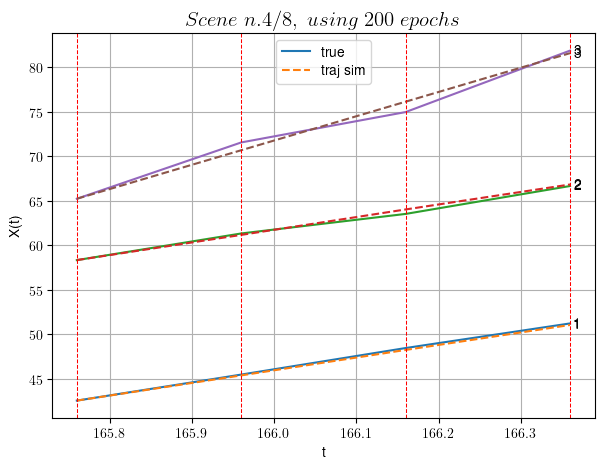

            Loss: 0.21631944698967723
            v0 updated: 27.26521595497116
----------------------------------------------------------------------------------------------------

Scene n.5/8, time interval:[188.16,188.76]
----------------------------------------------------------------------------------------------------


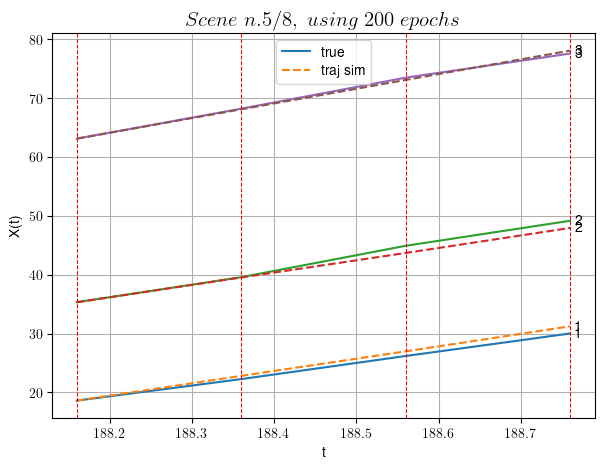

            Loss: 0.48193911725375993
            v0 updated: 24.90420963899612
----------------------------------------------------------------------------------------------------

Scene n.6/8, time interval:[220.96,221.36]
----------------------------------------------------------------------------------------------------


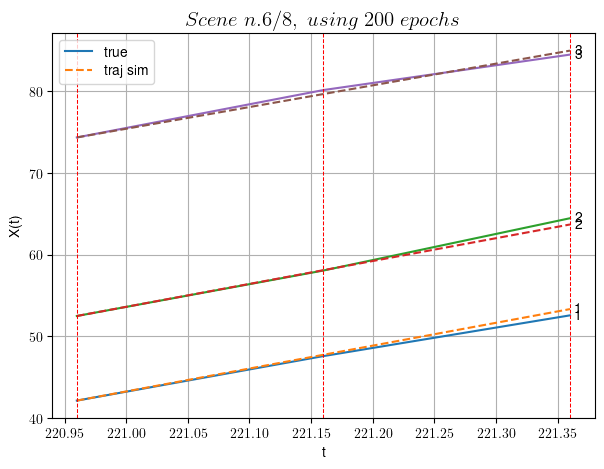

            Loss: 0.18637988037752853
            v0 updated: 26.583600781325373
----------------------------------------------------------------------------------------------------

Scene n.7/8, time interval:[166.56,167.36]
----------------------------------------------------------------------------------------------------


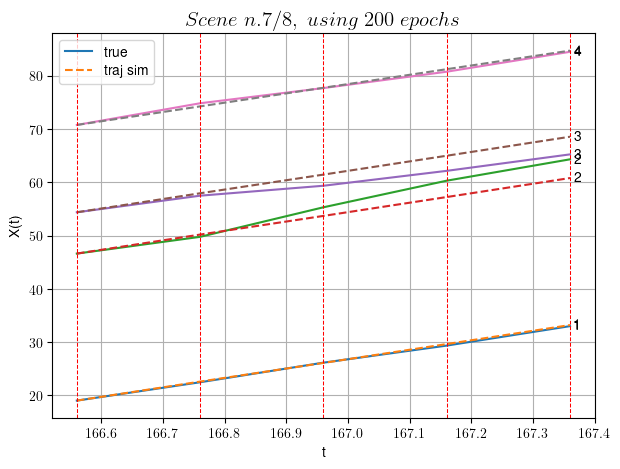

            Loss: 2.447206697686136
            v0 updated: 17.446466440824256
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 26.771402099536466
Time taken: 65.32s
In df n.8/10 we have 21 scenes
------------------------------------------------------------

Scene n.0/21, time interval:[36.44,37.04]
----------------------------------------------------------------------------------------------------


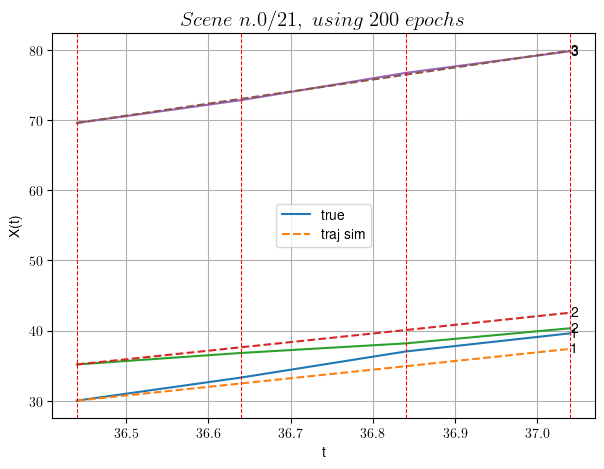

            Loss: 1.607148427712479
            v0 updated: 17.17089794364062
----------------------------------------------------------------------------------------------------

Scene n.1/21, time interval:[50.24,51.04]
----------------------------------------------------------------------------------------------------


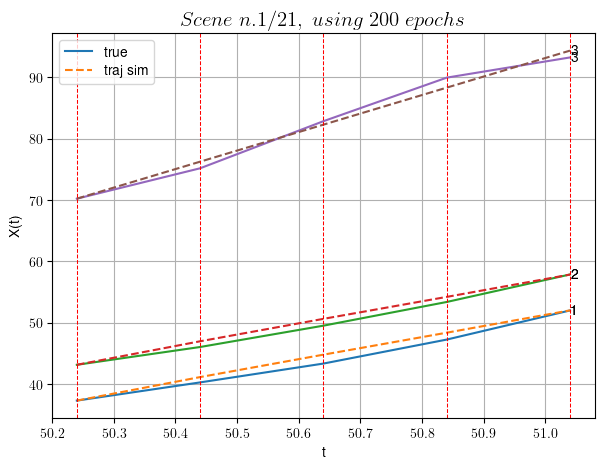

            Loss: 0.8178821959403538
            v0 updated: 30.15748786026172
----------------------------------------------------------------------------------------------------

Scene n.2/21, time interval:[102.24,103.04]
----------------------------------------------------------------------------------------------------


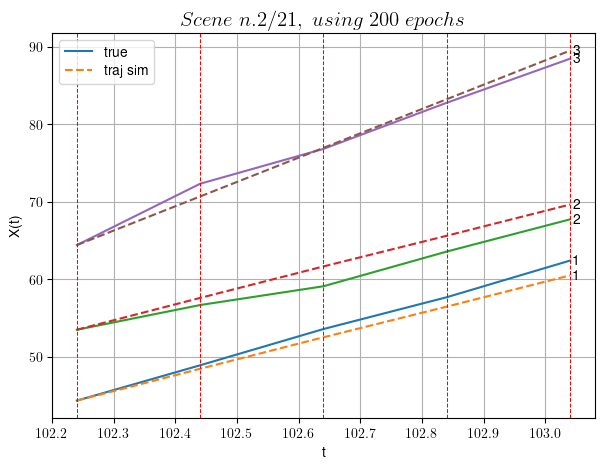

            Loss: 1.7094574889259455
            v0 updated: 31.34681154077697
----------------------------------------------------------------------------------------------------

Scene n.3/21, time interval:[108.84,109.44]
----------------------------------------------------------------------------------------------------


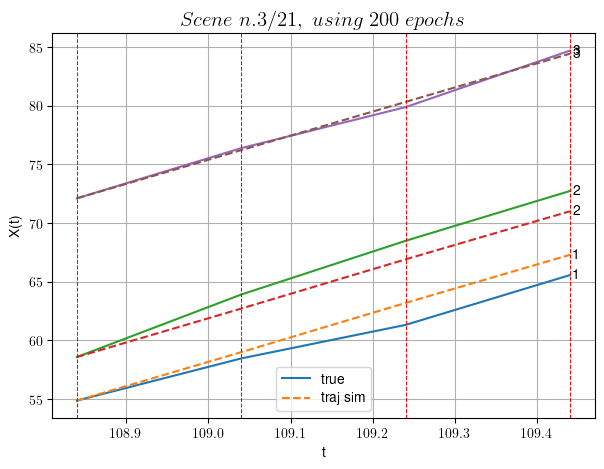

            Loss: 1.166618330669097
            v0 updated: 20.559392419821574
----------------------------------------------------------------------------------------------------

Scene n.4/21, time interval:[130.04,130.44]
----------------------------------------------------------------------------------------------------


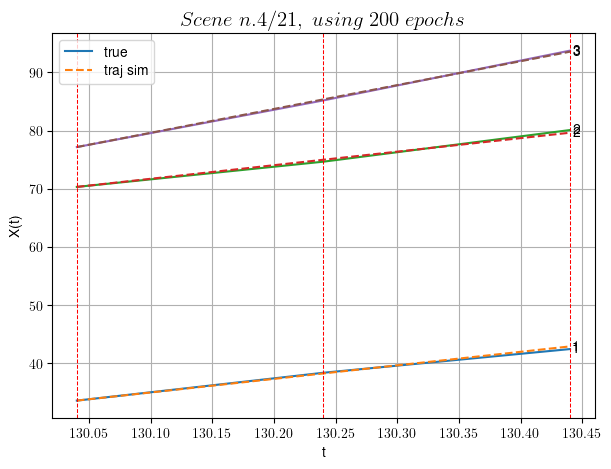

            Loss: 0.06782294220729948
            v0 updated: 41.04348308440233
----------------------------------------------------------------------------------------------------

Scene n.5/21, time interval:[215.24,216.24]
----------------------------------------------------------------------------------------------------


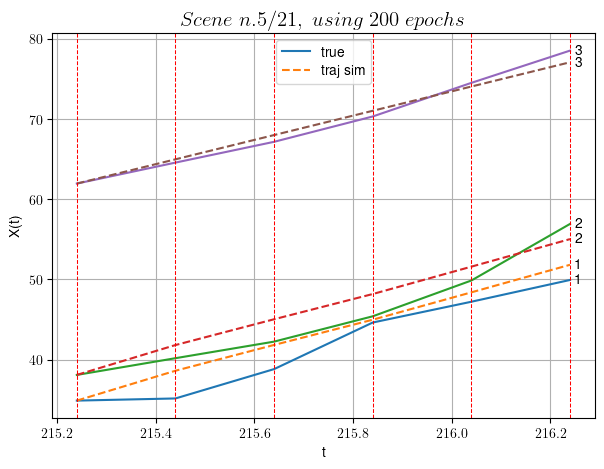

            Loss: 3.0258158533139494
            v0 updated: 15.117049251682298
----------------------------------------------------------------------------------------------------

Scene n.6/21, time interval:[222.64,223.44]
----------------------------------------------------------------------------------------------------


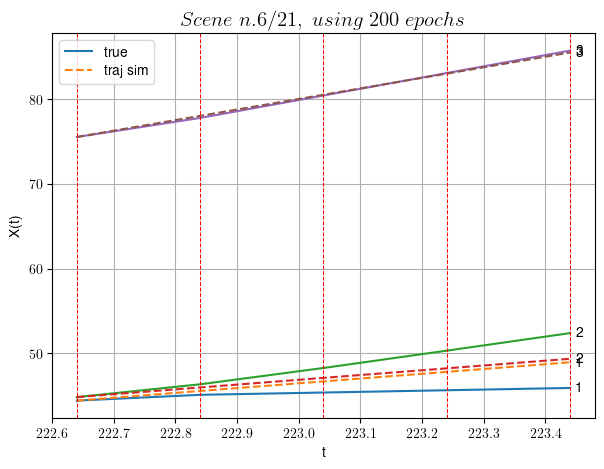

            Loss: 2.0598211337228944
            v0 updated: 12.44783182194636
----------------------------------------------------------------------------------------------------

Scene n.7/21, time interval:[225.24,226.24]
----------------------------------------------------------------------------------------------------


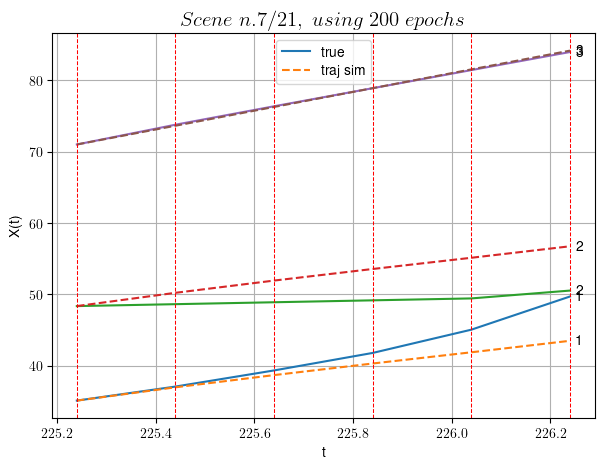

            Loss: 8.527268656929602
            v0 updated: 13.162191858706763
----------------------------------------------------------------------------------------------------

Scene n.8/21, time interval:[227.04,227.84]
----------------------------------------------------------------------------------------------------


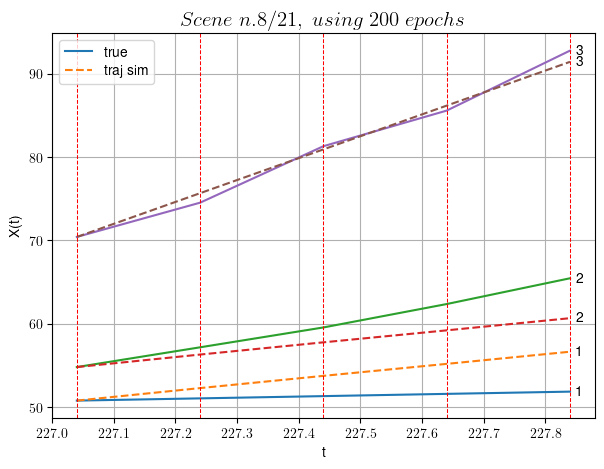

            Loss: 5.577761819347756
            v0 updated: 26.247280530693132
----------------------------------------------------------------------------------------------------

Scene n.9/21, time interval:[237.64,238.04]
----------------------------------------------------------------------------------------------------


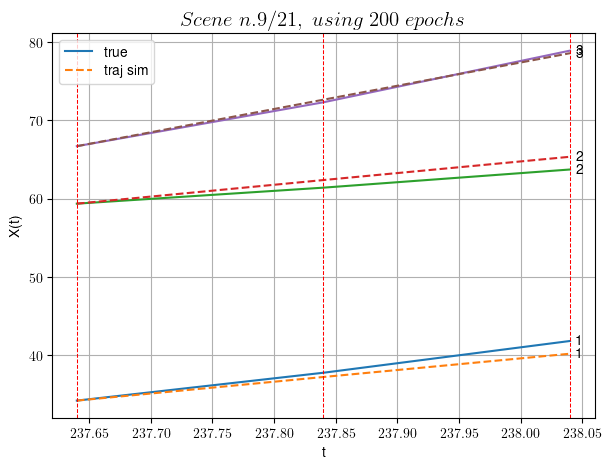

            Loss: 0.7498044822730331
            v0 updated: 29.70329363802171
----------------------------------------------------------------------------------------------------

Scene n.10/21, time interval:[239.84,240.24]
----------------------------------------------------------------------------------------------------


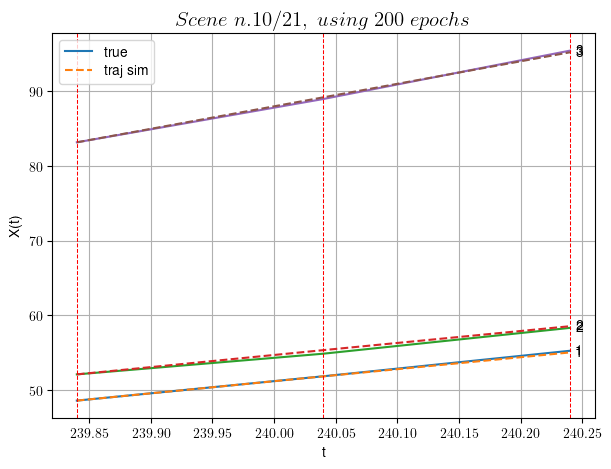

            Loss: 0.047612652223725134
            v0 updated: 30.13109543583857
----------------------------------------------------------------------------------------------------

Scene n.11/21, time interval:[243.44,244.24]
----------------------------------------------------------------------------------------------------


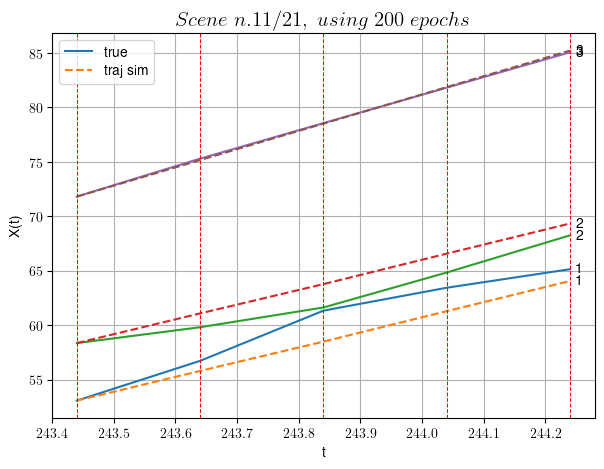

            Loss: 1.6805524654516217
            v0 updated: 16.757470726648734
----------------------------------------------------------------------------------------------------

Scene n.12/21, time interval:[251.64,252.64]
----------------------------------------------------------------------------------------------------


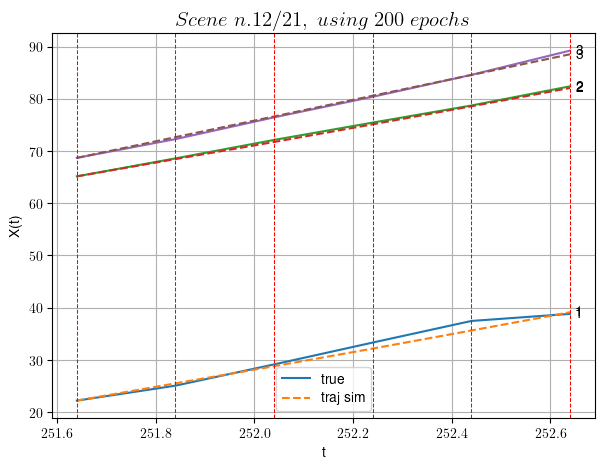

            Loss: 0.34468700930210056
            v0 updated: 19.83607847657935
----------------------------------------------------------------------------------------------------

Scene n.13/21, time interval:[290.84,291.44]
----------------------------------------------------------------------------------------------------


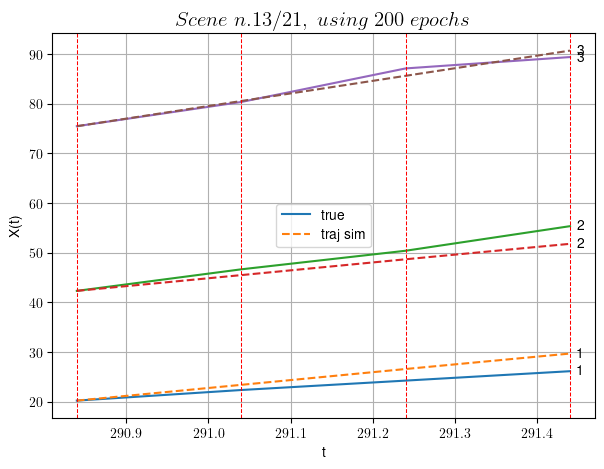

            Loss: 3.3398397193157607
            v0 updated: 25.383319029072275
----------------------------------------------------------------------------------------------------

Scene n.14/21, time interval:[350.64,351.64]
----------------------------------------------------------------------------------------------------


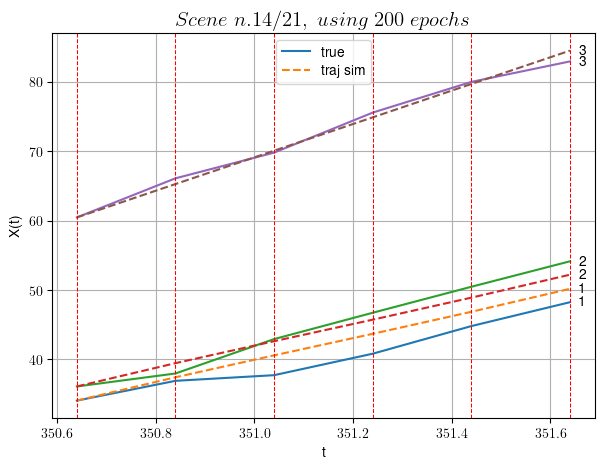

            Loss: 2.098073977875639
            v0 updated: 24.02412483477061
----------------------------------------------------------------------------------------------------

Scene n.15/21, time interval:[368.84,369.44]
----------------------------------------------------------------------------------------------------


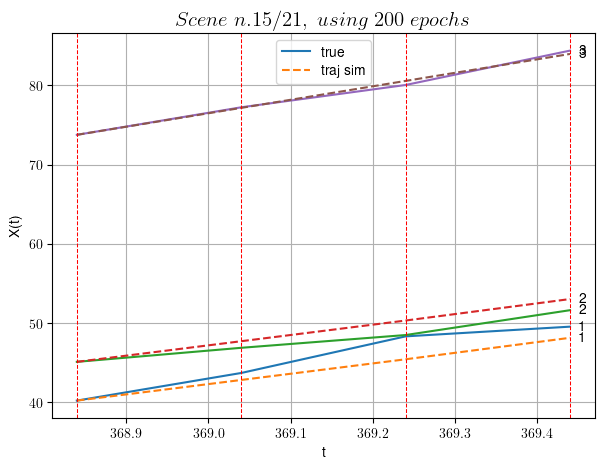

            Loss: 1.46795481931246
            v0 updated: 17.026272984526205
----------------------------------------------------------------------------------------------------

Scene n.16/21, time interval:[414.44,414.84]
----------------------------------------------------------------------------------------------------


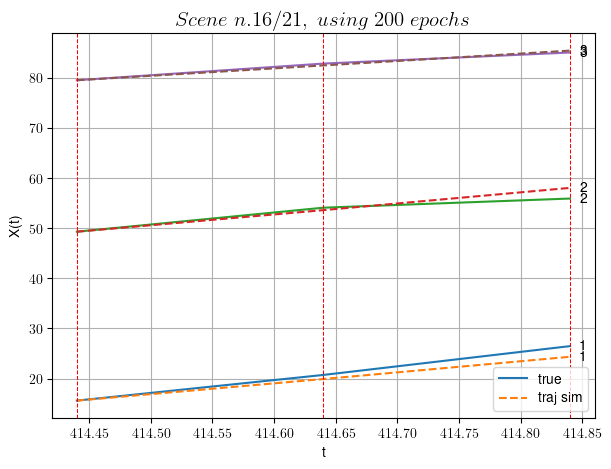

            Loss: 1.1329696394391984
            v0 updated: 14.756984069681192
----------------------------------------------------------------------------------------------------

Scene n.17/21, time interval:[477.84,478.84]
----------------------------------------------------------------------------------------------------


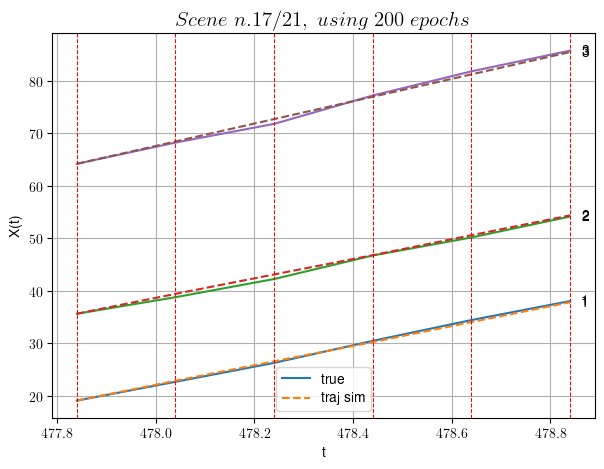

            Loss: 0.17282027767774696
            v0 updated: 21.27774697949253
----------------------------------------------------------------------------------------------------

Scene n.18/21, time interval:[522.64,523.04]
----------------------------------------------------------------------------------------------------


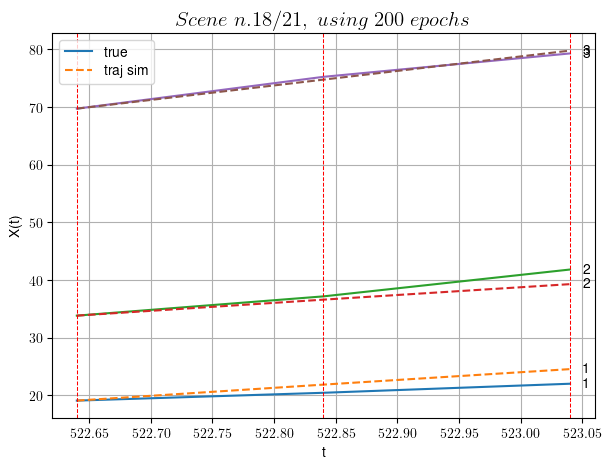

            Loss: 1.7405329270150158
            v0 updated: 25.161291688856604
----------------------------------------------------------------------------------------------------

Scene n.19/21, time interval:[593.04,594.44]
----------------------------------------------------------------------------------------------------


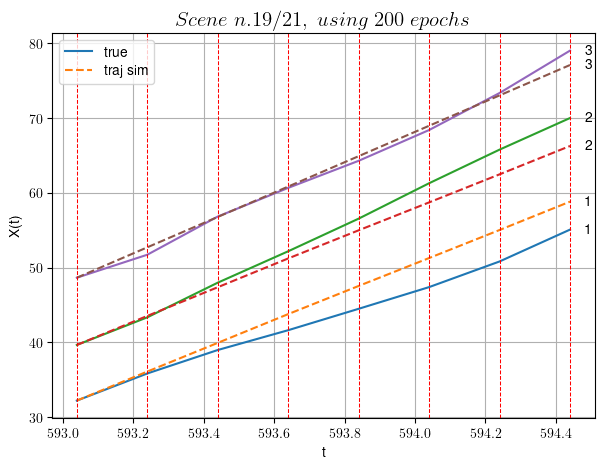

            Loss: 4.266746782735732
            v0 updated: 20.308489153886587
----------------------------------------------------------------------------------------------------

Scene n.20/21, time interval:[256.44,257.24]
----------------------------------------------------------------------------------------------------


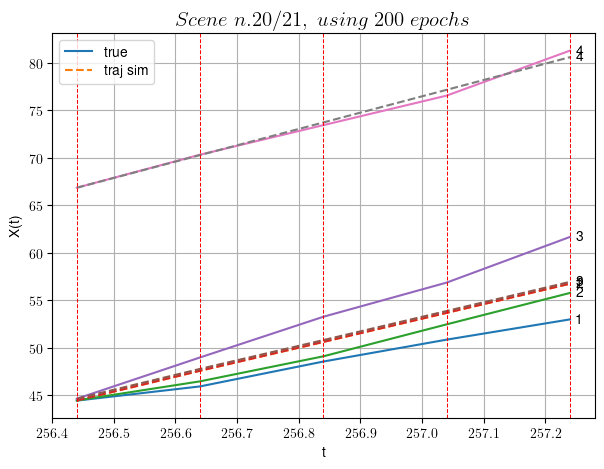

            Loss: 3.7383947085394618
            v0 updated: 17.1837181557306
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 23.488413422860777
Time taken: 210.72s
In df n.9/10 we have 9 scenes
------------------------------------------------------------

Scene n.0/9, time interval:[5.40,6.00]
----------------------------------------------------------------------------------------------------


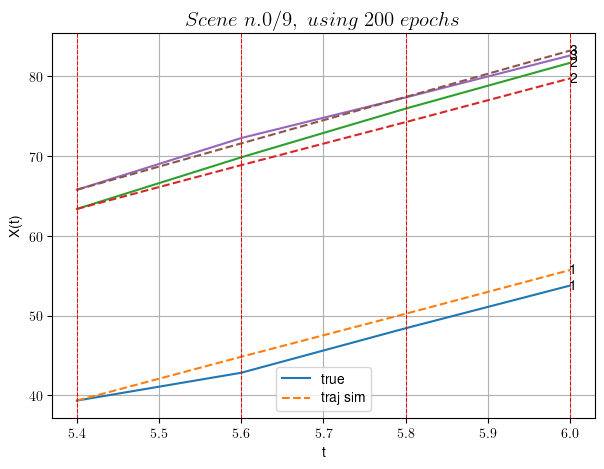

            Loss: 1.6310264136839192
            v0 updated: 29.082116036814494
----------------------------------------------------------------------------------------------------

Scene n.1/9, time interval:[20.80,21.20]
----------------------------------------------------------------------------------------------------


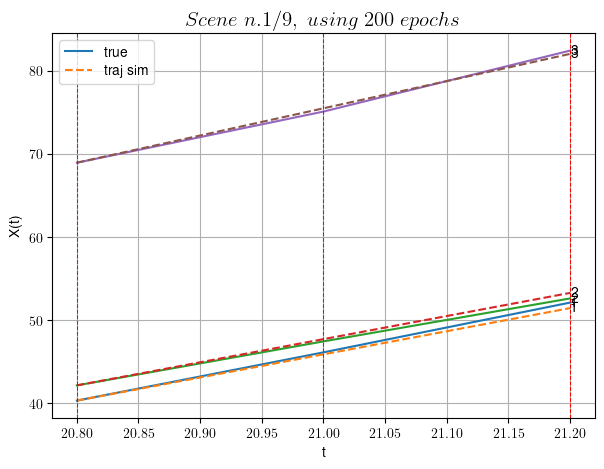

            Loss: 0.14726343881824253
            v0 updated: 32.73031035947344
----------------------------------------------------------------------------------------------------

Scene n.2/9, time interval:[37.80,39.00]
----------------------------------------------------------------------------------------------------


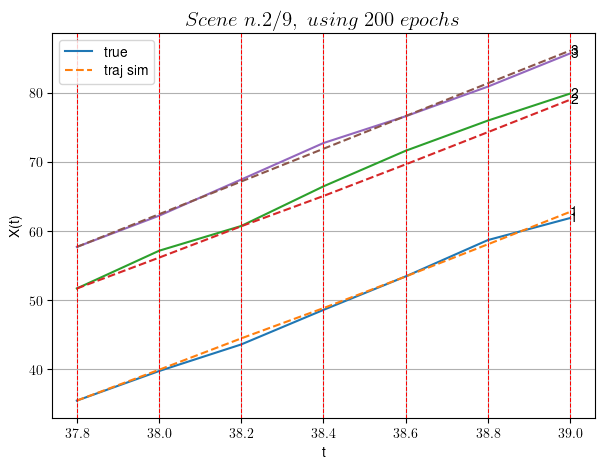

            Loss: 0.6485391571150407
            v0 updated: 23.646035475894625
----------------------------------------------------------------------------------------------------

Scene n.3/9, time interval:[44.40,44.80]
----------------------------------------------------------------------------------------------------


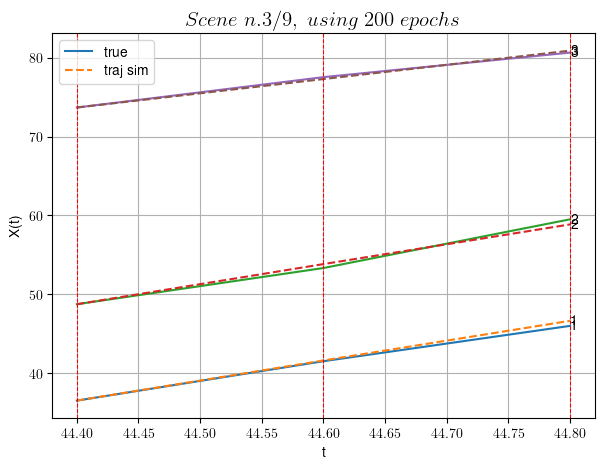

            Loss: 0.13471306351385923
            v0 updated: 18.029265194847504
----------------------------------------------------------------------------------------------------

Scene n.4/9, time interval:[117.80,118.40]
----------------------------------------------------------------------------------------------------


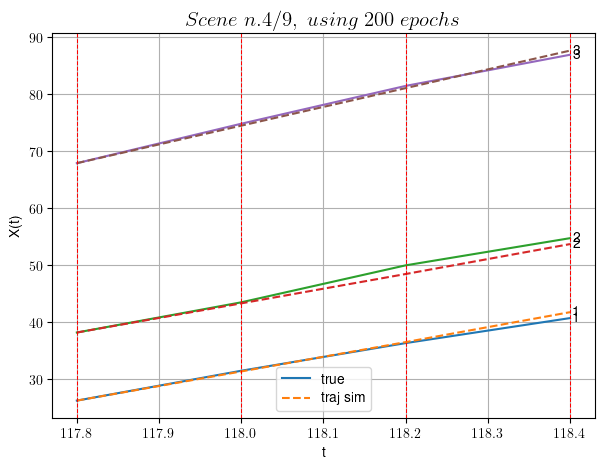

            Loss: 0.44610545310524335
            v0 updated: 32.94458888171542
----------------------------------------------------------------------------------------------------

Scene n.5/9, time interval:[119.20,119.60]
----------------------------------------------------------------------------------------------------


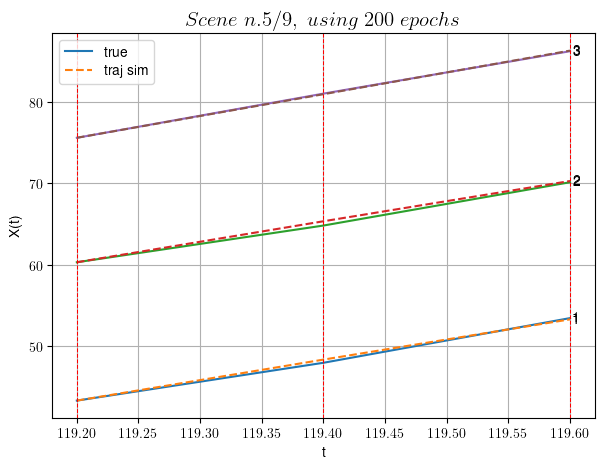

            Loss: 0.053791261537203455
            v0 updated: 26.738175294370425
----------------------------------------------------------------------------------------------------

Scene n.6/9, time interval:[120.20,120.60]
----------------------------------------------------------------------------------------------------


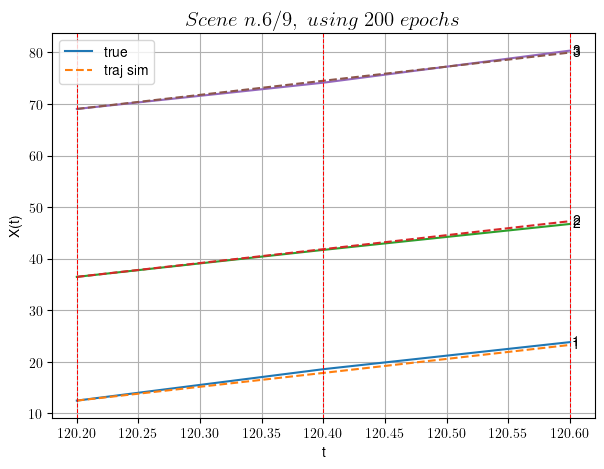

            Loss: 0.1569973539897888
            v0 updated: 27.35189815479499
----------------------------------------------------------------------------------------------------

Scene n.7/9, time interval:[121.40,122.00]
----------------------------------------------------------------------------------------------------


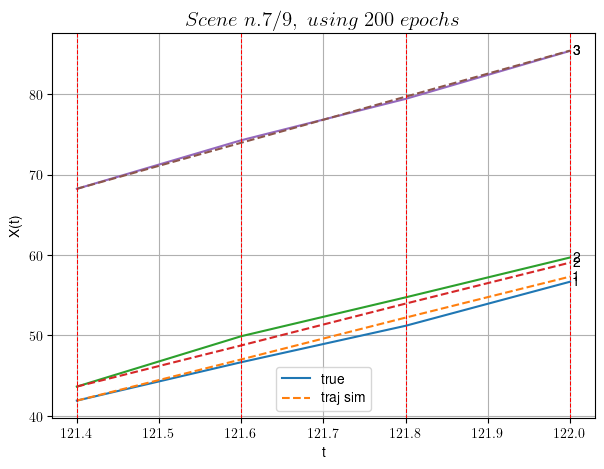

            Loss: 0.33765231744430696
            v0 updated: 28.659002486225642
----------------------------------------------------------------------------------------------------

Scene n.8/9, time interval:[205.80,206.20]
----------------------------------------------------------------------------------------------------


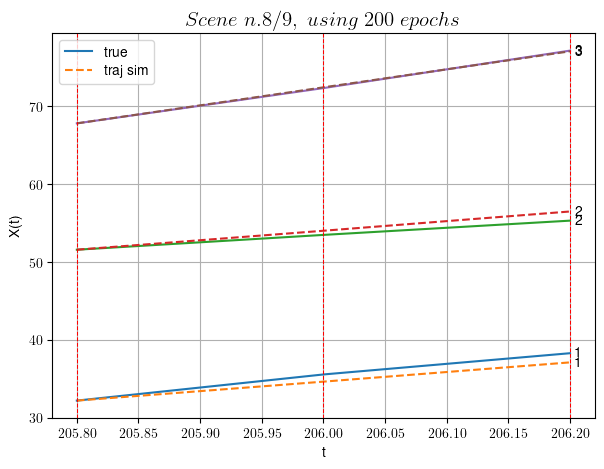

            Loss: 0.43722491255635093
            v0 updated: 23.166163068080635
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 27.382709798097288
Time taken: 85.64s
In df n.10/10 we have 22 scenes
------------------------------------------------------------

Scene n.0/22, time interval:[25.72,26.12]
----------------------------------------------------------------------------------------------------


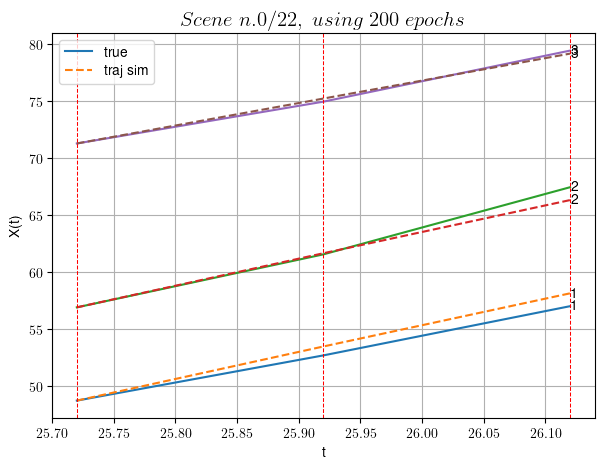

            Loss: 0.36847348466722535
            v0 updated: 19.720083475840415
----------------------------------------------------------------------------------------------------

Scene n.1/22, time interval:[71.72,73.12]
----------------------------------------------------------------------------------------------------


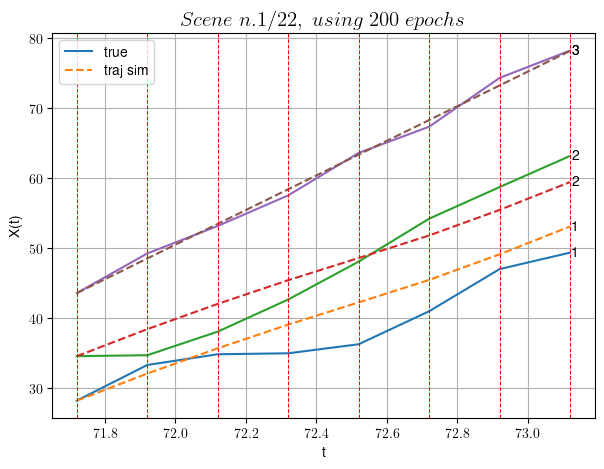

            Loss: 6.847991360283172
            v0 updated: 24.702003765073034
----------------------------------------------------------------------------------------------------

Scene n.2/22, time interval:[120.92,121.52]
----------------------------------------------------------------------------------------------------


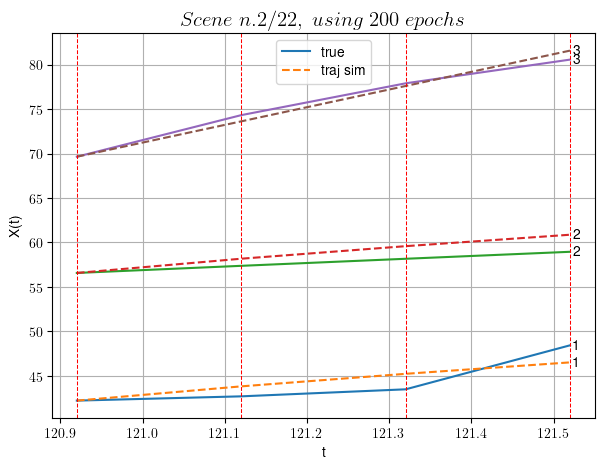

            Loss: 1.3263750053196102
            v0 updated: 19.88655316920097
----------------------------------------------------------------------------------------------------

Scene n.3/22, time interval:[122.12,122.72]
----------------------------------------------------------------------------------------------------


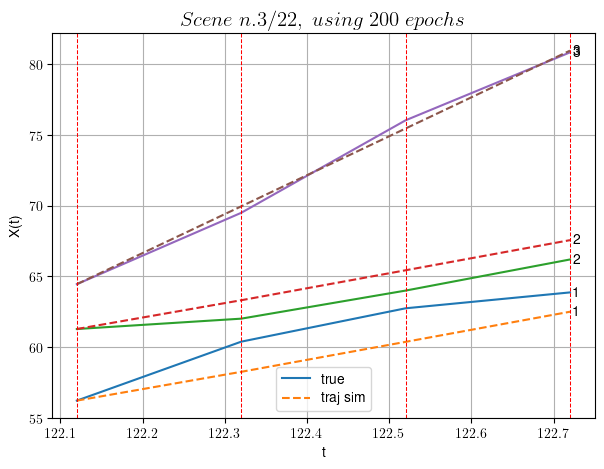

            Loss: 1.5196406574125596
            v0 updated: 27.530394625350453
----------------------------------------------------------------------------------------------------

Scene n.4/22, time interval:[194.52,195.12]
----------------------------------------------------------------------------------------------------


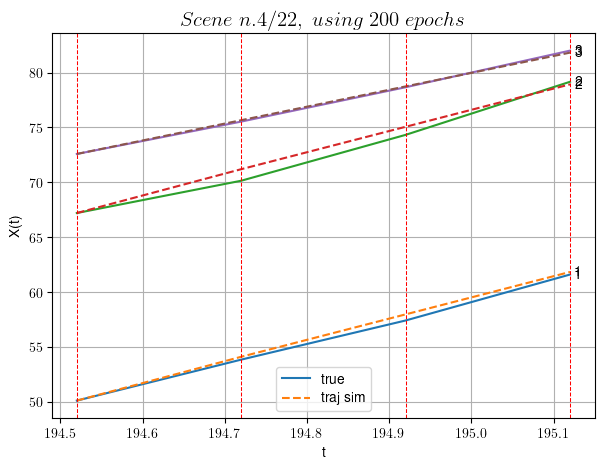

            Loss: 0.18282129299481356
            v0 updated: 15.401094076291631
----------------------------------------------------------------------------------------------------

Scene n.5/22, time interval:[201.52,203.12]
----------------------------------------------------------------------------------------------------


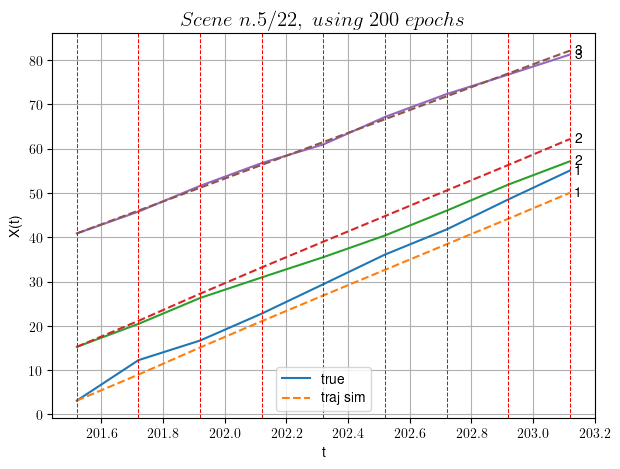

            Loss: 7.2348169552994746
            v0 updated: 25.802037842559233
----------------------------------------------------------------------------------------------------

Scene n.6/22, time interval:[210.12,210.52]
----------------------------------------------------------------------------------------------------


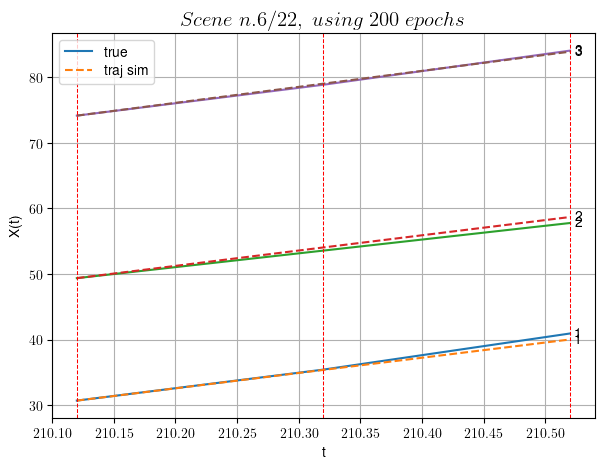

            Loss: 0.2172324595165367
            v0 updated: 24.389067074403897
----------------------------------------------------------------------------------------------------

Scene n.7/22, time interval:[236.52,237.12]
----------------------------------------------------------------------------------------------------


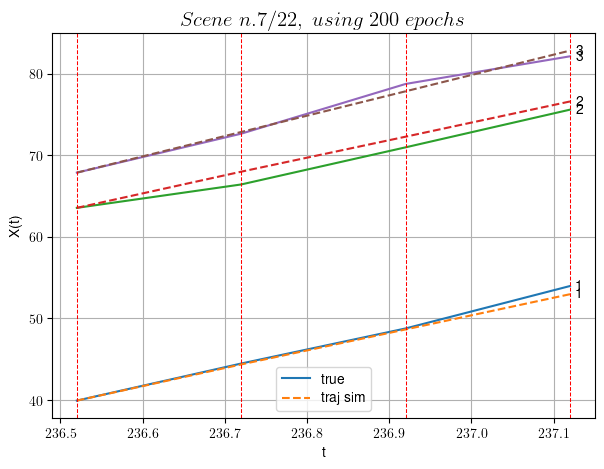

            Loss: 0.6288690930524585
            v0 updated: 24.94981202511928
----------------------------------------------------------------------------------------------------

Scene n.8/22, time interval:[237.72,238.12]
----------------------------------------------------------------------------------------------------


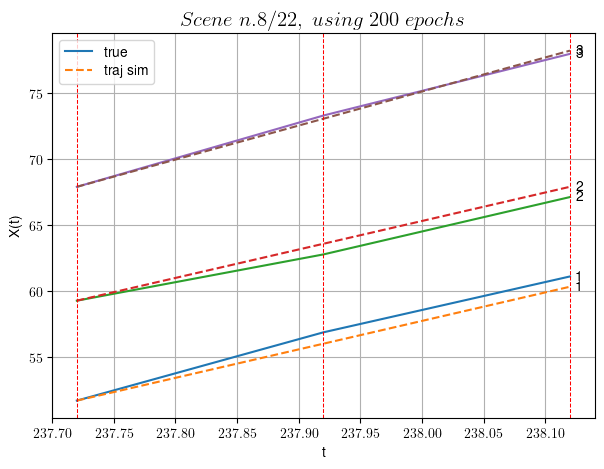

            Loss: 0.3032408935149323
            v0 updated: 25.837168308446394
----------------------------------------------------------------------------------------------------

Scene n.9/22, time interval:[317.32,318.52]
----------------------------------------------------------------------------------------------------


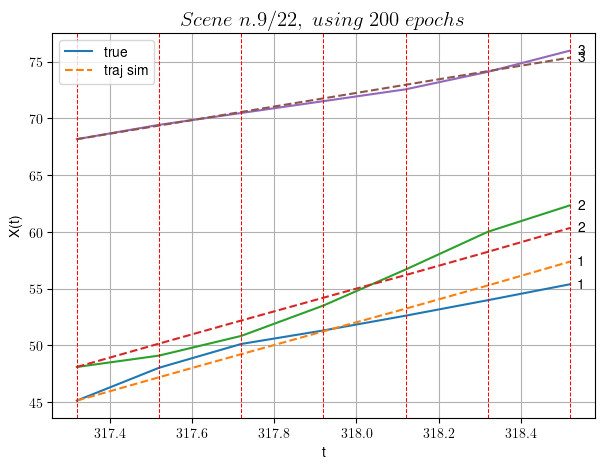

            Loss: 0.9012554819457385
            v0 updated: 5.985788274819661
----------------------------------------------------------------------------------------------------

Scene n.10/22, time interval:[321.12,321.92]
----------------------------------------------------------------------------------------------------


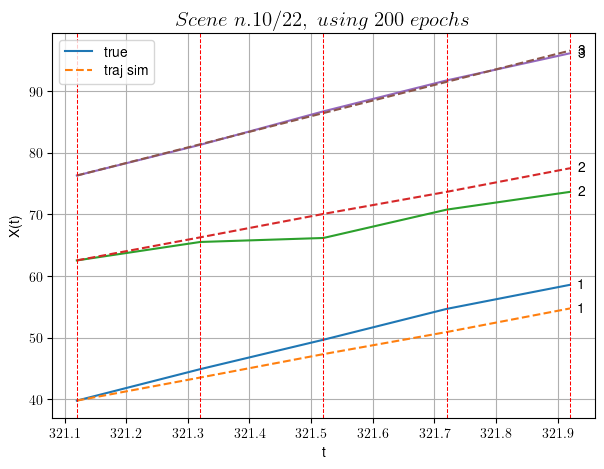

            Loss: 5.014852959823415
            v0 updated: 25.333558083094214
----------------------------------------------------------------------------------------------------

Scene n.11/22, time interval:[323.12,323.92]
----------------------------------------------------------------------------------------------------


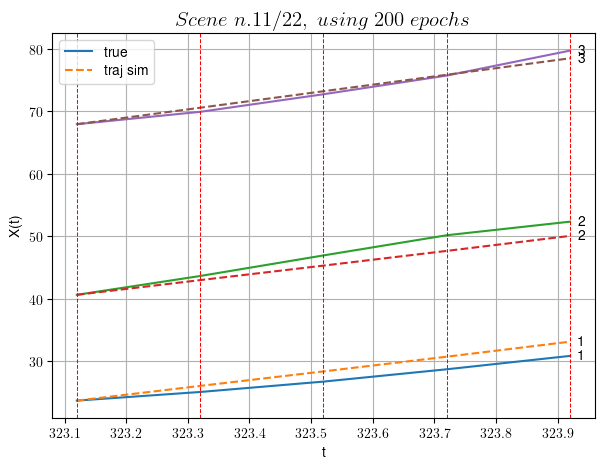

            Loss: 1.971125040597303
            v0 updated: 13.179806245671685
----------------------------------------------------------------------------------------------------

Scene n.12/22, time interval:[337.72,338.32]
----------------------------------------------------------------------------------------------------


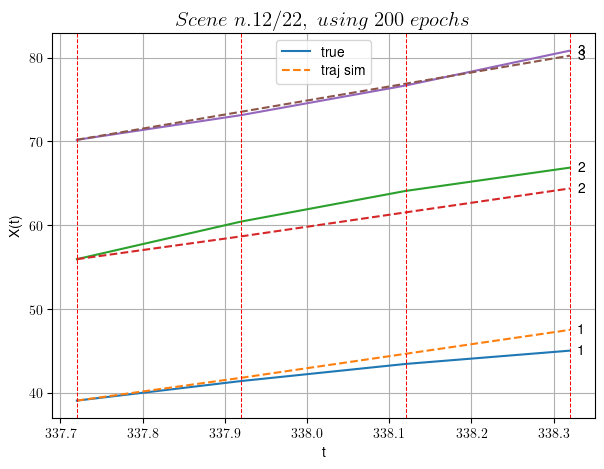

            Loss: 2.0157349917027507
            v0 updated: 16.753005814325554
----------------------------------------------------------------------------------------------------

Scene n.13/22, time interval:[369.32,369.92]
----------------------------------------------------------------------------------------------------


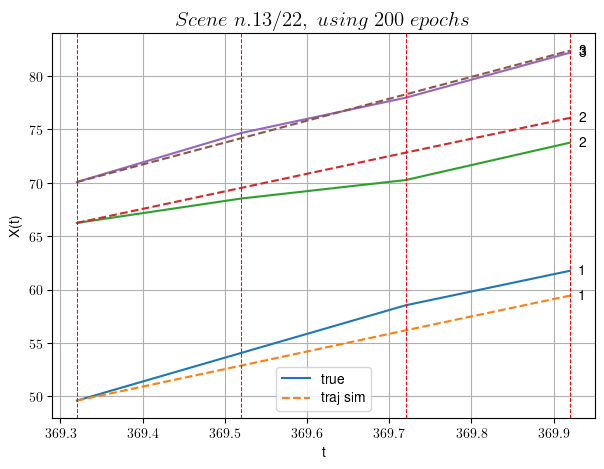

            Loss: 2.139113283649327
            v0 updated: 20.519283368429512
----------------------------------------------------------------------------------------------------

Scene n.14/22, time interval:[370.92,372.12]
----------------------------------------------------------------------------------------------------


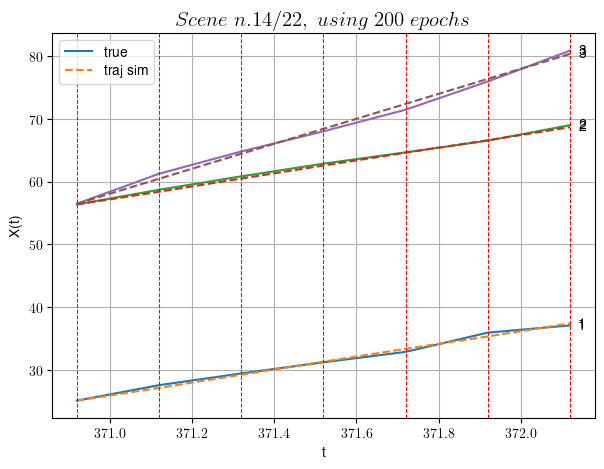

            Loss: 0.17247550559182645
            v0 updated: 19.903219040074042
----------------------------------------------------------------------------------------------------

Scene n.15/22, time interval:[376.92,377.52]
----------------------------------------------------------------------------------------------------


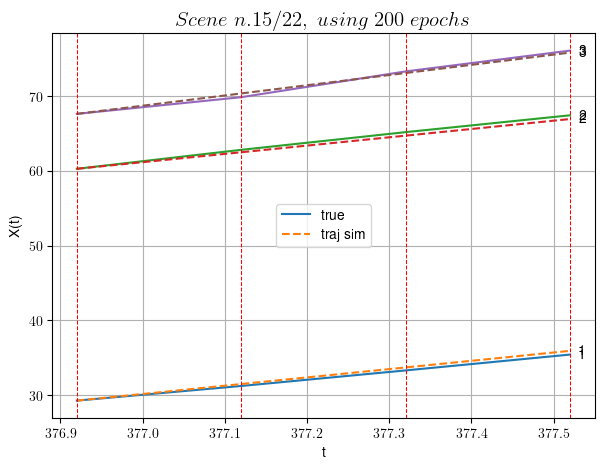

            Loss: 0.11729492742396797
            v0 updated: 13.647641075586602
----------------------------------------------------------------------------------------------------

Scene n.16/22, time interval:[433.52,434.12]
----------------------------------------------------------------------------------------------------


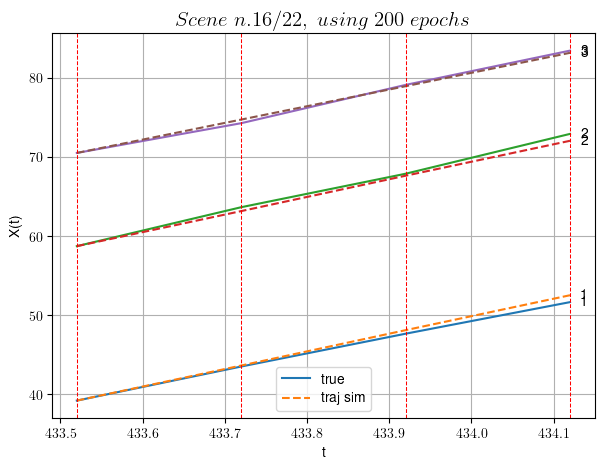

            Loss: 0.19647536597438106
            v0 updated: 21.105455587309343
----------------------------------------------------------------------------------------------------

Scene n.17/22, time interval:[483.92,484.32]
----------------------------------------------------------------------------------------------------


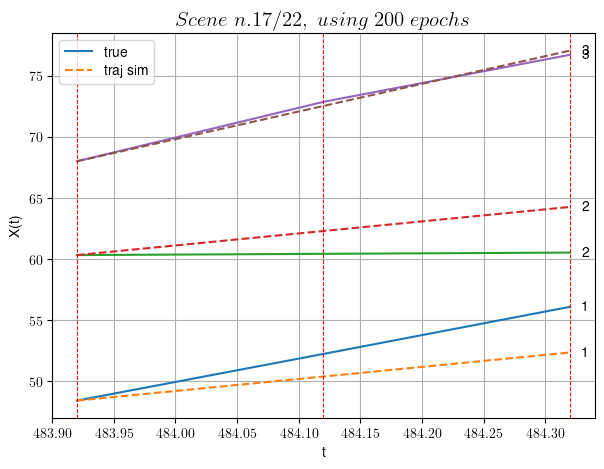

            Loss: 3.8862334834657037
            v0 updated: 22.627021467100167
----------------------------------------------------------------------------------------------------

Scene n.18/22, time interval:[531.72,532.32]
----------------------------------------------------------------------------------------------------


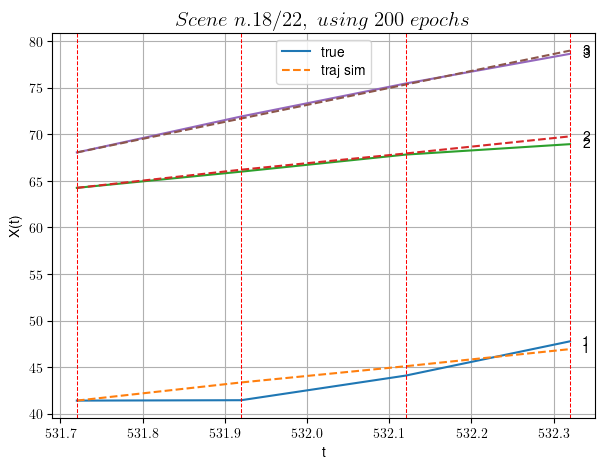

            Loss: 0.5238435145756729
            v0 updated: 18.218124824359563
----------------------------------------------------------------------------------------------------

Scene n.19/22, time interval:[202.52,203.12]
----------------------------------------------------------------------------------------------------


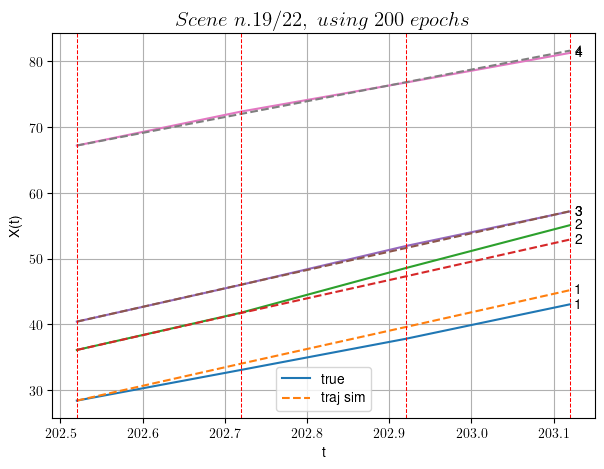

            Loss: 0.9657045257352089
            v0 updated: 24.051027652058547
----------------------------------------------------------------------------------------------------

Scene n.20/22, time interval:[342.92,343.32]
----------------------------------------------------------------------------------------------------


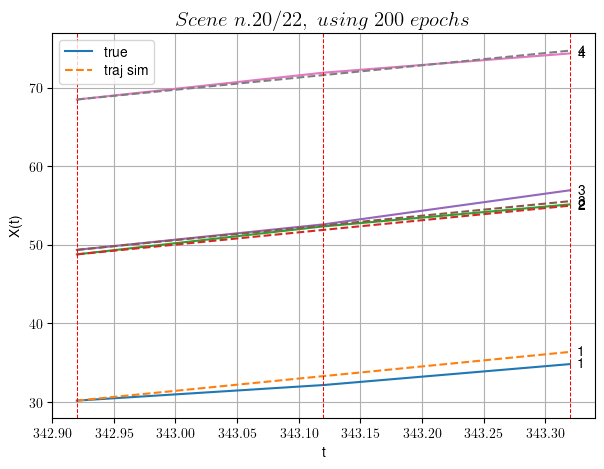

            Loss: 0.5077826544566133
            v0 updated: 15.561057585233684
----------------------------------------------------------------------------------------------------

Scene n.21/22, time interval:[441.12,441.52]
----------------------------------------------------------------------------------------------------


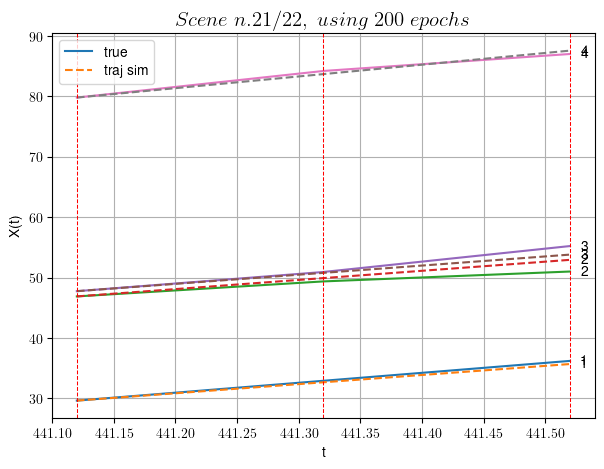

            Loss: 0.580726939397526
            v0 updated: 19.41820764628245
----------------------------------------------------------------------------------------------------

v0_mean in this df is: 21.719465520143626
Time taken: 226.99s
Time taken: 1896.07s


In [5]:
import time

#v0_mean_list = []
v0_dflist = []

start_time2 = time.time()

for df in dflist:
    
    v0 = 30
    start_time1 = time.time()

    print("=="*30)
    print(f"In df n.{df['N. file'][0]}/{len(dflist)} we have {len(df)} scenes")
    print("--"*30)
    info_df = solve_nn_df(df, model, v0, NUM_EPOCHS, LEARNING_RATE_NN, LEARNING_RATE_v0, flag_print)
    
    v0_list = [l[1] for l in info_df]
    v0_mean = np.array(v0_list).mean()
    #v0_mean_list.append(v0_mean)
    
    v0_df = pd.DataFrame({'v0_list': v0_list,\
                          'n_scn': len(df),\
                          'N. file': df['N. file'][0]})
    
    v0_dflist.append(v0_df)
    
    print(f"\nv0_mean in this df is: {v0_mean}")
    print("Time taken: %.2fs" % (time.time() - start_time1))

    print("=="*30)
time_taken=time.time() - start_time2
print("Time taken: %.2fs" % (time_taken))

## Plot

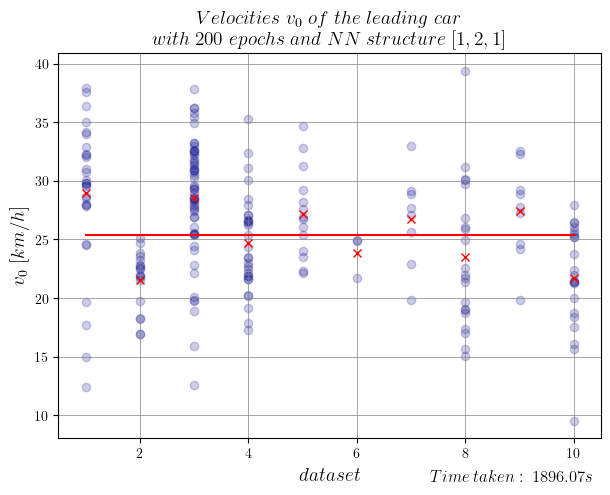

In [6]:
# Initialize the figure
width, height = 7, 5
fig, ax = plt.subplots(figsize=(width,height))

v0_mean_dflist = []
for v0_df in v0_dflist:
    ax.scatter(v0_df['N. file'], v0_df['v0_list'], alpha = .2, color = 'darkblue');
    v0_mean_df = v0_df['v0_list'].mean()
    ax.plot(v0_df['N. file'][0], v0_mean_df, color = 'r', marker="x"); # line of best values
    v0_mean_dflist.append(v0_mean_df)

tmp = np.array(v0_mean_dflist).mean()
ax.plot(range(1,len(v0_dflist)+1), [tmp] * (len(v0_dflist)), color = 'r'); # line of best values

ax.set_xlabel(r"$data set$",fontsize=14)
ax.set_ylabel(r"$v_{0}\ [km/h]$",fontsize=14)
ax.set_title(fr"$Velocities\ v_{0}\ of\ the\ leading\ car$"
               "\n"  # Newline: the backslash is interpreted as usual
             fr"$with\ {NUM_EPOCHS}\ epochs\ and\ NN\ structure\ {str(DOE[0])}$",fontsize=14)

xlim = [0.5,10.5]
ax.set_xlim(xlim)
ylim = ax.get_ylim()
s = fr"$Time\ taken:\ {'{0:.02f}'.format(time_taken)}s$"
ax.text(xlim[1]*0.7,ylim[0]*0.54,s, fontsize=12)

ax.grid(color='grey', linestyle='-', linewidth=0.5);


# fig.suptitle('Forward Subset Selection',fontsize=25, y=0.98);
# fig.subplots_adjust(top=0.8)
plt.show()

### Save the figure

In [7]:
# Save figure
ext = ".svg"
xs = DOE[0]
s = ''.join(str(x) for x in xs)
title = f"v0_{NUM_EPOCHS}epochs_NN{s}"
fig.savefig("img/"+title+ext, bbox_inches='tight')